In [1]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
from scipy import stats

# Function to generate random dates
def random_dates(start, end, n=10):
    return [start + timedelta(days=np.random.randint(0, (end - start).days)) for _ in range(n)]

# Parameters
num_records = 10000
start_date = datetime.now() - timedelta(days=4*365)
end_date = datetime.now()

# Expanded categories
business_lines = [
    "Retail", "Corporate Banking", "Investment Banking", "Insurance",
    "Wealth Management", "Asset Management", "Private Banking",
    "Credit Card Services", "Mortgage Lending", "Financial Advisory"
]

event_types = [
    "Fraud", "System Failure", "Theft", "Compliance", "Natural Disaster",
    "Cyber Attack", "Market Risk", "Operational Error", "Vendor Risk", "Regulatory Violation"
]

# Generate data
data = {
    "Date": random_dates(start_date, end_date, num_records),
    "Unique Event ID": [f"EID{str(i).zfill(5)}" for i in range(num_records)],
    "Event Type": np.random.choice(event_types, num_records),
    "Business Line": np.random.choice(business_lines, num_records),
    "Event Description": np.random.choice(
        [
            "Unauthorized transaction", "Server downtime", "Lost assets", 
            "Regulatory fines", "Data breach", "Network failure", 
            "Inadequate compliance", "Financial misstatement", 
            "Supplier issues", "Internal fraud"
        ],
        num_records
    ),
    "Net Loss Amount": np.random.choice(
        [np.random.uniform(-10000, 0) for _ in range(num_records // 2)] + 
        [np.random.uniform(0, 10000) for _ in range(num_records // 2)],
        num_records
    )
}

# Create DataFrame
df = pd.DataFrame(data)

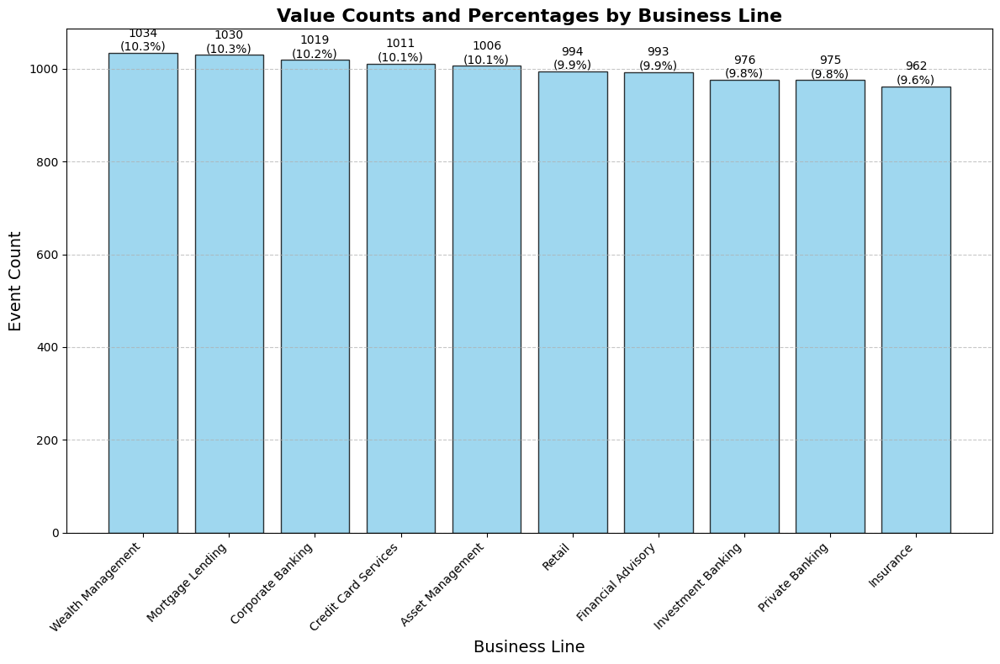

In [2]:
import matplotlib.pyplot as plt
import pandas as pd

# Calculate value counts and percentages for Business Line
business_line_counts = df["Business Line"].value_counts()
business_line_percentages = (business_line_counts / len(df)) * 100

# Create a DataFrame for easier manipulation
business_line_summary = pd.DataFrame({
    "Count": business_line_counts,
    "Percentage": business_line_percentages
}).reset_index().rename(columns={"index": "Business Line"})

# Plot the data
plt.figure(figsize=(12, 8))
bars = plt.bar(
    business_line_summary["Business Line"],
    business_line_summary["Count"],
    color="skyblue",
    edgecolor="black",
    alpha=0.8
)

# Annotate each bar with the count and percentage
for bar, count, percentage in zip(bars, business_line_summary["Count"], business_line_summary["Percentage"]):
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        f"{count}\n({percentage:.1f}%)",
        ha="center",
        va="bottom",
        fontsize=10,
        color="black"
    )

# Title and labels
plt.title("Value Counts and Percentages by Business Line", fontsize=16, fontweight="bold")
plt.xlabel("Business Line", fontsize=14)
plt.ylabel("Event Count", fontsize=14)

# Rotate X-axis labels for better readability
plt.xticks(rotation=45, ha="right")

# Add gridlines
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Display the plot
plt.tight_layout()
plt.show()


C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\2909400866.py:34: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.text(bar.get_x() + bar.get_width() / 2, height + 1000, f'{height:,.0f} ({net_loss_percentage[i]:.1f}%)',


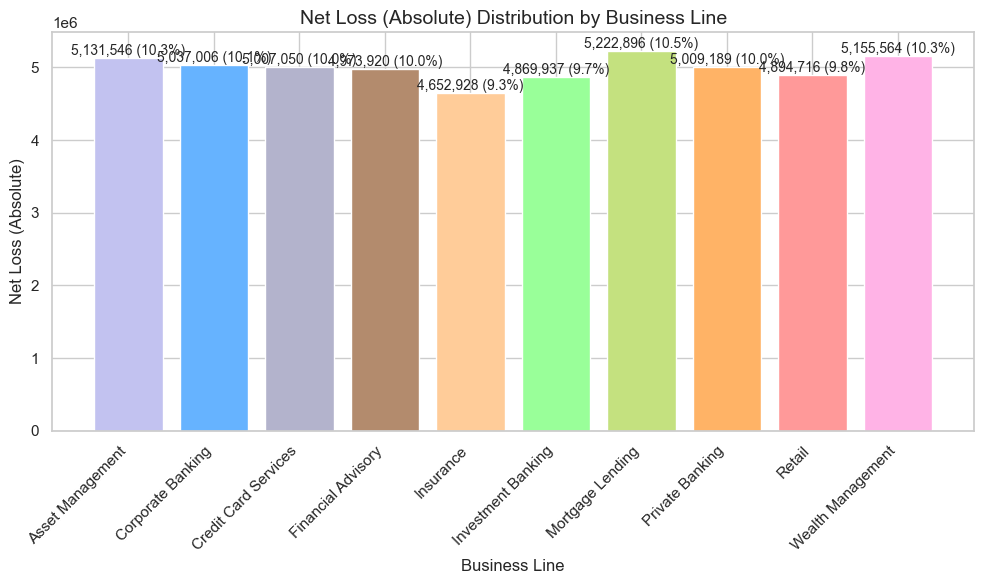

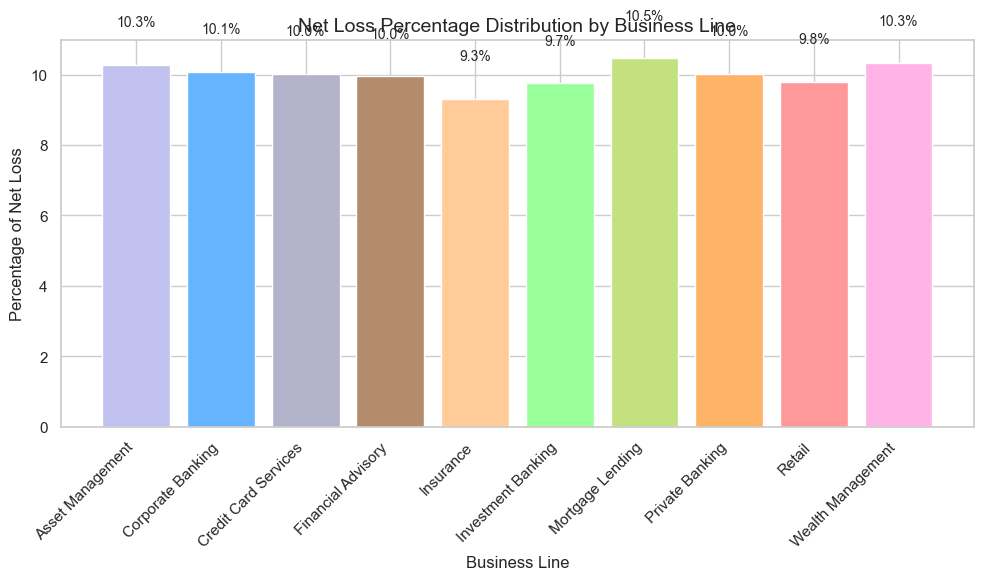

In [26]:
import matplotlib.pyplot as plt

# Prepare data
df['Net Loss Absolute'] = df['Net Loss Amount'].abs()  # Use absolute values for Net Loss
grouped_data = df.groupby('Business Line').agg({
    'Net Loss Absolute': 'sum',  # Sum of absolute Net Loss
    'Unique Event ID': 'count'   # Count of events
}).rename(columns={'Unique Event ID': 'Event Count'})

# Calculate percentages
net_loss_percentage = grouped_data['Net Loss Absolute'] / grouped_data['Net Loss Absolute'].sum() * 100

# Custom colors for each Business Line
custom_colors = {
    "Retail": "#ff9999",          # Light Red
    "Corporate Banking": "#66b3ff",  # Light Blue
    "Investment Banking": "#99ff99", # Light Green
    "Insurance": "#ffcc99",        # Light Orange
    "Wealth Management": "#ffb3e6", # Light Pink
    "Asset Management": "#c2c2f0",  # Lavender
    "Private Banking": "#ffb366",   # Light Yellow
    "Credit Card Services": "#b3b3cc", # Light Grey
    "Mortgage Lending": "#c4e17f",  # Light Greenish Yellow
    "Financial Advisory": "#b38b6d"  # Brownish
}

# Bar graph for Net Loss (Absolute)
fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.bar(grouped_data.index, grouped_data['Net Loss Absolute'], color=[custom_colors[bl] for bl in grouped_data.index])

# Add percentage values on top of each bar
for i, bar in enumerate(bars):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height + 1000, f'{height:,.0f} ({net_loss_percentage[i]:.1f}%)', 
            ha='center', va='bottom', fontsize=10)

# Title and labels
ax.set_title("Net Loss (Absolute) Distribution by Business Line", fontsize=14)
ax.set_xlabel("Business Line", fontsize=12)
ax.set_ylabel("Net Loss (Absolute)", fontsize=12)

plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

# Bar graph for Net Loss Percentage
fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.bar(grouped_data.index, net_loss_percentage, color=[custom_colors[bl] for bl in grouped_data.index])

# Add percentage values on top of each bar
for i, bar in enumerate(bars):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height + 1, f'{height:.1f}%', 
            ha='center', va='bottom', fontsize=10)

# Title and labels
ax.set_title("Net Loss Percentage Distribution by Business Line", fontsize=14)
ax.set_xlabel("Business Line", fontsize=12)
ax.set_ylabel("Percentage of Net Loss", fontsize=12)

plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


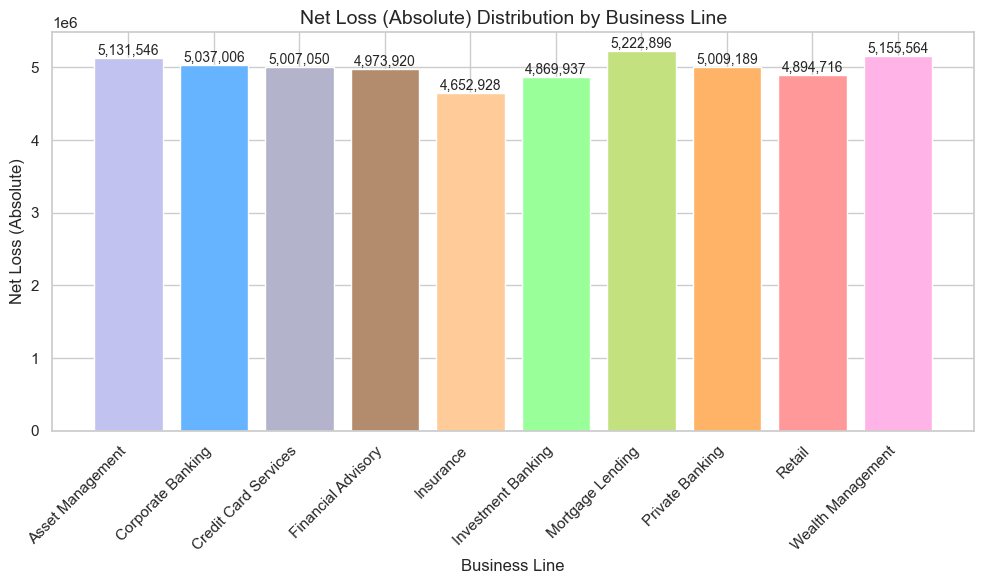

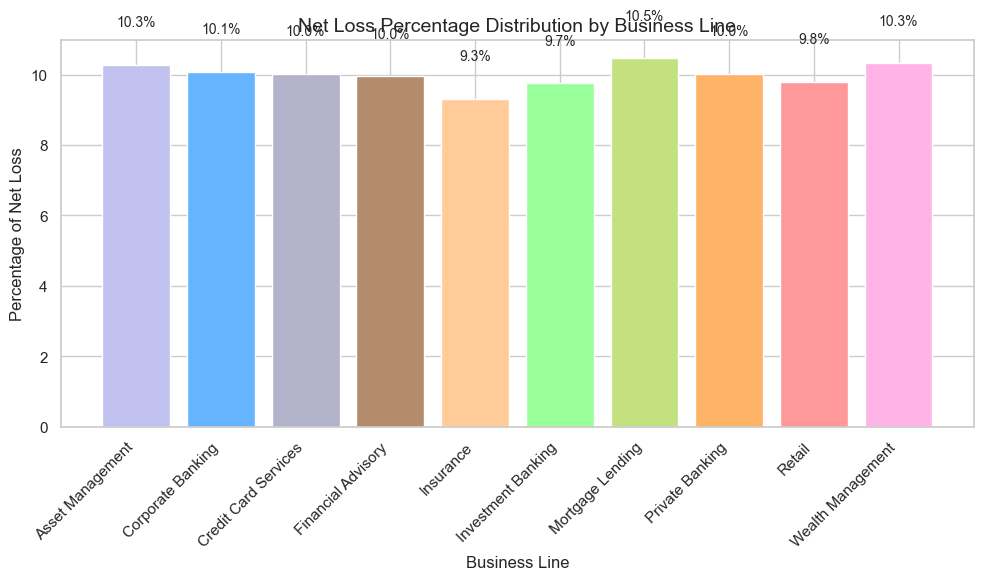

In [27]:
import matplotlib.pyplot as plt

# Prepare data
df['Net Loss Absolute'] = df['Net Loss Amount'].abs()  # Use absolute values for Net Loss
grouped_data = df.groupby('Business Line').agg({
    'Net Loss Absolute': 'sum',  # Sum of absolute Net Loss
    'Unique Event ID': 'count'   # Count of events
}).rename(columns={'Unique Event ID': 'Event Count'})

# Calculate percentages
net_loss_percentage = grouped_data['Net Loss Absolute'] / grouped_data['Net Loss Absolute'].sum() * 100

# Custom colors for each Business Line
custom_colors = {
    "Retail": "#ff9999",          # Light Red
    "Corporate Banking": "#66b3ff",  # Light Blue
    "Investment Banking": "#99ff99", # Light Green
    "Insurance": "#ffcc99",        # Light Orange
    "Wealth Management": "#ffb3e6", # Light Pink
    "Asset Management": "#c2c2f0",  # Lavender
    "Private Banking": "#ffb366",   # Light Yellow
    "Credit Card Services": "#b3b3cc", # Light Grey
    "Mortgage Lending": "#c4e17f",  # Light Greenish Yellow
    "Financial Advisory": "#b38b6d"  # Brownish
}

# Bar graph for Net Loss (Absolute)
fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.bar(grouped_data.index, grouped_data['Net Loss Absolute'], color=[custom_colors[bl] for bl in grouped_data.index])

# Add percentage values on top of each bar for Net Loss (Absolute)
for i, bar in enumerate(bars):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height + 1000, f'{height:,.0f}', 
            ha='center', va='bottom', fontsize=10)

# Title and labels for Net Loss Absolute
ax.set_title("Net Loss (Absolute) Distribution by Business Line", fontsize=14)
ax.set_xlabel("Business Line", fontsize=12)
ax.set_ylabel("Net Loss (Absolute)", fontsize=12)

plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

# Bar graph for Net Loss Percentage
fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.bar(grouped_data.index, net_loss_percentage, color=[custom_colors[bl] for bl in grouped_data.index])

# Add percentage values on top of each bar for Net Loss Percentage
for i, bar in enumerate(bars):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height + 1, f'{height:.1f}%', 
            ha='center', va='bottom', fontsize=10)

# Title and labels for Net Loss Percentage
ax.set_title("Net Loss Percentage Distribution by Business Line", fontsize=14)
ax.set_xlabel("Business Line", fontsize=12)
ax.set_ylabel("Percentage of Net Loss", fontsize=12)

plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


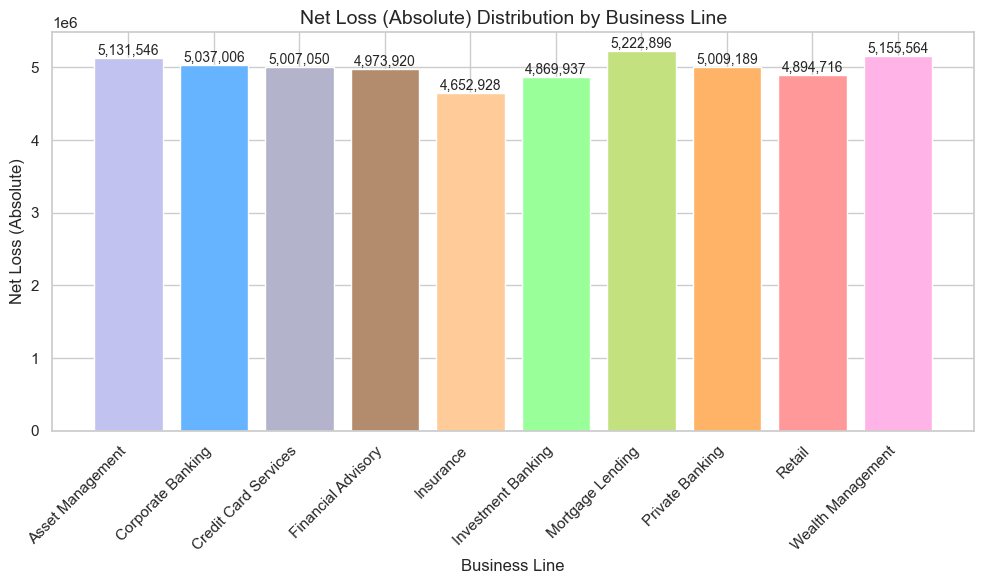

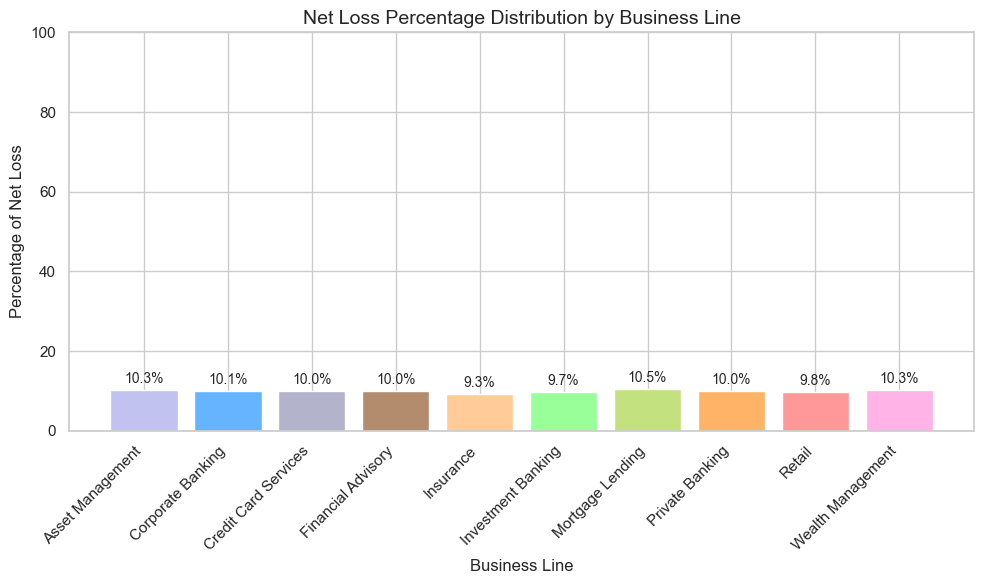

In [28]:
import matplotlib.pyplot as plt

# Prepare data
df['Net Loss Absolute'] = df['Net Loss Amount'].abs()  # Use absolute values for Net Loss
grouped_data = df.groupby('Business Line').agg({
    'Net Loss Absolute': 'sum',  # Sum of absolute Net Loss
    'Unique Event ID': 'count'   # Count of events
}).rename(columns={'Unique Event ID': 'Event Count'})

# Calculate percentages
net_loss_percentage = grouped_data['Net Loss Absolute'] / grouped_data['Net Loss Absolute'].sum() * 100

# Custom colors for each Business Line
custom_colors = {
    "Retail": "#ff9999",          # Light Red
    "Corporate Banking": "#66b3ff",  # Light Blue
    "Investment Banking": "#99ff99", # Light Green
    "Insurance": "#ffcc99",        # Light Orange
    "Wealth Management": "#ffb3e6", # Light Pink
    "Asset Management": "#c2c2f0",  # Lavender
    "Private Banking": "#ffb366",   # Light Yellow
    "Credit Card Services": "#b3b3cc", # Light Grey
    "Mortgage Lending": "#c4e17f",  # Light Greenish Yellow
    "Financial Advisory": "#b38b6d"  # Brownish
}

# Bar graph for Net Loss (Absolute)
fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.bar(grouped_data.index, grouped_data['Net Loss Absolute'], color=[custom_colors[bl] for bl in grouped_data.index])

# Add percentage values on top of each bar for Net Loss (Absolute)
for i, bar in enumerate(bars):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height + 1000, f'{height:,.0f}', 
            ha='center', va='bottom', fontsize=10)

# Title and labels for Net Loss Absolute
ax.set_title("Net Loss (Absolute) Distribution by Business Line", fontsize=14)
ax.set_xlabel("Business Line", fontsize=12)
ax.set_ylabel("Net Loss (Absolute)", fontsize=12)

plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

# Bar graph for Net Loss Percentage
fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.bar(grouped_data.index, net_loss_percentage, color=[custom_colors[bl] for bl in grouped_data.index])

# Add percentage values on top of each bar for Net Loss Percentage
for i, bar in enumerate(bars):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height + 1, f'{height:.1f}%', 
            ha='center', va='bottom', fontsize=10)

# Title and labels for Net Loss Percentage
ax.set_title("Net Loss Percentage Distribution by Business Line", fontsize=14)
ax.set_xlabel("Business Line", fontsize=12)
ax.set_ylabel("Percentage of Net Loss", fontsize=12)

# Set y-axis limit for percentage graph to be between 0% and 100%
ax.set_ylim(0, 100)

plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


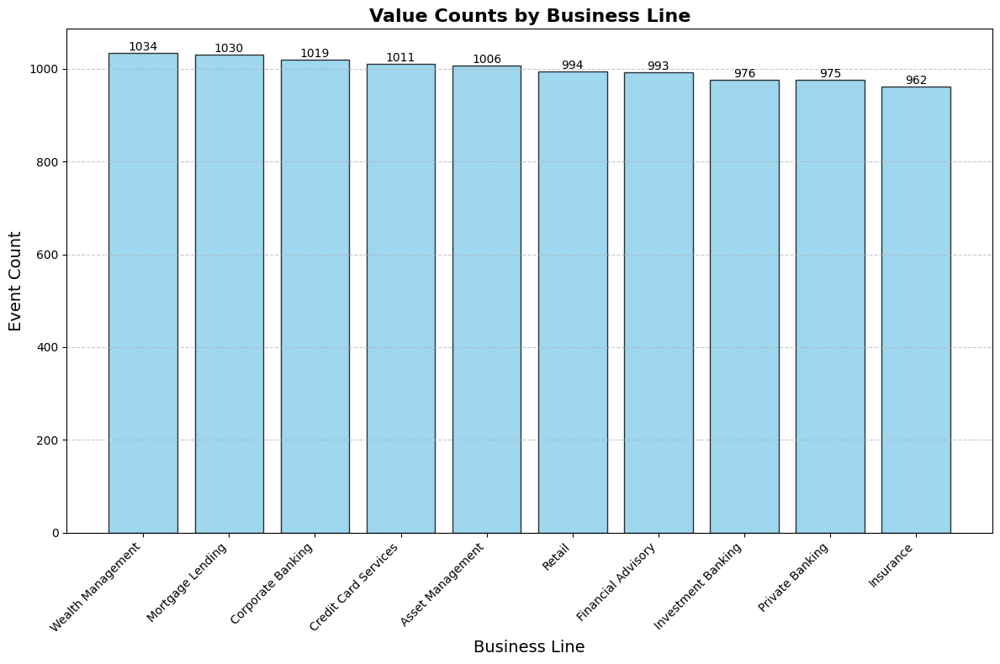

In [3]:
import matplotlib.pyplot as plt
import pandas as pd

# Calculate value counts for Business Line
business_line_counts = df["Business Line"].value_counts()

# Create a DataFrame for easier manipulation
business_line_summary = pd.DataFrame({
    "Business Line": business_line_counts.index,
    "Count": business_line_counts.values
})

# Plot the data
plt.figure(figsize=(12, 8))
bars = plt.bar(
    business_line_summary["Business Line"],
    business_line_summary["Count"],
    color="skyblue",
    edgecolor="black",
    alpha=0.8
)

# Annotate each bar with the count
for bar, count in zip(bars, business_line_summary["Count"]):
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        f"{count}",
        ha="center",
        va="bottom",
        fontsize=10,
        color="black"
    )

# Title and labels
plt.title("Value Counts by Business Line", fontsize=16, fontweight="bold")
plt.xlabel("Business Line", fontsize=14)
plt.ylabel("Event Count", fontsize=14)

# Rotate X-axis labels for better readability
plt.xticks(rotation=45, ha="right")

# Add gridlines
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Display the plot
plt.tight_layout()
plt.show()


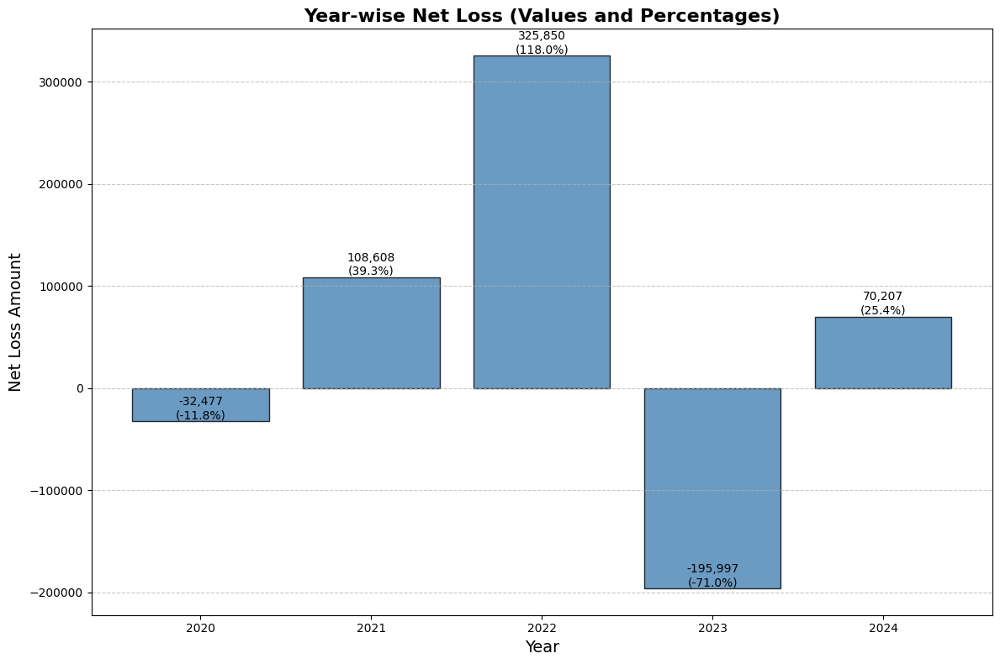

In [4]:
#yearwise netloss 
import matplotlib.pyplot as plt
import pandas as pd

# Extract the year from the Date column
df['Year'] = pd.to_datetime(df['Date']).dt.year

# Calculate yearly total net loss and percentage
yearly_loss = df.groupby('Year')['Net Loss Amount'].sum().reset_index()
total_loss = yearly_loss['Net Loss Amount'].sum()
yearly_loss['Percentage'] = (yearly_loss['Net Loss Amount'] / total_loss) * 100

# Plot the data
plt.figure(figsize=(12, 8))
bars = plt.bar(
    yearly_loss['Year'],
    yearly_loss['Net Loss Amount'],
    color='steelblue',
    edgecolor='black',
    alpha=0.8
)

# Annotate the bars with values and percentages
for bar, loss, pct in zip(bars, yearly_loss['Net Loss Amount'], yearly_loss['Percentage']):
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        f"{loss:,.0f}\n({pct:.1f}%)",
        ha="center",
        va="bottom",
        fontsize=10,
        color="black"
    )

# Title and labels
plt.title("Year-wise Net Loss (Values and Percentages)", fontsize=16, fontweight="bold")
plt.xlabel("Year", fontsize=14)
plt.ylabel("Net Loss Amount", fontsize=14)

# Add gridlines
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Display the plot
plt.tight_layout()
plt.show()


C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\502352606.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  positive_df['Year'] = pd.to_datetime(positive_df['Date']).dt.year


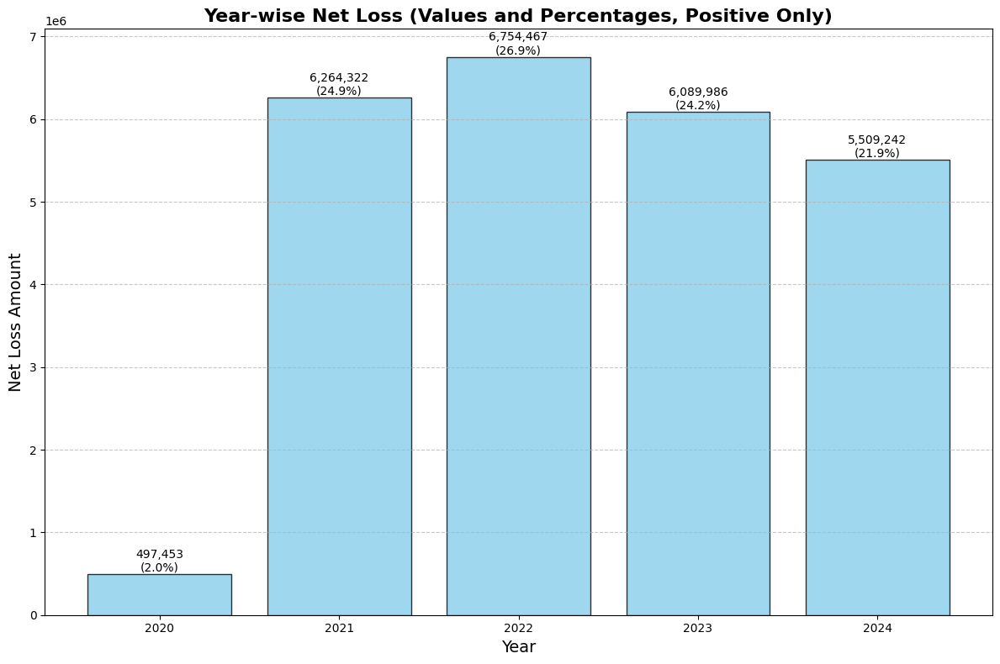

In [5]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter out negative Net Loss Amount
positive_df = df[df['Net Loss Amount'] > 0]

# Extract the year from the Date column
positive_df['Year'] = pd.to_datetime(positive_df['Date']).dt.year

# Calculate yearly total net loss and percentage
yearly_loss = positive_df.groupby('Year')['Net Loss Amount'].sum().reset_index()
total_loss = yearly_loss['Net Loss Amount'].sum()
yearly_loss['Percentage'] = (yearly_loss['Net Loss Amount'] / total_loss) * 100

# Plot the data
plt.figure(figsize=(12, 8))
bars = plt.bar(
    yearly_loss['Year'],
    yearly_loss['Net Loss Amount'],
    color='skyblue',
    edgecolor='black',
    alpha=0.8
)

# Annotate the bars with values and percentages
for bar, loss, pct in zip(bars, yearly_loss['Net Loss Amount'], yearly_loss['Percentage']):
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        f"{loss:,.0f}\n({pct:.1f}%)",
        ha="center",
        va="bottom",
        fontsize=10,
        color="black"
    )

# Title and labels
plt.title("Year-wise Net Loss (Values and Percentages, Positive Only)", fontsize=16, fontweight="bold")
plt.xlabel("Year", fontsize=14)
plt.ylabel("Net Loss Amount", fontsize=14)

# Add gridlines
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Display the plot
plt.tight_layout()
plt.show()


C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\4252076477.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  positive_df['Year'] = pd.to_datetime(positive_df['Date']).dt.year


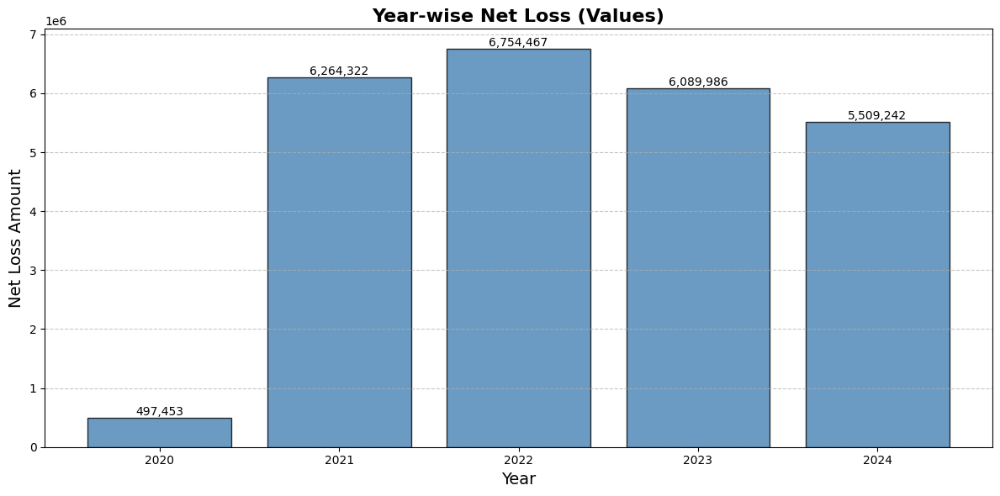

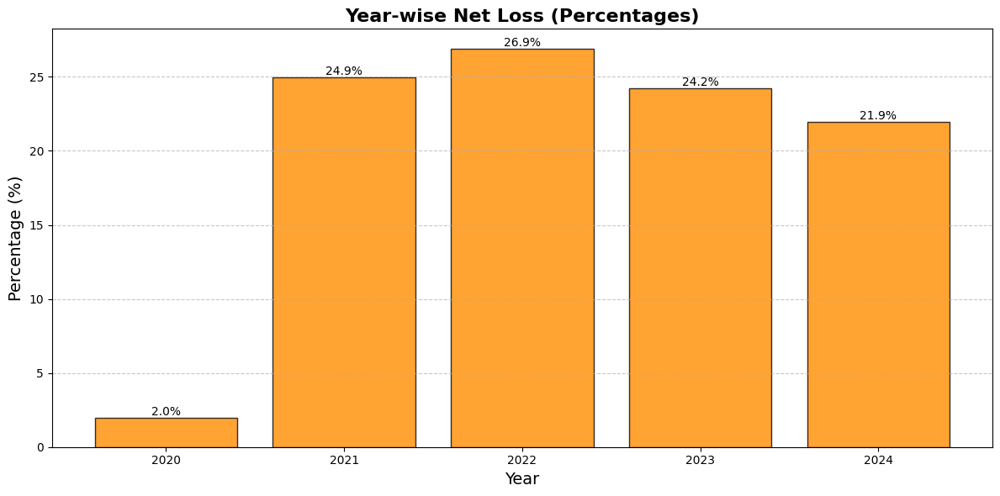

In [6]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter out negative Net Loss Amount
positive_df = df[df['Net Loss Amount'] > 0]

# Extract the year from the Date column
positive_df['Year'] = pd.to_datetime(positive_df['Date']).dt.year

# Calculate yearly total net loss and percentage
yearly_loss = positive_df.groupby('Year')['Net Loss Amount'].sum().reset_index()
total_loss = yearly_loss['Net Loss Amount'].sum()
yearly_loss['Percentage'] = (yearly_loss['Net Loss Amount'] / total_loss) * 100

# Plot 1: Year-wise Net Loss Values
plt.figure(figsize=(12, 6))
bars = plt.bar(
    yearly_loss['Year'],
    yearly_loss['Net Loss Amount'],
    color='steelblue',
    edgecolor='black',
    alpha=0.8
)

# Annotate the bars with net loss values
for bar, loss in zip(bars, yearly_loss['Net Loss Amount']):
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        f"{loss:,.0f}",
        ha="center",
        va="bottom",
        fontsize=10,
        color="black"
    )

# Title and labels for Net Loss plot
plt.title("Year-wise Net Loss (Values)", fontsize=16, fontweight="bold")
plt.xlabel("Year", fontsize=14)
plt.ylabel("Net Loss Amount", fontsize=14)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

# Plot 2: Year-wise Net Loss Percentages
plt.figure(figsize=(12, 6))
bars = plt.bar(
    yearly_loss['Year'],
    yearly_loss['Percentage'],
    color='darkorange',
    edgecolor='black',
    alpha=0.8
)

# Annotate the bars with percentages
for bar, pct in zip(bars, yearly_loss['Percentage']):
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        f"{pct:.1f}%",
        ha="center",
        va="bottom",
        fontsize=10,
        color="black"
    )

# Title and labels for Percentage plot
plt.title("Year-wise Net Loss (Percentages)", fontsize=16, fontweight="bold")
plt.xlabel("Year", fontsize=14)
plt.ylabel("Percentage (%)", fontsize=14)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()


C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\1953940281.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  positive_df['Year'] = pd.to_datetime(positive_df['Date']).dt.year


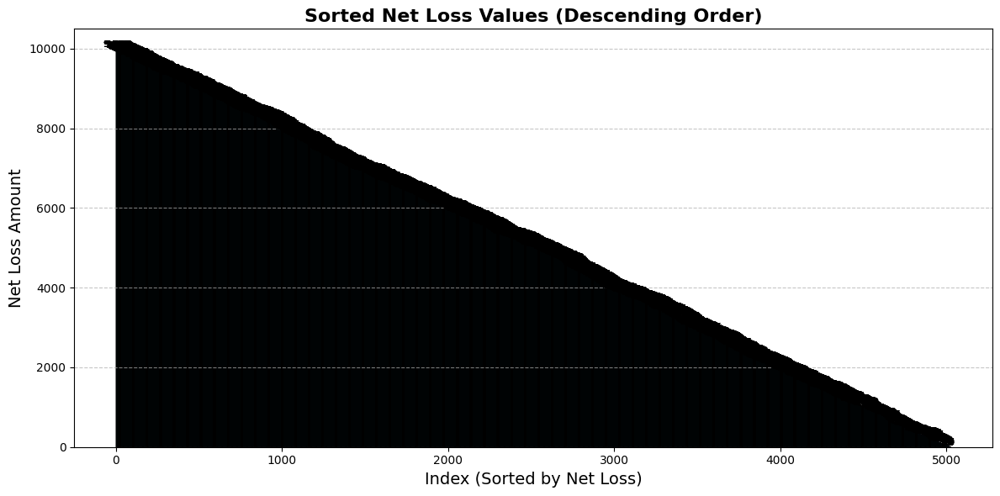

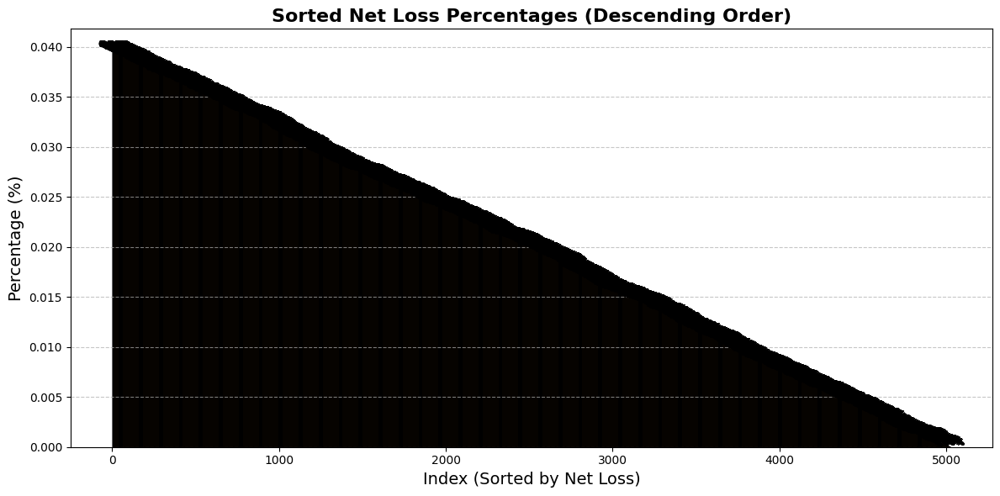

In [7]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter out negative Net Loss Amount
positive_df = df[df['Net Loss Amount'] > 0]

# Extract the year from the Date column
positive_df['Year'] = pd.to_datetime(positive_df['Date']).dt.year

# Sort the net loss values in descending order
sorted_df = positive_df.sort_values(by='Net Loss Amount', ascending=False).reset_index(drop=True)

# Add an index column for plotting
sorted_df['Index'] = sorted_df.index + 1

# Plot 1: Sorted Net Loss Values
plt.figure(figsize=(12, 6))
bars = plt.bar(
    sorted_df['Index'],
    sorted_df['Net Loss Amount'],
    color='steelblue',
    edgecolor='black',
    alpha=0.8
)

# Annotate the bars with net loss values
for bar, loss in zip(bars, sorted_df['Net Loss Amount']):
    height = bar.get_height()
    if height > 0:  # Annotate only for positive values
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            height,
            f"{int(loss):,}",
            ha="center",
            va="bottom",
            fontsize=8,
            color="black"
        )

# Title and labels for Net Loss plot
plt.title("Sorted Net Loss Values (Descending Order)", fontsize=16, fontweight="bold")
plt.xlabel("Index (Sorted by Net Loss)", fontsize=14)
plt.ylabel("Net Loss Amount", fontsize=14)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

# Plot 2: Sorted Net Loss Percentages
# Calculate percentages
total_loss = sorted_df['Net Loss Amount'].sum()
sorted_df['Percentage'] = (sorted_df['Net Loss Amount'] / total_loss) * 100

plt.figure(figsize=(12, 6))
bars = plt.bar(
    sorted_df['Index'],
    sorted_df['Percentage'],
    color='darkorange',
    edgecolor='black',
    alpha=0.8
)

# Annotate the bars with percentages
for bar, pct in zip(bars, sorted_df['Percentage']):
    height = bar.get_height()
    if height > 0:  # Annotate only for positive percentages
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            height,
            f"{pct:.2f}%",
            ha="center",
            va="bottom",
            fontsize=8,
            color="black"
        )

# Title and labels for Percentage plot
plt.title("Sorted Net Loss Percentages (Descending Order)", fontsize=16, fontweight="bold")
plt.xlabel("Index (Sorted by Net Loss)", fontsize=14)
plt.ylabel("Percentage (%)", fontsize=14)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()


C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\1665077534.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  positive_df['Year'] = pd.to_datetime(positive_df['Date']).dt.year


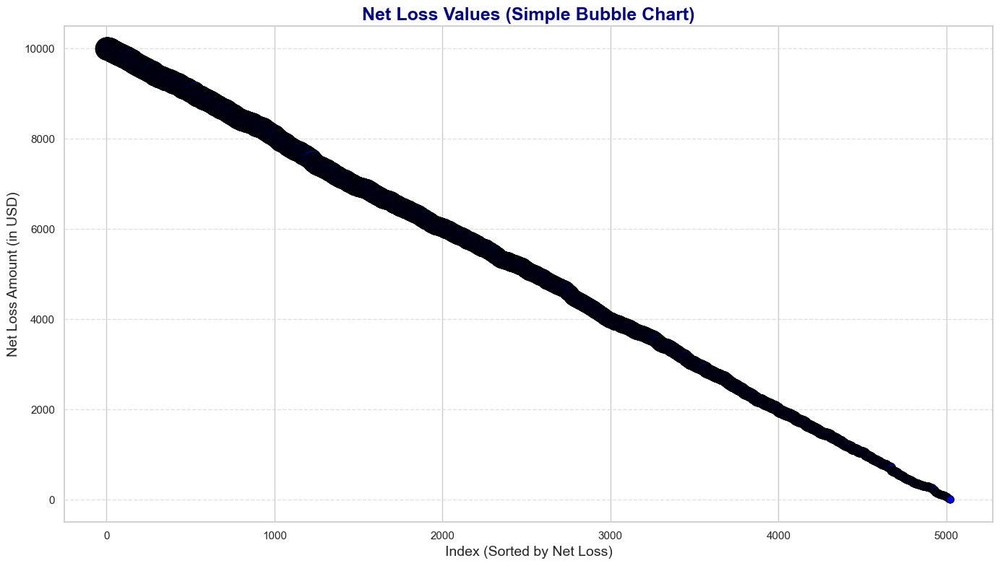

In [13]:
#simple bubbule grapgh by net loss
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Filter out negative Net Loss Amount
positive_df = df[df['Net Loss Amount'] > 0]

# Extract the year from the Date column
positive_df['Year'] = pd.to_datetime(positive_df['Date']).dt.year

# Sort the net loss values in descending order
sorted_df = positive_df.sort_values(by='Net Loss Amount', ascending=False).reset_index(drop=True)

# Add an index column for plotting
sorted_df['Index'] = sorted_df.index + 1

# --- Simple Bubble Chart for Net Loss Values ---
plt.figure(figsize=(14, 8))
bubble_sizes = sorted_df['Net Loss Amount'] / 500  # Scale bubble sizes for better visualization

sns.scatterplot(
    x=sorted_df['Index'],
    y=sorted_df['Net Loss Amount'],
    size=bubble_sizes,
    sizes=(50, 500),  # Range for bubble sizes
    color="blue",
    edgecolor="black",
    alpha=0.7,  # Slight transparency
    legend=False
)

# Add title and labels
plt.title("Net Loss Values (Simple Bubble Chart)", fontsize=18, fontweight="bold", color="darkblue")
plt.xlabel("Index (Sorted by Net Loss)", fontsize=14)
plt.ylabel("Net Loss Amount (in USD)", fontsize=14)
plt.grid(axis="y", linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()


C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\328643199.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  positive_df['Year'] = pd.to_datetime(positive_df['Date']).dt.year


Number of events with outlier net loss (> 6000): 2015


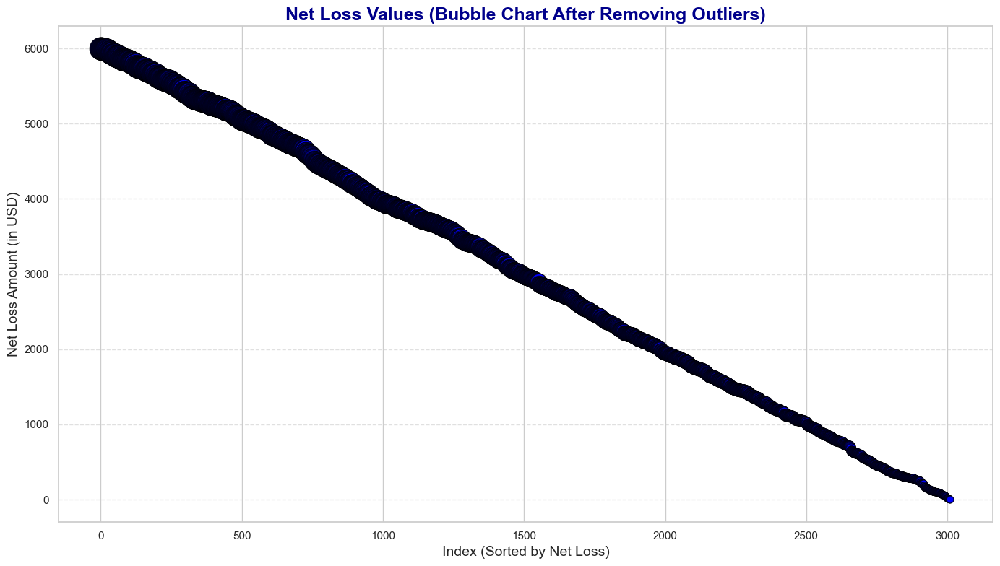

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Example: Assuming df is your dataframe
# Filter out negative Net Loss Amount
positive_df = df[df['Net Loss Amount'] > 0]

# Extract the year from the Date column
positive_df['Year'] = pd.to_datetime(positive_df['Date']).dt.year

# Set a threshold for identifying outliers (e.g., 95th percentile of the Net Loss Amount)
#threshold = positive_df['Net Loss Amount'].quantile(0.95)
threshold=6000
# Identify outliers and count them
outliers_df = positive_df[positive_df['Net Loss Amount'] > threshold]
outlier_count = outliers_df.shape[0]

# Remove outliers from the data
filtered_df = positive_df[positive_df['Net Loss Amount'] <= threshold]

# Sort the remaining data by Net Loss Amount
sorted_df = filtered_df.sort_values(by='Net Loss Amount', ascending=False).reset_index(drop=True)

# Add an index column for plotting
sorted_df['Index'] = sorted_df.index + 1

# --- Simple Bubble Chart for Net Loss Values (After Removing Outliers) ---
plt.figure(figsize=(14, 8))
bubble_sizes = sorted_df['Net Loss Amount'] / 500  # Scale bubble sizes for better visualization

sns.scatterplot(
    x=sorted_df['Index'],
    y=sorted_df['Net Loss Amount'],
    size=bubble_sizes,
    sizes=(50, 500),  # Range for bubble sizes
    color="blue",
    edgecolor="black",
    alpha=0.7,  # Slight transparency
    legend=False
)

# Add title and labels
plt.title("Net Loss Values (Bubble Chart After Removing Outliers)", fontsize=18, fontweight="bold", color="darkblue")
plt.xlabel("Index (Sorted by Net Loss)", fontsize=14)
plt.ylabel("Net Loss Amount (in USD)", fontsize=14)
plt.grid(axis="y", linestyle="--", alpha=0.6)
plt.tight_layout()

# Show outlier count
print(f"Number of events with outlier net loss (> {threshold}): {outlier_count}")

plt.show()


C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\2335588959.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  legend_labels1 = [f"{business_line}: {net_loss_percentage[i]:.1f}%" for i, business_line in enumerate(grouped_data.index)]
C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\2335588959.py:54: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  legend_labels2 = [f"{business_line}: {event_count_percentage[i]:.1f}%" for i, business_line in enumerate(grouped_data.index)]


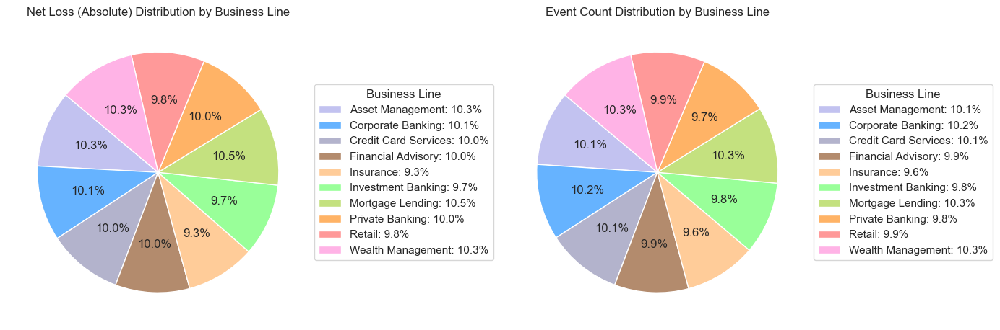

In [18]:
#manually coloy legend with percentage
import matplotlib.pyplot as plt

# Prepare data
df['Net Loss Absolute'] = df['Net Loss Amount'].abs()  # Use absolute values for Net Loss
grouped_data = df.groupby('Business Line').agg({
    'Net Loss Absolute': 'sum',  # Sum of absolute Net Loss
    'Unique Event ID': 'count'   # Count of events
}).rename(columns={'Unique Event ID': 'Event Count'})

# Calculate percentages
net_loss_percentage = grouped_data['Net Loss Absolute'] / grouped_data['Net Loss Absolute'].sum() * 100
event_count_percentage = grouped_data['Event Count'] / grouped_data['Event Count'].sum() * 100

# Define a custom color palette using a dictionary (for both pie charts)
custom_colors = {
    "Retail": "#ff9999",          # Light Red
    "Corporate Banking": "#66b3ff",  # Light Blue
    "Investment Banking": "#99ff99", # Light Green
    "Insurance": "#ffcc99",        # Light Orange
    "Wealth Management": "#ffb3e6", # Light Pink
    "Asset Management": "#c2c2f0",  # Lavender
    "Private Banking": "#ffb366",   # Light Yellow
    "Credit Card Services": "#b3b3cc", # Light Grey
    "Mortgage Lending": "#c4e17f",  # Light Greenish Yellow
    "Financial Advisory": "#b38b6d"  # Brownish
}

# Plot for Net Loss (Absolute) and Event Count Distribution
fig, ax = plt.subplots(1, 2, figsize=(14, 7))

# Pie chart for Net Loss Amount (Absolute)
wedges1, texts1, autotexts1 = ax[0].pie(
    grouped_data['Net Loss Absolute'], 
    labels=None,  # Suppress labels for clarity
    autopct='%1.1f%%',  # Display percentage
    startangle=140, 
    colors=[custom_colors[bl] for bl in grouped_data.index]  # Use custom colors
)
# Create legend with percentage values
legend_labels1 = [f"{business_line}: {net_loss_percentage[i]:.1f}%" for i, business_line in enumerate(grouped_data.index)]
ax[0].set_title("Net Loss (Absolute) Distribution by Business Line")
ax[0].legend(wedges1, legend_labels1, title="Business Line", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

# Pie chart for Event Count
wedges2, texts2, autotexts2 = ax[1].pie(
    grouped_data['Event Count'], 
    labels=None,  # Suppress labels for clarity
    autopct='%1.1f%%',  # Display percentage
    startangle=140, 
    colors=[custom_colors[bl] for bl in grouped_data.index]  # Use custom colors
)
# Create legend with percentage values
legend_labels2 = [f"{business_line}: {event_count_percentage[i]:.1f}%" for i, business_line in enumerate(grouped_data.index)]
ax[1].set_title("Event Count Distribution by Business Line")
ax[1].legend(wedges2, legend_labels2, title="Business Line", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.tight_layout()
plt.show()


C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\2882277240.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  legend_labels1 = [f"{business_line}: {net_loss_percentage[i]:.1f}%" for i, business_line in enumerate(grouped_data.index)]
C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\2882277240.py:57: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  legend_labels2 = [f"{business_line}: {event_count_percentage[i]:.1f}%" for i, business_line in enumerate(grouped_data.index)]


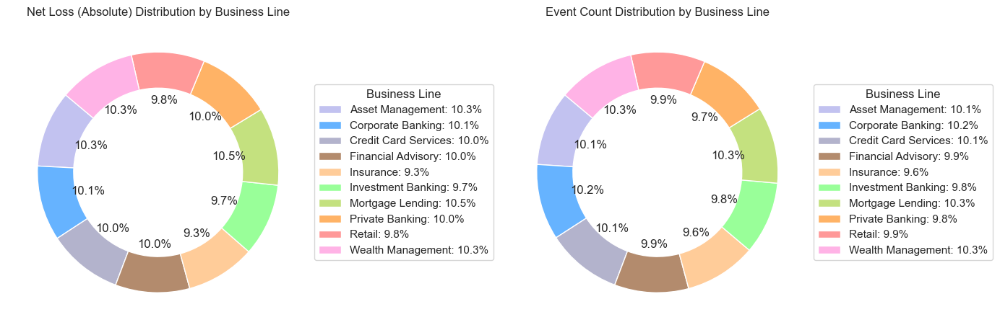

In [30]:
import matplotlib.pyplot as plt

# Prepare data
df['Net Loss Absolute'] = df['Net Loss Amount'].abs()  # Use absolute values for Net Loss
grouped_data = df.groupby('Business Line').agg({
    'Net Loss Absolute': 'sum',  # Sum of absolute Net Loss
    'Unique Event ID': 'count'   # Count of events
}).rename(columns={'Unique Event ID': 'Event Count'})

# Calculate percentages
net_loss_percentage = grouped_data['Net Loss Absolute'] / grouped_data['Net Loss Absolute'].sum() * 100
event_count_percentage = grouped_data['Event Count'] / grouped_data['Event Count'].sum() * 100

# Define a custom color palette using a dictionary (for both donut charts)
custom_colors = {
    "Retail": "#ff9999",          # Light Red
    "Corporate Banking": "#66b3ff",  # Light Blue
    "Investment Banking": "#99ff99", # Light Green
    "Insurance": "#ffcc99",        # Light Orange
    "Wealth Management": "#ffb3e6", # Light Pink
    "Asset Management": "#c2c2f0",  # Lavender
    "Private Banking": "#ffb366",   # Light Yellow
    "Credit Card Services": "#b3b3cc", # Light Grey
    "Mortgage Lending": "#c4e17f",  # Light Greenish Yellow
    "Financial Advisory": "#b38b6d"  # Brownish
}

# Plot for Net Loss (Absolute) and Event Count Distribution
fig, ax = plt.subplots(1, 2, figsize=(14, 7))

# Donut chart for Net Loss Amount (Absolute)
wedges1, texts1, autotexts1 = ax[0].pie(
    grouped_data['Net Loss Absolute'], 
    labels=None,  # Suppress labels for clarity
    autopct='%1.1f%%',  # Display percentage
    startangle=140, 
    colors=[custom_colors[bl] for bl in grouped_data.index],  # Use custom colors
    wedgeprops={'width': 0.3}  # To make the pie chart into a donut chart
)

# Create legend with percentage values for Net Loss (Absolute)
legend_labels1 = [f"{business_line}: {net_loss_percentage[i]:.1f}%" for i, business_line in enumerate(grouped_data.index)]
ax[0].set_title("Net Loss (Absolute) Distribution by Business Line")
ax[0].legend(wedges1, legend_labels1, title="Business Line", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

# Donut chart for Event Count Distribution
wedges2, texts2, autotexts2 = ax[1].pie(
    grouped_data['Event Count'], 
    labels=None,  # Suppress labels for clarity
    autopct='%1.1f%%',  # Display percentage
    startangle=140, 
    colors=[custom_colors[bl] for bl in grouped_data.index],  # Use custom colors
    wedgeprops={'width': 0.3}  # To make the pie chart into a donut chart
)

# Create legend with percentage values for Event Count
legend_labels2 = [f"{business_line}: {event_count_percentage[i]:.1f}%" for i, business_line in enumerate(grouped_data.index)]
ax[1].set_title("Event Count Distribution by Business Line")
ax[1].legend(wedges2, legend_labels2, title="Business Line", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.tight_layout()
plt.show()


C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\4170849832.py:40: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  legend_labels1 = [f"{business_line}: {net_loss_percentage[i]:.1f}%" for i, business_line in enumerate(grouped_data.index)]


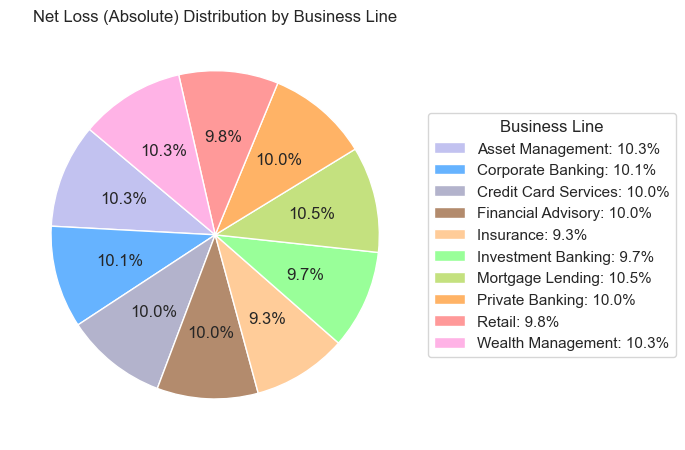

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\4170849832.py:59: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  legend_labels2 = [f"{business_line}: {event_count_percentage[i]:.1f}%" for i, business_line in enumerate(grouped_data.index)]


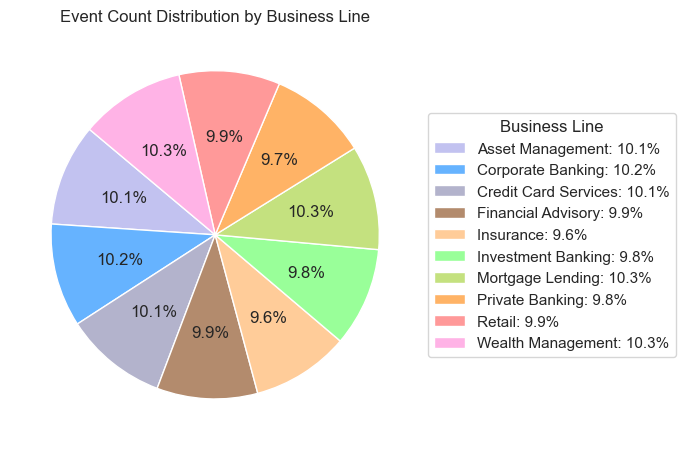

In [19]:

#seprate grapgh for loss and even counts
import matplotlib.pyplot as plt

# Prepare data
df['Net Loss Absolute'] = df['Net Loss Amount'].abs()  # Use absolute values for Net Loss
grouped_data = df.groupby('Business Line').agg({
    'Net Loss Absolute': 'sum',  # Sum of absolute Net Loss
    'Unique Event ID': 'count'   # Count of events
}).rename(columns={'Unique Event ID': 'Event Count'})

# Calculate percentages
net_loss_percentage = grouped_data['Net Loss Absolute'] / grouped_data['Net Loss Absolute'].sum() * 100
event_count_percentage = grouped_data['Event Count'] / grouped_data['Event Count'].sum() * 100

# Define a custom color palette using a dictionary (for both pie charts)
custom_colors = {
    "Retail": "#ff9999",          # Light Red
    "Corporate Banking": "#66b3ff",  # Light Blue
    "Investment Banking": "#99ff99", # Light Green
    "Insurance": "#ffcc99",        # Light Orange
    "Wealth Management": "#ffb3e6", # Light Pink
    "Asset Management": "#c2c2f0",  # Lavender
    "Private Banking": "#ffb366",   # Light Yellow
    "Credit Card Services": "#b3b3cc", # Light Grey
    "Mortgage Lending": "#c4e17f",  # Light Greenish Yellow
    "Financial Advisory": "#b38b6d"  # Brownish
}

# Separate Pie chart for Net Loss (Absolute)
fig1, ax1 = plt.subplots(figsize=(7, 7))

wedges1, texts1, autotexts1 = ax1.pie(
    grouped_data['Net Loss Absolute'], 
    labels=None,  # Suppress labels for clarity
    autopct='%1.1f%%',  # Display percentage
    startangle=140, 
    colors=[custom_colors[bl] for bl in grouped_data.index]  # Use custom colors
)

# Create legend with percentage values for Net Loss
legend_labels1 = [f"{business_line}: {net_loss_percentage[i]:.1f}%" for i, business_line in enumerate(grouped_data.index)]
ax1.set_title("Net Loss (Absolute) Distribution by Business Line")
ax1.legend(wedges1, legend_labels1, title="Business Line", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.tight_layout()
plt.show()

# Separate Pie chart for Event Count
fig2, ax2 = plt.subplots(figsize=(7, 7))

wedges2, texts2, autotexts2 = ax2.pie(
    grouped_data['Event Count'], 
    labels=None,  # Suppress labels for clarity
    autopct='%1.1f%%',  # Display percentage
    startangle=140, 
    colors=[custom_colors[bl] for bl in grouped_data.index]  # Use custom colors
)

# Create legend with percentage values for Event Count
legend_labels2 = [f"{business_line}: {event_count_percentage[i]:.1f}%" for i, business_line in enumerate(grouped_data.index)]
ax2.set_title("Event Count Distribution by Business Line")
ax2.legend(wedges2, legend_labels2, title="Business Line", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.tight_layout()
plt.show()


C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\4113652168.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  legend_labels1 = [f"{business_line}: {net_loss_percentage[i]:.1f}%" for i, business_line in enumerate(grouped_data.index)]


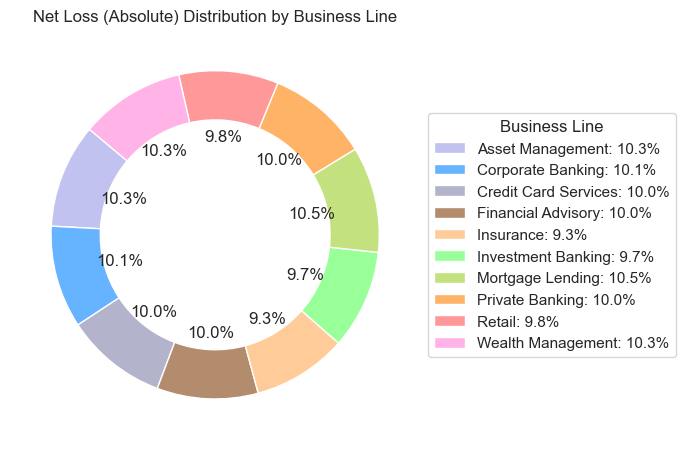

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\4113652168.py:64: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  legend_labels2 = [f"{business_line}: {event_count_percentage[i]:.1f}%" for i, business_line in enumerate(grouped_data.index)]


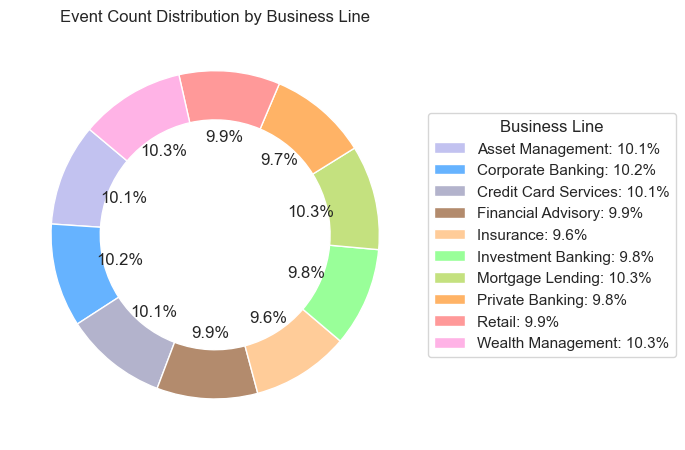

In [20]:
#danut chart
import matplotlib.pyplot as plt

# Prepare data
df['Net Loss Absolute'] = df['Net Loss Amount'].abs()  # Use absolute values for Net Loss
grouped_data = df.groupby('Business Line').agg({
    'Net Loss Absolute': 'sum',  # Sum of absolute Net Loss
    'Unique Event ID': 'count'   # Count of events
}).rename(columns={'Unique Event ID': 'Event Count'})

# Calculate percentages
net_loss_percentage = grouped_data['Net Loss Absolute'] / grouped_data['Net Loss Absolute'].sum() * 100
event_count_percentage = grouped_data['Event Count'] / grouped_data['Event Count'].sum() * 100

# Define a custom color palette using a dictionary (for both doughnut charts)
custom_colors = {
    "Retail": "#ff9999",          # Light Red
    "Corporate Banking": "#66b3ff",  # Light Blue
    "Investment Banking": "#99ff99", # Light Green
    "Insurance": "#ffcc99",        # Light Orange
    "Wealth Management": "#ffb3e6", # Light Pink
    "Asset Management": "#c2c2f0",  # Lavender
    "Private Banking": "#ffb366",   # Light Yellow
    "Credit Card Services": "#b3b3cc", # Light Grey
    "Mortgage Lending": "#c4e17f",  # Light Greenish Yellow
    "Financial Advisory": "#b38b6d"  # Brownish
}

# Separate Doughnut chart for Net Loss (Absolute)
fig1, ax1 = plt.subplots(figsize=(7, 7))

# Create a pie chart with a 'hole' in the center (Doughnut Chart)
wedges1, texts1, autotexts1 = ax1.pie(
    grouped_data['Net Loss Absolute'], 
    labels=None,  # Suppress labels for clarity
    autopct='%1.1f%%',  # Display percentage
    startangle=140, 
    colors=[custom_colors[bl] for bl in grouped_data.index],  # Use custom colors
    wedgeprops={'width': 0.3}  # Create a 'hole' by adjusting width
)

# Create legend with percentage values for Net Loss
legend_labels1 = [f"{business_line}: {net_loss_percentage[i]:.1f}%" for i, business_line in enumerate(grouped_data.index)]
ax1.set_title("Net Loss (Absolute) Distribution by Business Line")
ax1.legend(wedges1, legend_labels1, title="Business Line", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.tight_layout()
plt.show()

# Separate Doughnut chart for Event Count
fig2, ax2 = plt.subplots(figsize=(7, 7))

# Create a pie chart with a 'hole' in the center (Doughnut Chart)
wedges2, texts2, autotexts2 = ax2.pie(
    grouped_data['Event Count'], 
    labels=None,  # Suppress labels for clarity
    autopct='%1.1f%%',  # Display percentage
    startangle=140, 
    colors=[custom_colors[bl] for bl in grouped_data.index],  # Use custom colors
    wedgeprops={'width': 0.3}  # Create a 'hole' by adjusting width
)

# Create legend with percentage values for Event Count
legend_labels2 = [f"{business_line}: {event_count_percentage[i]:.1f}%" for i, business_line in enumerate(grouped_data.index)]
ax2.set_title("Event Count Distribution by Business Line")
ax2.legend(wedges2, legend_labels2, title="Business Line", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.tight_layout()
plt.show()


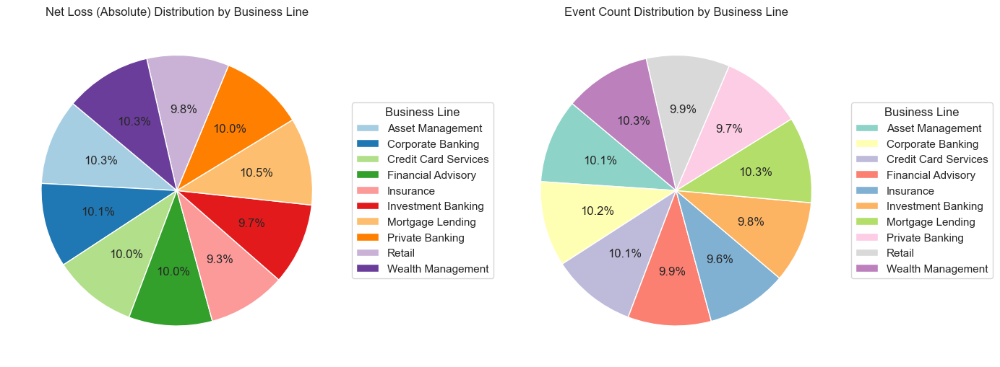

In [14]:
#pie chart without 
import matplotlib.pyplot as plt

# Prepare data
df['Net Loss Absolute'] = df['Net Loss Amount'].abs()  # Use absolute values for Net Loss
grouped_data = df.groupby('Business Line').agg({
    'Net Loss Absolute': 'sum',  # Sum of absolute Net Loss
    'Unique Event ID': 'count'   # Count of events
}).rename(columns={'Unique Event ID': 'Event Count'})

# Plot for Net Loss (Absolute)
fig, ax = plt.subplots(1, 2, figsize=(14, 7))

# Pie chart for Net Loss Amount (Absolute)
wedges1, texts1, autotexts1 = ax[0].pie(
    grouped_data['Net Loss Absolute'], 
    labels=None,  # Suppress labels for clarity
    autopct='%1.1f%%', 
    startangle=140, 
    colors=plt.cm.Paired.colors
)
ax[0].set_title("Net Loss (Absolute) Distribution by Business Line")
ax[0].legend(wedges1, grouped_data.index, title="Business Line", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

# Pie chart for Event Count
wedges2, texts2, autotexts2 = ax[1].pie(
    grouped_data['Event Count'], 
    labels=None,  # Suppress labels for clarity
    autopct='%1.1f%%', 
    startangle=140, 
    colors=plt.cm.Set3.colors
)
ax[1].set_title("Event Count Distribution by Business Line")
ax[1].legend(wedges2, grouped_data.index, title="Business Line", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.tight_layout()
plt.show()


C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\846928818.py:26: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  legend_labels1 = [f"{business_line}: {net_loss_percentage[i]:.1f}%" for i, business_line in enumerate(grouped_data.index)]
C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\846928818.py:39: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  legend_labels2 = [f"{business_line}: {event_count_percentage[i]:.1f}%" for i, business_line in enumerate(grouped_data.index)]


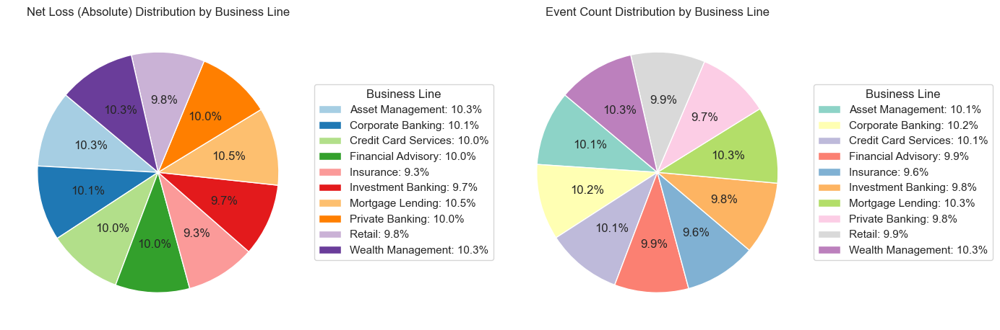

In [17]:
import matplotlib.pyplot as plt

# Prepare data
df['Net Loss Absolute'] = df['Net Loss Amount'].abs()  # Use absolute values for Net Loss
grouped_data = df.groupby('Business Line').agg({
    'Net Loss Absolute': 'sum',  # Sum of absolute Net Loss
    'Unique Event ID': 'count'   # Count of events
}).rename(columns={'Unique Event ID': 'Event Count'})

# Calculate percentages
net_loss_percentage = grouped_data['Net Loss Absolute'] / grouped_data['Net Loss Absolute'].sum() * 100
event_count_percentage = grouped_data['Event Count'] / grouped_data['Event Count'].sum() * 100

# Plot for Net Loss (Absolute) and Event Count Distribution
fig, ax = plt.subplots(1, 2, figsize=(14, 7))

# Pie chart for Net Loss Amount (Absolute)
wedges1, texts1, autotexts1 = ax[0].pie(
    grouped_data['Net Loss Absolute'], 
    labels=None,  # Suppress labels for clarity
    autopct='%1.1f%%',  # Display percentage
    startangle=140, 
    colors=plt.cm.Paired.colors
)
# Create legend with percentage values
legend_labels1 = [f"{business_line}: {net_loss_percentage[i]:.1f}%" for i, business_line in enumerate(grouped_data.index)]
ax[0].set_title("Net Loss (Absolute) Distribution by Business Line")
ax[0].legend(wedges1, legend_labels1, title="Business Line", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

# Pie chart for Event Count
wedges2, texts2, autotexts2 = ax[1].pie(
    grouped_data['Event Count'], 
    labels=None,  # Suppress labels for clarity
    autopct='%1.1f%%',  # Display percentage
    startangle=140, 
    colors=plt.cm.Set3.colors
)
# Create legend with percentage values
legend_labels2 = [f"{business_line}: {event_count_percentage[i]:.1f}%" for i, business_line in enumerate(grouped_data.index)]
ax[1].set_title("Event Count Distribution by Business Line")
ax[1].legend(wedges2, legend_labels2, title="Business Line", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.tight_layout()
plt.show()


C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\1872117658.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['Net Loss Positive'] = filtered_df['Net Loss Amount'].apply(lambda x: x if x > 0 else 0)
C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\1872117658.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['Net Loss Negative'] = filtered_df['Net Loss Amount'].apply(lambda x: -x if x < 0 else 0)


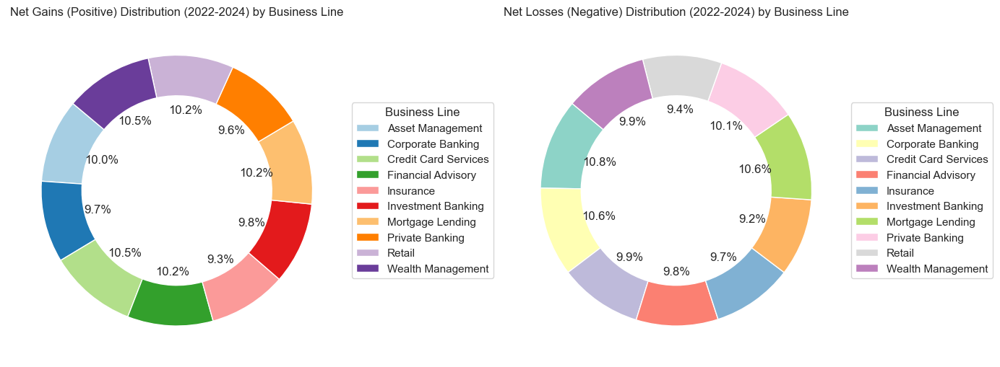

In [15]:
#danut chart
import matplotlib.pyplot as plt
############################# Circle inside
# Filter data for 2022-2024, separate positive and negative Net Loss Amount
df['Date'] = pd.to_datetime(df['Date'])
filtered_df = df[df['Date'].dt.year >= 2022]

filtered_df['Net Loss Positive'] = filtered_df['Net Loss Amount'].apply(lambda x: x if x > 0 else 0)
filtered_df['Net Loss Negative'] = filtered_df['Net Loss Amount'].apply(lambda x: -x if x < 0 else 0)

grouped_data = filtered_df.groupby('Business Line').agg({
    'Net Loss Positive': 'sum',
    'Net Loss Negative': 'sum',
    'Unique Event ID': 'count'
}).rename(columns={'Unique Event ID': 'Event Count'})

# Create a figure with custom size
fig, ax = plt.subplots(1, 2, figsize=(14, 7))  # Larger figure size for better space

# Pie chart for Net Gains (Positive)
wedges1, texts1, autotexts1 = ax[0].pie(
    grouped_data['Net Loss Positive'], 
    labels=None,  
    autopct='%1.1f%%', 
    startangle=140, 
    colors=plt.cm.Paired.colors,
    wedgeprops={'width': 0.3}  # Control the pie size with width
)
ax[0].set_title("Net Gains (Positive) Distribution (2022-2024) by Business Line")
ax[0].legend(wedges1, grouped_data.index, title="Business Line", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

# Pie chart for Net Losses (Negative)
wedges2, texts2, autotexts2 = ax[1].pie(
    grouped_data['Net Loss Negative'], 
    labels=None,  
    autopct='%1.1f%%', 
    startangle=140, 
    colors=plt.cm.Set3.colors,
    wedgeprops={'width': 0.3}  # Control the pie size with width
)
ax[1].set_title("Net Losses (Negative) Distribution (2022-2024) by Business Line")
ax[1].legend(wedges2, grouped_data.index, title="Business Line", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.tight_layout()  # Ensure everything fits properly within the figure
plt.show()


Here's an updated version of the code with enhanced visualizations for better readability and aesthetics, ensuring the data is clearly presented:

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3917568054.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  positive_df['Year'] = pd.to_datetime(positive_df['Date']).dt.year


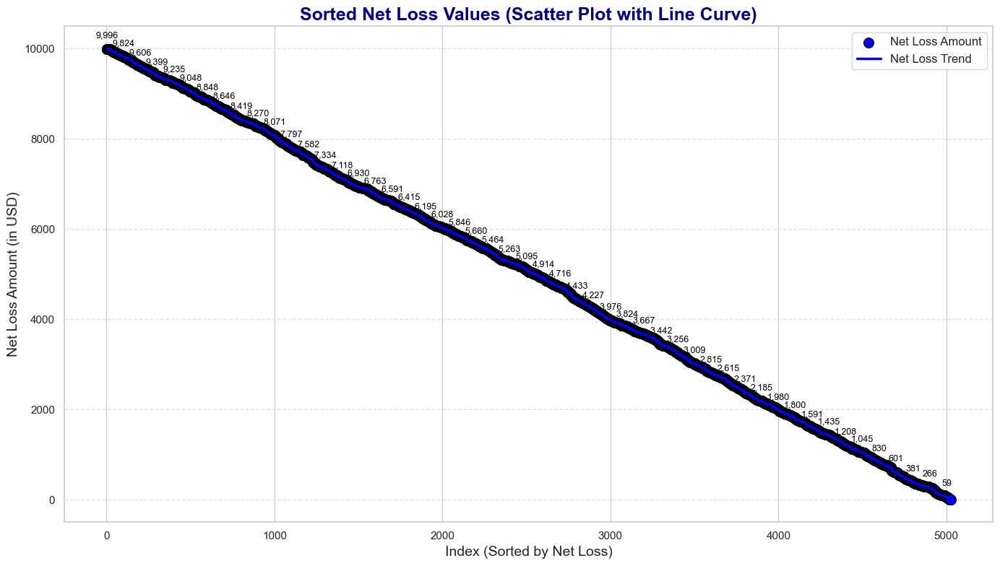

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3917568054.py:98: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


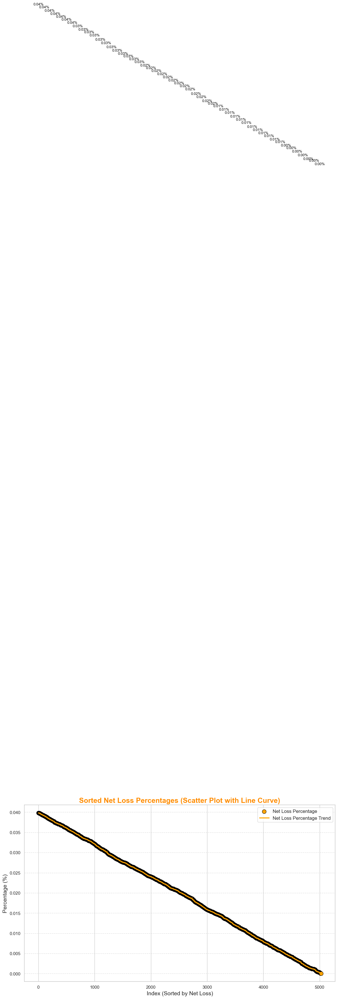

In [10]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# Filter out negative Net Loss Amount
positive_df = df[df['Net Loss Amount'] > 0]

# Extract the year from the Date column
positive_df['Year'] = pd.to_datetime(positive_df['Date']).dt.year

# Sort the net loss values in descending order
sorted_df = positive_df.sort_values(by='Net Loss Amount', ascending=False).reset_index(drop=True)

# Add an index column for plotting
sorted_df['Index'] = sorted_df.index + 1

# --- Scatter Plot with Line Curve: Net Loss Values ---
plt.figure(figsize=(14, 8))
sns.scatterplot(
    x=sorted_df['Index'],
    y=sorted_df['Net Loss Amount'],
    color="blue",
    s=100,  # Size of scatter points
    edgecolor="black",
    label="Net Loss Amount"
)
sns.lineplot(
    x=sorted_df['Index'],
    y=sorted_df['Net Loss Amount'],
    color="blue",
    linewidth=2.5,
    label="Net Loss Trend"
)

# Annotate the points with net loss values
for idx, row in sorted_df.iterrows():
    if idx % 100 == 0:  # Annotate every 100th point for readability
        plt.text(
            row['Index'],
            row['Net Loss Amount'] + 0.02 * max(sorted_df['Net Loss Amount']),
            f"{int(row['Net Loss Amount']):,}",
            fontsize=9,
            ha="center",
            va="bottom",
            color="black"
        )

# Add title and labels
plt.title("Sorted Net Loss Values (Scatter Plot with Line Curve)", fontsize=18, fontweight="bold", color="darkblue")
plt.xlabel("Index (Sorted by Net Loss)", fontsize=14)
plt.ylabel("Net Loss Amount (in USD)", fontsize=14)
plt.grid(axis="y", linestyle="--", alpha=0.6)
plt.legend(fontsize=12, loc="upper right")
plt.tight_layout()
plt.show()

# --- Scatter Plot with Line Curve: Net Loss Percentages ---
# Calculate percentages
total_loss = sorted_df['Net Loss Amount'].sum()
sorted_df['Percentage'] = (sorted_df['Net Loss Amount'] / total_loss) * 100

plt.figure(figsize=(14, 8))
sns.scatterplot(
    x=sorted_df['Index'],
    y=sorted_df['Percentage'],
    color="orange",
    s=100,  # Size of scatter points
    edgecolor="black",
    label="Net Loss Percentage"
)
sns.lineplot(
    x=sorted_df['Index'],
    y=sorted_df['Percentage'],
    color="orange",
    linewidth=2.5,
    label="Net Loss Percentage Trend"
)

# Annotate the points with percentages
for idx, row in sorted_df.iterrows():
    if idx % 100 == 0:  # Annotate every 100th point for readability
        plt.text(
            row['Index'],
            row['Percentage'] + 0.2,  # Offset for better visibility
            f"{row['Percentage']:.2f}%",
            fontsize=9,
            ha="center",
            va="bottom",
            color="black"
        )

# Add title and labels
plt.title("Sorted Net Loss Percentages (Scatter Plot with Line Curve)", fontsize=18, fontweight="bold", color="darkorange")
plt.xlabel("Index (Sorted by Net Loss)", fontsize=14)
plt.ylabel("Percentage (%)", fontsize=14)
plt.grid(axis="y", linestyle="--", alpha=0.6)
plt.legend(fontsize=12, loc="upper right")
plt.tight_layout()
plt.show()


C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3468806727.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  positive_df['Year'] = pd.to_datetime(positive_df['Date']).dt.year


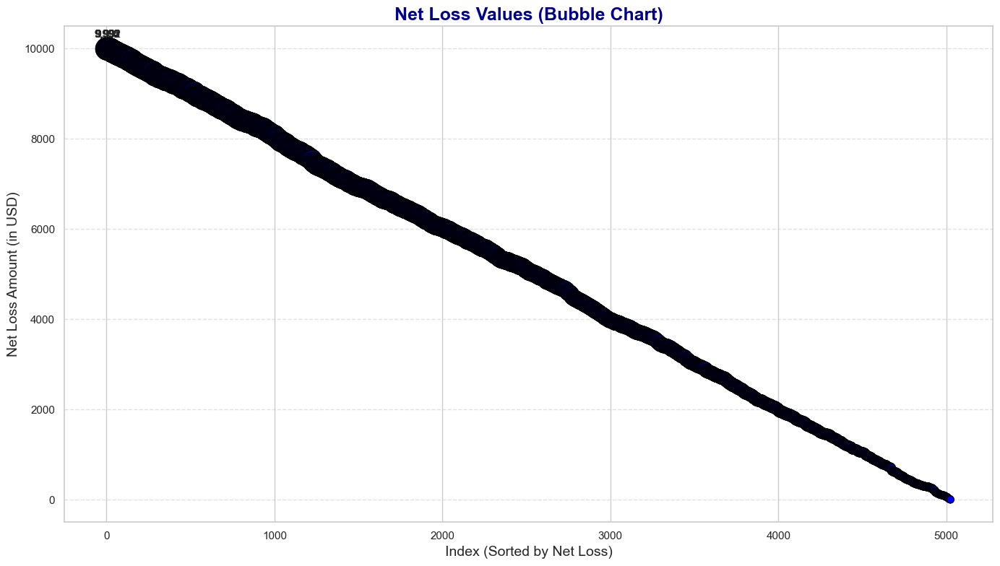

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3468806727.py:89: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


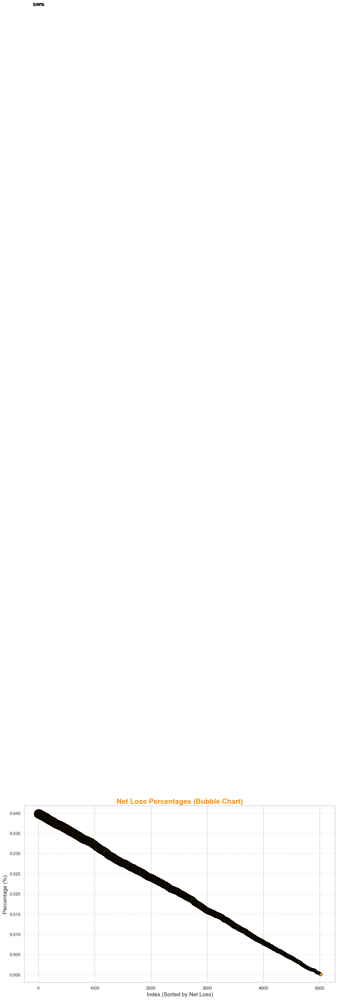

In [12]:
#Code for Bubble Chart:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Filter out negative Net Loss Amount
positive_df = df[df['Net Loss Amount'] > 0]

# Extract the year from the Date column
positive_df['Year'] = pd.to_datetime(positive_df['Date']).dt.year

# Sort the net loss values in descending order
sorted_df = positive_df.sort_values(by='Net Loss Amount', ascending=False).reset_index(drop=True)

# Add an index column for plotting
sorted_df['Index'] = sorted_df.index + 1

# --- Bubble Chart for Net Loss Values ---
plt.figure(figsize=(14, 8))
bubble_sizes = sorted_df['Net Loss Amount'] / 500  # Scale bubble sizes for better visualization

sns.scatterplot(
    x=sorted_df['Index'],
    y=sorted_df['Net Loss Amount'],
    size=bubble_sizes,
    sizes=(50, 500),  # Range for bubble sizes
    color="blue",
    edgecolor="black",
    alpha=0.7,  # Slight transparency
    legend=False
)

# Annotate the top points
for i, row in sorted_df.iterrows():
    if i < 10:  # Annotate the top 10 values
        plt.text(
            row['Index'],
            row['Net Loss Amount'] + 0.02 * max(sorted_df['Net Loss Amount']),
            f"{int(row['Net Loss Amount']):,}",
            fontsize=10,
            ha="center",
            va="bottom"
        )

# Add title and labels
plt.title("Net Loss Values (Bubble Chart)", fontsize=18, fontweight="bold", color="darkblue")
plt.xlabel("Index (Sorted by Net Loss)", fontsize=14)
plt.ylabel("Net Loss Amount (in USD)", fontsize=14)
plt.grid(axis="y", linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

# --- Bubble Chart for Net Loss Percentages ---
# Calculate percentages
total_loss = sorted_df['Net Loss Amount'].sum()
sorted_df['Percentage'] = (sorted_df['Net Loss Amount'] / total_loss) * 100

plt.figure(figsize=(14, 8))
bubble_sizes = sorted_df['Percentage'] * 10  # Scale bubble sizes for better visualization

sns.scatterplot(
    x=sorted_df['Index'],
    y=sorted_df['Percentage'],
    size=bubble_sizes,
    sizes=(50, 500),  # Range for bubble sizes
    color="orange",
    edgecolor="black",
    alpha=0.7,  # Slight transparency
    legend=False
)

# Annotate the top points
for i, row in sorted_df.iterrows():
    if i < 10:  # Annotate the top 10 percentages
        plt.text(
            row['Index'],
            row['Percentage'] + 0.2,
            f"{row['Percentage']:.2f}%",
            fontsize=10,
            ha="center",
            va="bottom"
        )

# Add title and labels
plt.title("Net Loss Percentages (Bubble Chart)", fontsize=18, fontweight="bold", color="darkorange")
plt.xlabel("Index (Sorted by Net Loss)", fontsize=14)
plt.ylabel("Percentage (%)", fontsize=14)
plt.grid(axis="y", linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()


To visualize the event type distribution for each year within a single business line, you can follow these steps:

Filter the data for the desired business line.
Group the data by Event Type and Year.
Plot the distribution of event types for each year using a stacked bar chart.
Here’s how to do this with the data you have:

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\765322414.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  business_line_data['Year'] = business_line_data['Date'].dt.year


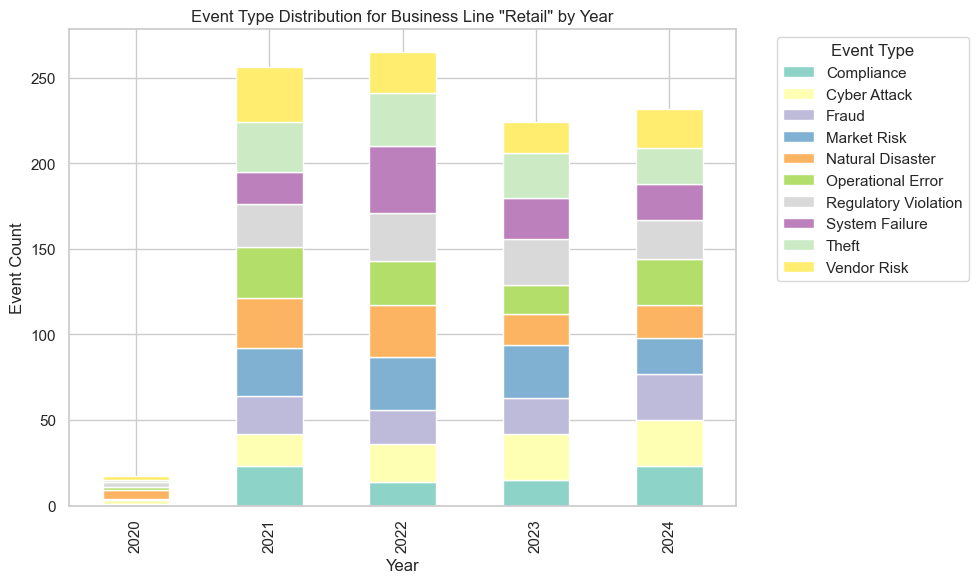

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter data for a specific business line, e.g., "Retail"
business_line_data = df[df['Business Line'] == 'Retail']

# Extract the year from the 'Date' column if not already done
business_line_data['Year'] = business_line_data['Date'].dt.year

# Group by Year and Event Type, and count the occurrences
event_type_yearly = business_line_data.groupby(['Year', 'Event Type']).size().unstack(fill_value=0)

# Plot the stacked bar chart for Event Type Distribution for each year
fig, ax = plt.subplots(figsize=(10, 6))

# Stack bar chart with event types as separate bars
event_type_yearly.plot(kind='bar', stacked=True, ax=ax, colormap='Set3')

# Add labels and title
ax.set_xlabel('Year')
ax.set_ylabel('Event Count')
ax.set_title(f'Event Type Distribution for Business Line "Retail" by Year')

# Add legend
ax.legend(title='Event Type', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.tight_layout()
plt.show()


C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\2930297163.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  business_line_data['Year'] = business_line_data['Date'].dt.year


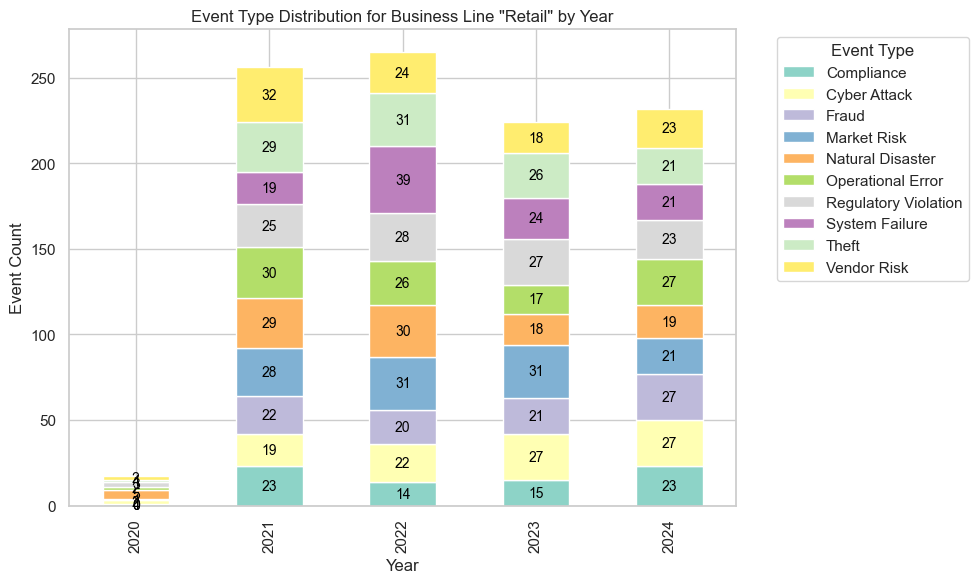

In [32]:
#show value
import matplotlib.pyplot as plt
import seaborn as sns

# Filter data for a specific business line, e.g., "Retail"
business_line_data = df[df['Business Line'] == 'Retail']

# Extract the year from the 'Date' column if not already done
business_line_data['Year'] = business_line_data['Date'].dt.year

# Group by Year and Event Type, and count the occurrences
event_type_yearly = business_line_data.groupby(['Year', 'Event Type']).size().unstack(fill_value=0)

# Plot the stacked bar chart for Event Type Distribution for each year
fig, ax = plt.subplots(figsize=(10, 6))

# Stack bar chart with event types as separate bars
bars = event_type_yearly.plot(kind='bar', stacked=True, ax=ax, colormap='Set3')

# Add labels and title
ax.set_xlabel('Year')
ax.set_ylabel('Event Count')
ax.set_title(f'Event Type Distribution for Business Line "Retail" by Year')

# Add value labels to each bar segment
for p in ax.patches:
    height = p.get_height()
    width = p.get_width()
    x = p.get_x() + width / 2
    y = p.get_y() + height / 2
    
    # Place the value label in the center of each segment
    ax.text(x, y, str(int(height)), ha='center', va='center', fontsize=10, color='black')

# Add legend
ax.legend(title='Event Type', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.tight_layout()
plt.show()


C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\2475035415.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  business_line_data['Year'] = business_line_data['Date'].dt.year


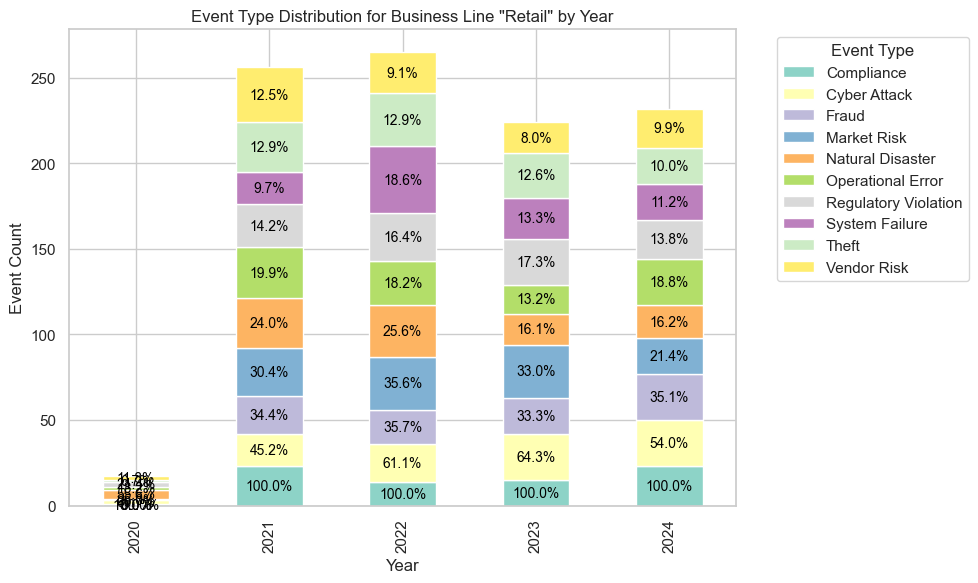

In [33]:
#percentage
import matplotlib.pyplot as plt
import seaborn as sns

# Filter data for a specific business line, e.g., "Retail"
business_line_data = df[df['Business Line'] == 'Retail']

# Extract the year from the 'Date' column if not already done
business_line_data['Year'] = business_line_data['Date'].dt.year

# Group by Year and Event Type, and count the occurrences
event_type_yearly = business_line_data.groupby(['Year', 'Event Type']).size().unstack(fill_value=0)

# Plot the stacked bar chart for Event Type Distribution for each year
fig, ax = plt.subplots(figsize=(10, 6))

# Stack bar chart with event types as separate bars
bars = event_type_yearly.plot(kind='bar', stacked=True, ax=ax, colormap='Set3')

# Add labels and title
ax.set_xlabel('Year')
ax.set_ylabel('Event Count')
ax.set_title(f'Event Type Distribution for Business Line "Retail" by Year')

# Add percentage labels to each bar segment
for p in ax.patches:
    height = p.get_height()
    width = p.get_width()
    x = p.get_x() + width / 2
    y = p.get_y() + height / 2
    
    # Calculate the percentage for this segment
    total_height = p.get_bbox().get_points()[1][1]  # Total height of the stack (sum of all segments for the year)
    percentage = (height / total_height) * 100 if total_height != 0 else 0
    
    # Place the percentage label in the center of each segment
    ax.text(x, y, f"{percentage:.1f}%", ha='center', va='center', fontsize=10, color='black')

# Add legend
ax.legend(title='Event Type', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.tight_layout()
plt.show()


C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\1598283121.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  business_line_data['Year'] = business_line_data['Date'].dt.year


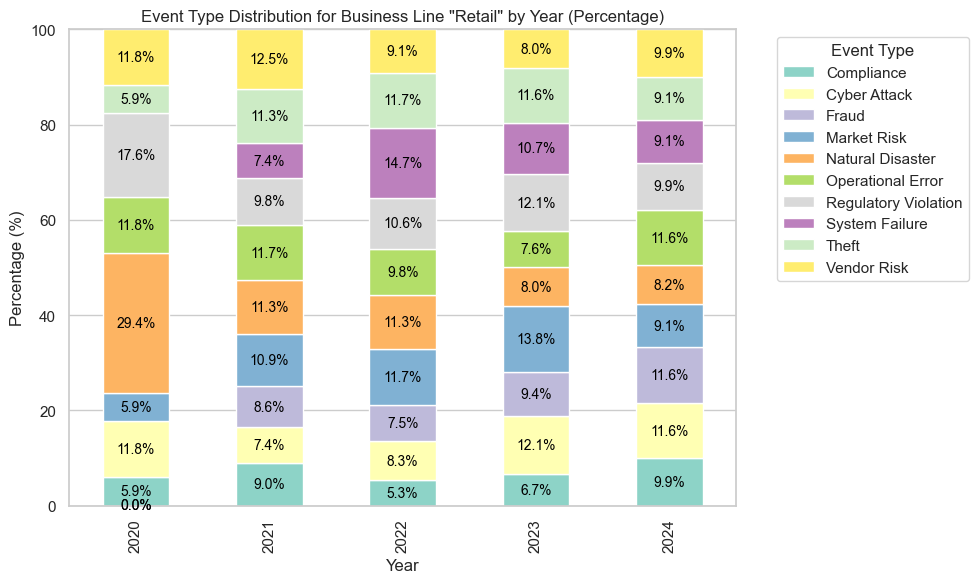

In [34]:
#y axis in percentage
import matplotlib.pyplot as plt
import seaborn as sns

# Filter data for a specific business line, e.g., "Retail"
business_line_data = df[df['Business Line'] == 'Retail']

# Extract the year from the 'Date' column if not already done
business_line_data['Year'] = business_line_data['Date'].dt.year

# Group by Year and Event Type, and count the occurrences
event_type_yearly = business_line_data.groupby(['Year', 'Event Type']).size().unstack(fill_value=0)

# Normalize the event counts to percentage (divide by the sum of events per year)
event_type_yearly_percentage = event_type_yearly.div(event_type_yearly.sum(axis=1), axis=0) * 100

# Plot the stacked bar chart for Event Type Distribution for each year as percentages
fig, ax = plt.subplots(figsize=(10, 6))

# Stack bar chart with event types as separate bars
bars = event_type_yearly_percentage.plot(kind='bar', stacked=True, ax=ax, colormap='Set3')

# Add labels and title
ax.set_xlabel('Year')
ax.set_ylabel('Percentage (%)')
ax.set_title(f'Event Type Distribution for Business Line "Retail" by Year (Percentage)')

# Add percentage labels to each bar segment
for p in ax.patches:
    height = p.get_height()
    width = p.get_width()
    x = p.get_x() + width / 2
    y = p.get_y() + height / 2
    
    # Calculate the percentage for this segment (already calculated in event_type_yearly_percentage)
    ax.text(x, y, f"{height:.1f}%", ha='center', va='center', fontsize=10, color='black')

# Set Y-axis to range from 0 to 100
ax.set_ylim(0, 100)

# Add legend
ax.legend(title='Event Type', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.tight_layout()
plt.show()


C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\2386830352.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  business_line_data['Year'] = business_line_data['Date'].dt.year


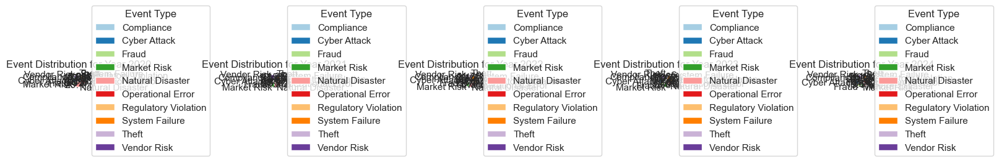

In [35]:
#i pie chart not visible good

import matplotlib.pyplot as plt
import seaborn as sns

# Filter data for a specific business line, e.g., "Retail"
business_line_data = df[df['Business Line'] == 'Retail']

# Extract the year from the 'Date' column if not already done
business_line_data['Year'] = business_line_data['Date'].dt.year

# Group by Year and Event Type, and count the occurrences
event_type_yearly = business_line_data.groupby(['Year', 'Event Type']).size().unstack(fill_value=0)

# Normalize the event counts to percentage (divide by the sum of events per year)
event_type_yearly_percentage = event_type_yearly.div(event_type_yearly.sum(axis=1), axis=0) * 100

# Plot Pie charts for each year
fig, axes = plt.subplots(1, len(event_type_yearly_percentage), figsize=(16, 8))

# If there's only one year, axes will not be an array, so we handle that case
if len(event_type_yearly_percentage) == 1:
    axes = [axes]

for i, (year, data) in enumerate(event_type_yearly_percentage.iterrows()):
    # Plot pie chart for the year
    wedges, texts, autotexts = axes[i].pie(
        data, 
        labels=data.index,  # Use event types as labels
        autopct='%1.1f%%',  # Display percentage values
        startangle=140, 
        colors=plt.cm.Paired.colors[:len(data)]  # Use distinct colors for each event type
    )
    
    # Set the title of each pie chart as the year
    axes[i].set_title(f"Event Distribution for Year {year}")

    # Add legend to the chart
    axes[i].legend(wedges, data.index, title="Event Type", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.tight_layout()
plt.show()


The distribution in the above code is based on the count of events (value counts) for each event type within each year and month. Specifically:

Grouping by Year, Month, and Event Type:

The data is grouped by Year, Month, and Event Type. This means the data is being segmented into these three categories.
Then, the size() function is used to count how many times each event type appears in each Year-Month combination.
Normalization:

After grouping and counting the events, we normalize the event counts to percentages.
This is done by dividing the event counts for each Event Type in a specific Year-Month by the total event count for that month (axis=1), so each pie chart will show how much each event type contributes to the total number of events in that specific month as a percentage.
To clarify:
The distribution is based on the number of events (counts) of each Event Type, showing how these counts are distributed per month and year. This distribution is represented as percentages within each pie chart.

For example:

If in a particular month, there are 100 total events and Event Type A occurs 40 times, the pie chart will show that Event Type A represents 40% of the total events for that month.
Steps Breakdown:
Event Count:
Group the data by Year, Month, and Event Type, and calculate the count of occurrences for each combination (i.e., the total number of events for each event type per year and month).
Percentage Calculation:
Normalize the event counts within each Year-Month combination by dividing the counts of each event type by the total number of events in that Year-Month and multiplying by 100 to get the percentage.
Thus, the pie chart represents the percentage distribution of each event type for a given year and month.

Example:
If you have data like:

graphql
Copy code
Year  | Month | Event Type   | Event Count
--------------------------------------------
2024  | 1     | Type A       | 40
2024  | 1     | Type B       | 30
2024  | 1     | Type C       | 30
The total number of events for January 2024 is 40 + 30 + 30 = 100. The percentage distribution will be:

Type A: (40 / 100) * 100 = 40%
Type B: (30 / 100) * 100 = 30%
Type C: (30 / 100) * 100 = 30%
These percentages will then be displayed in the pie chart for that particular Year-Month.

Let me know if you'd like further clarification or adjustments!

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3757963892.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  business_line_data['Year'] = business_line_data['Date'].dt.year


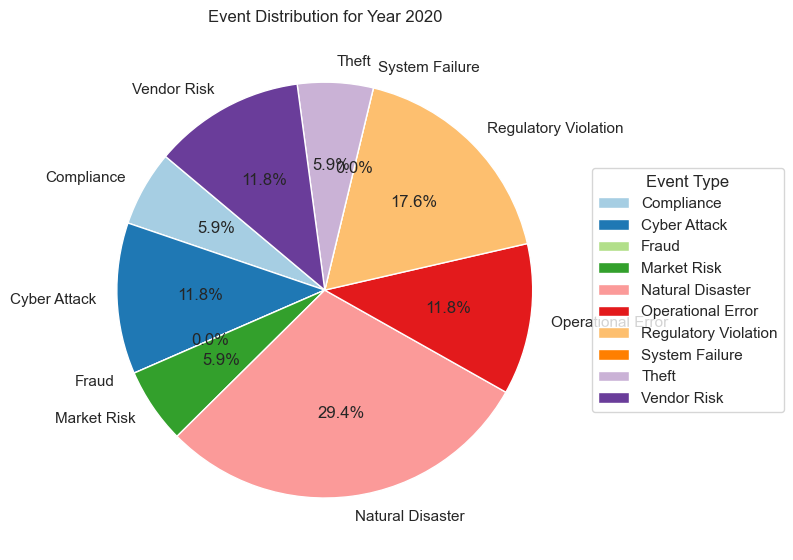

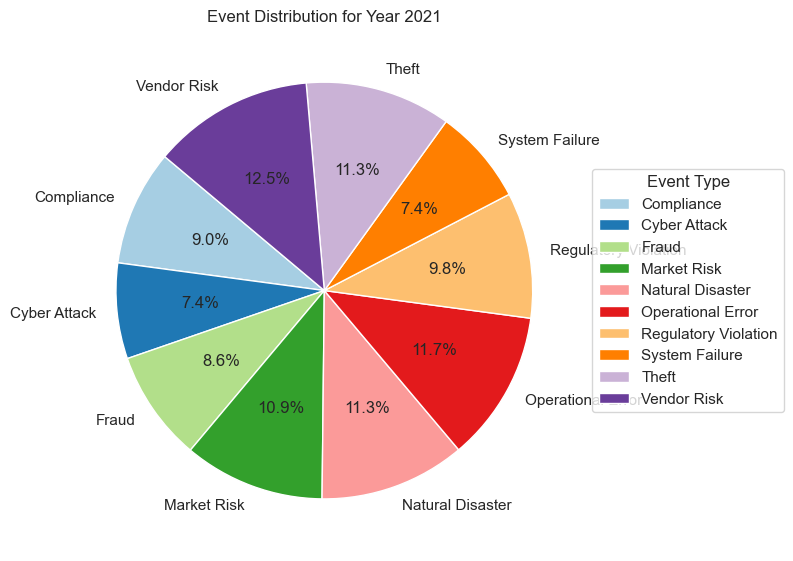

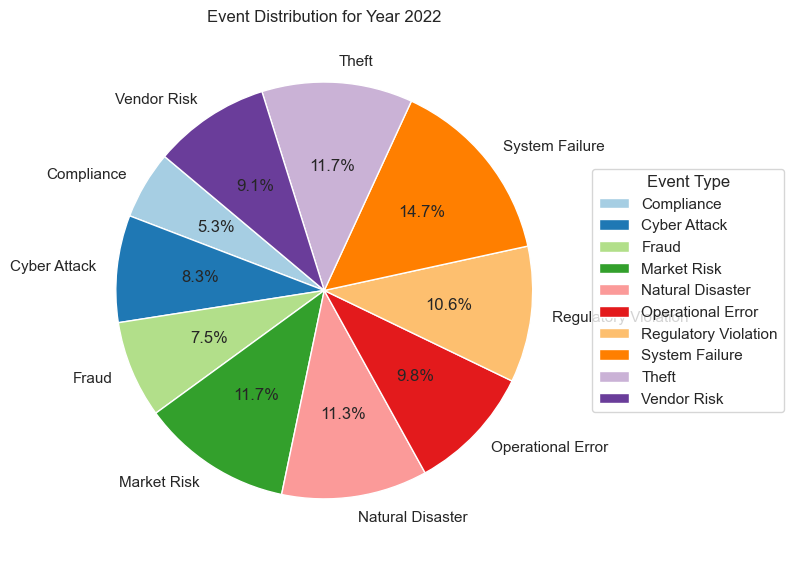

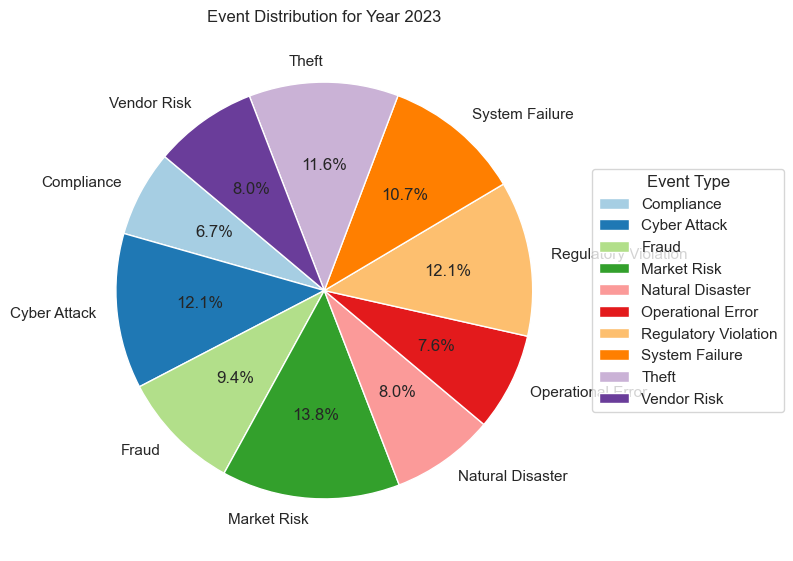

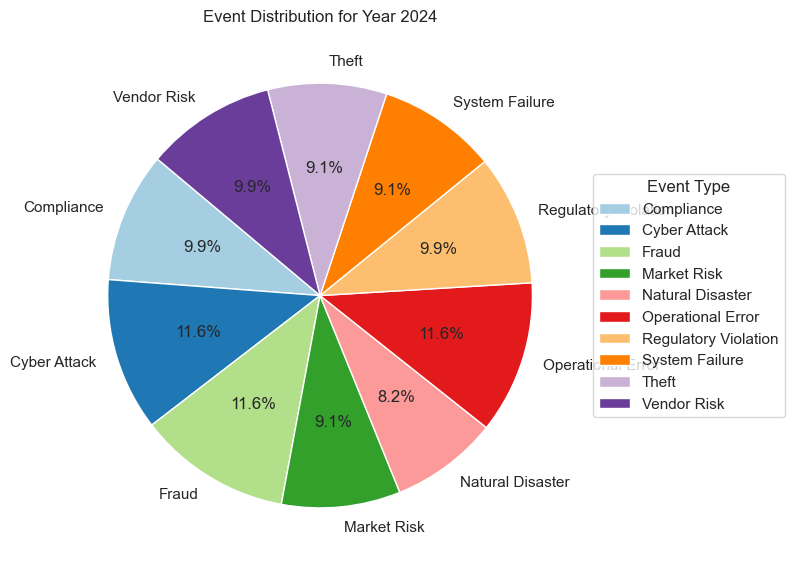

In [36]:
#pei chart
import matplotlib.pyplot as plt
import seaborn as sns

# Filter data for a specific business line, e.g., "Retail"
business_line_data = df[df['Business Line'] == 'Retail']

# Extract the year from the 'Date' column if not already done
business_line_data['Year'] = business_line_data['Date'].dt.year

# Group by Year and Event Type, and count the occurrences
event_type_yearly = business_line_data.groupby(['Year', 'Event Type']).size().unstack(fill_value=0)

# Normalize the event counts to percentage (divide by the sum of events per year)
event_type_yearly_percentage = event_type_yearly.div(event_type_yearly.sum(axis=1), axis=0) * 100

# Plot Pie charts for each year
for year in event_type_yearly_percentage.index:
    # Create a new figure for each year
    fig, ax = plt.subplots(figsize=(8, 8))

    # Data for the specific year
    year_data = event_type_yearly_percentage.loc[year]

    # Plot pie chart for the year
    wedges, texts, autotexts = ax.pie(
        year_data, 
        labels=year_data.index,  # Use event types as labels
        autopct='%1.1f%%',  # Display percentage values
        startangle=140, 
        colors=plt.cm.Paired.colors[:len(year_data)]  # Use distinct colors for each event type
    )
    
    # Set the title of each pie chart as the year
    ax.set_title(f"Event Distribution for Year {year}")

    # Add legend to the chart
    ax.legend(wedges, year_data.index, title="Event Type", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

    plt.tight_layout()
    plt.show()


To adjust the pie chart as per your request:

No labels on the pie chart itself.
Show percentages in the legend instead of inside the pie chart.

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\1982998919.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  business_line_data['Year'] = business_line_data['Date'].dt.year


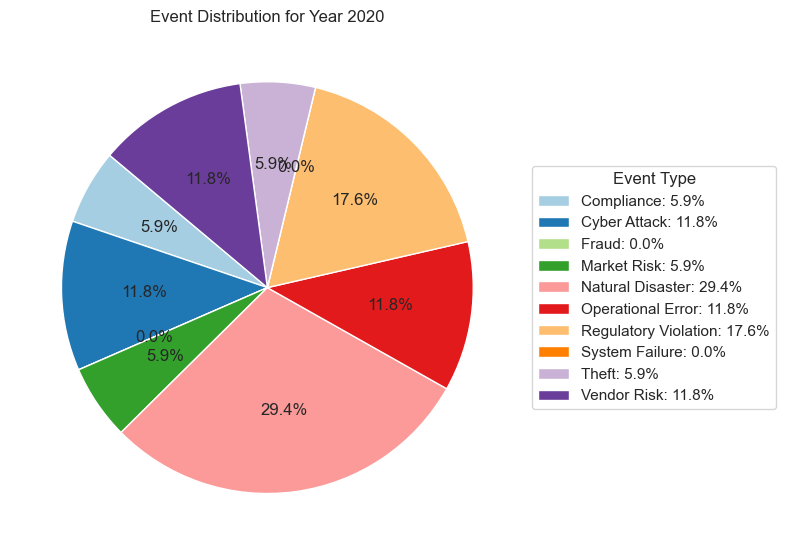

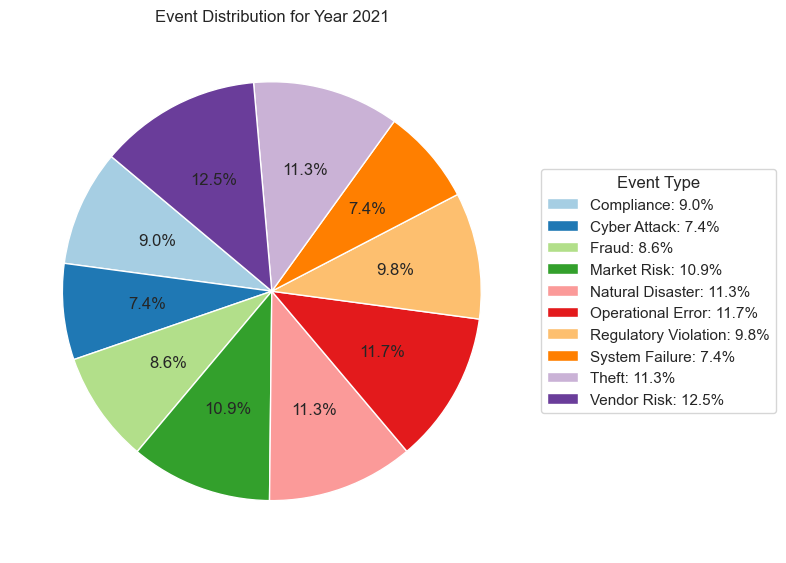

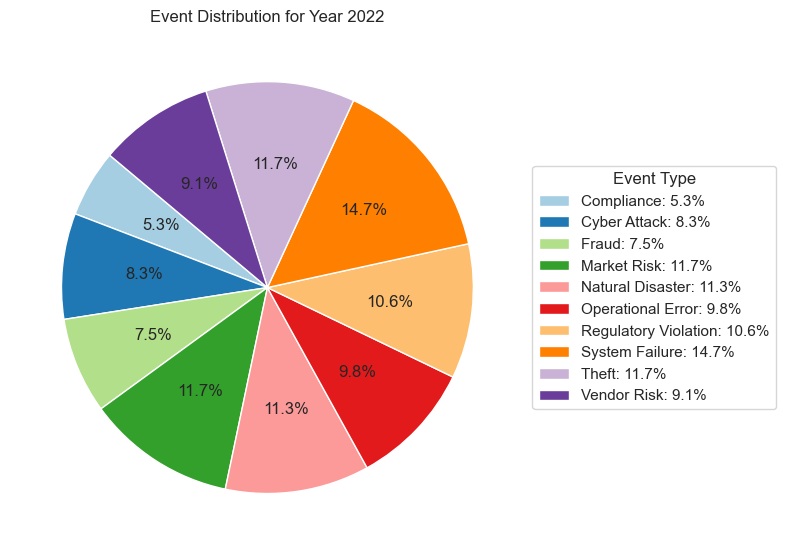

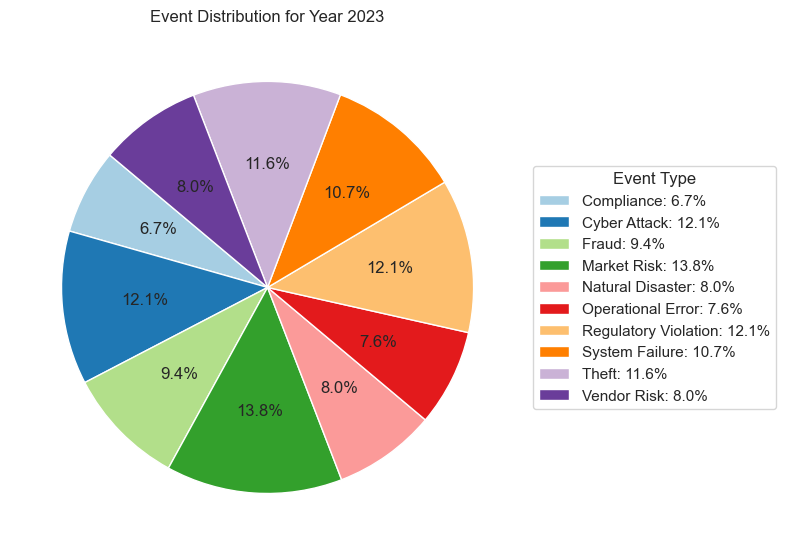

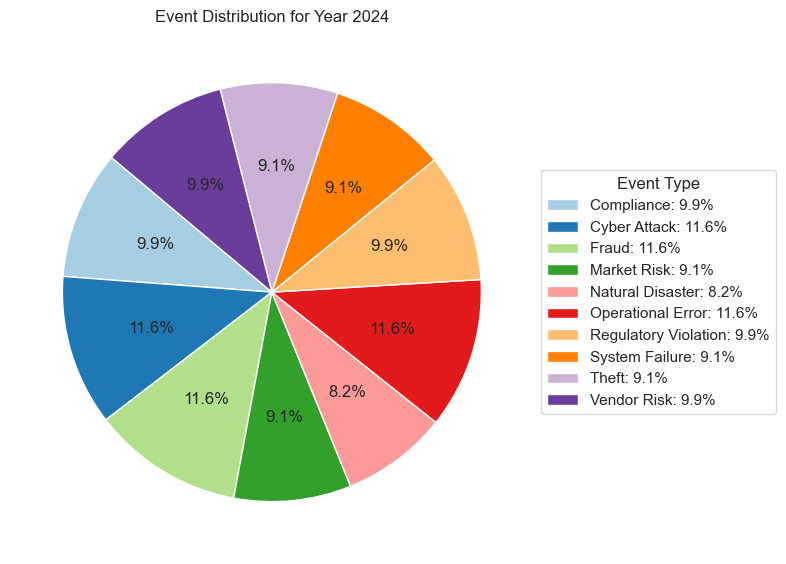

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter data for a specific business line, e.g., "Retail"
business_line_data = df[df['Business Line'] == 'Retail']

# Extract the year from the 'Date' column if not already done
business_line_data['Year'] = business_line_data['Date'].dt.year

# Group by Year and Event Type, and count the occurrences
event_type_yearly = business_line_data.groupby(['Year', 'Event Type']).size().unstack(fill_value=0)

# Normalize the event counts to percentage (divide by the sum of events per year)
event_type_yearly_percentage = event_type_yearly.div(event_type_yearly.sum(axis=1), axis=0) * 100

# Plot Pie charts for each year
for year in event_type_yearly_percentage.index:
    # Create a new figure for each year
    fig, ax = plt.subplots(figsize=(8, 8))

    # Data for the specific year
    year_data = event_type_yearly_percentage.loc[year]

    # Plot pie chart for the year without labels
    wedges, texts, autotexts = ax.pie(
        year_data, 
        labels=None,  # Do not show labels on the pie chart
        autopct='%1.1f%%',  # Display percentage values inside the pie chart
        startangle=140, 
        colors=plt.cm.Paired.colors[:len(year_data)]  # Use distinct colors for each event type
    )

    # Set the title of each pie chart as the year
    ax.set_title(f"Event Distribution for Year {year}")

    # Add legend with percentage for each event type
    legend_labels = [f"{event_type}: {percentage:.1f}%" for event_type, percentage in zip(year_data.index, year_data)]
    ax.legend(wedges, legend_labels, title="Event Type", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

    plt.tight_layout()
    plt.show()


C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\2032184721.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  business_line_data['Year'] = business_line_data['Date'].dt.year
C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\2032184721.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  business_line_data['Month'] = business_line_data['Date'].dt.month


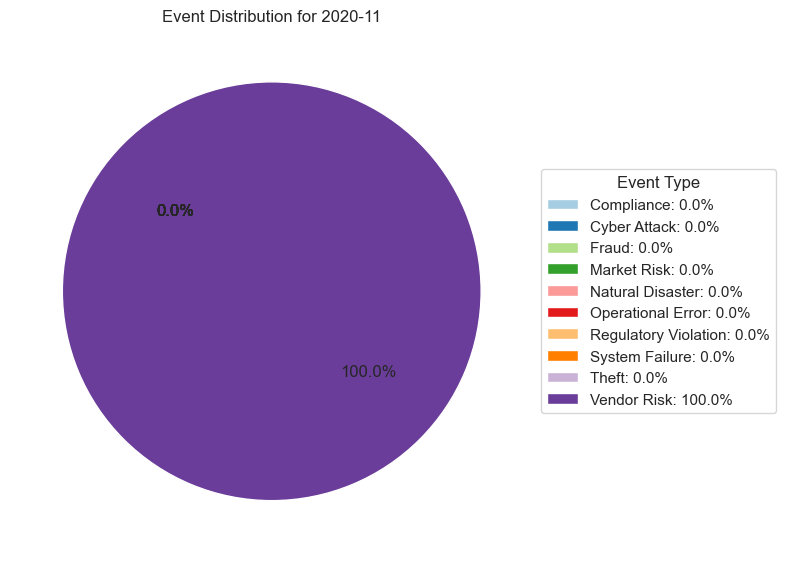

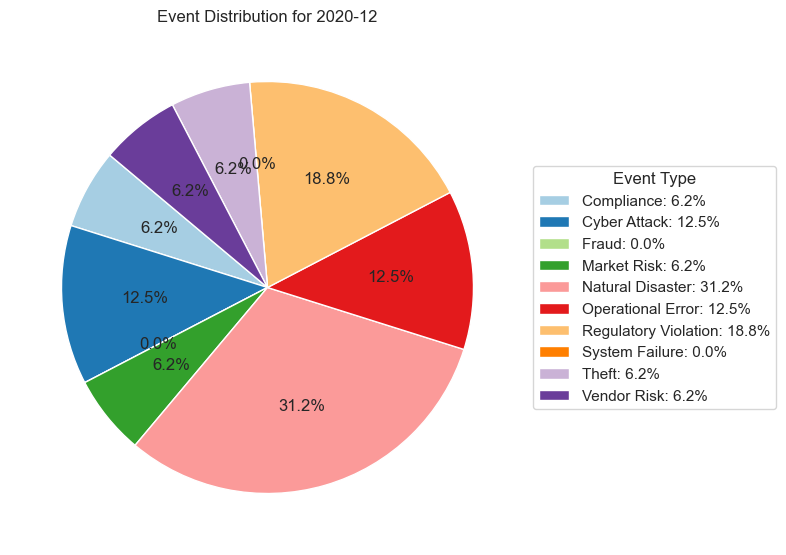

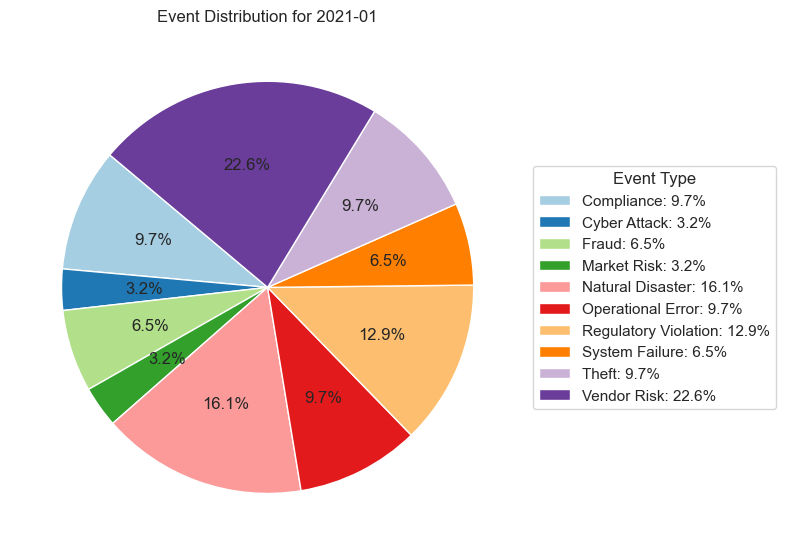

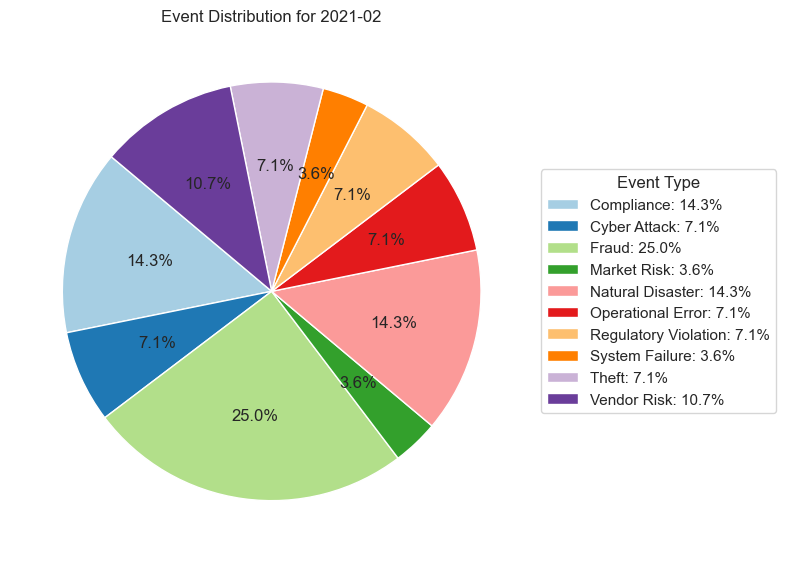

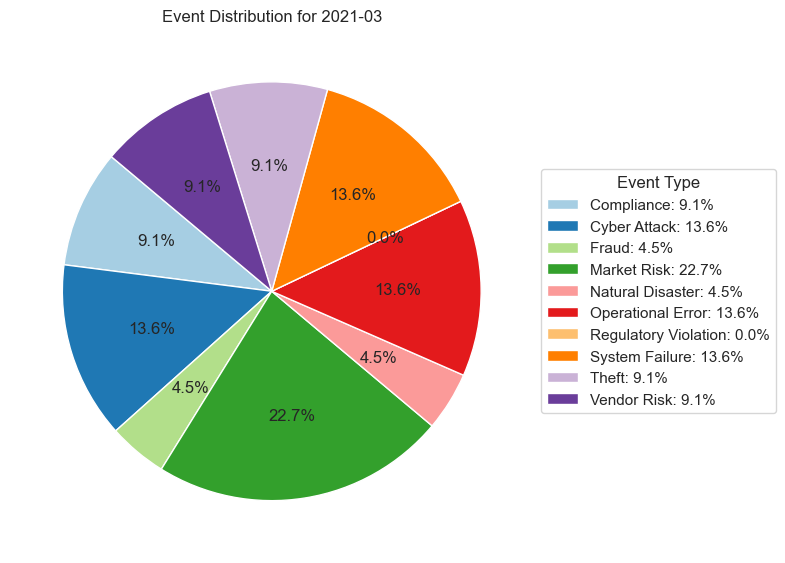

...

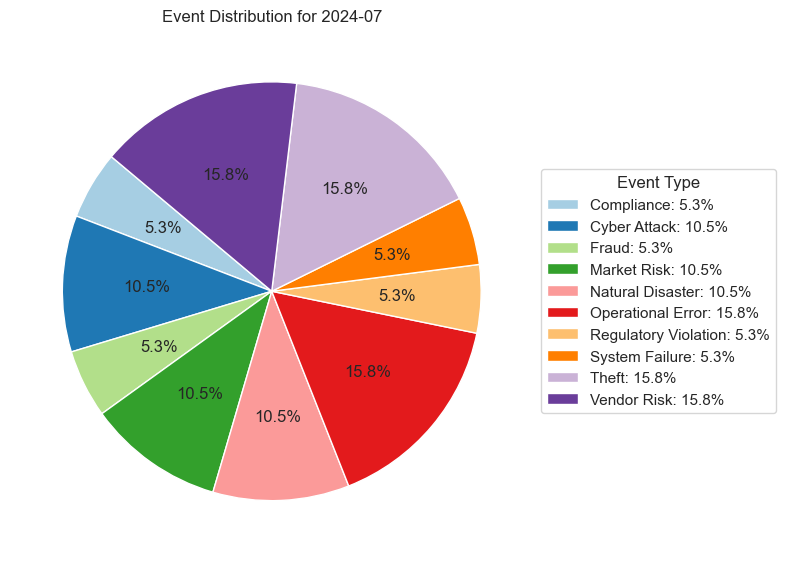

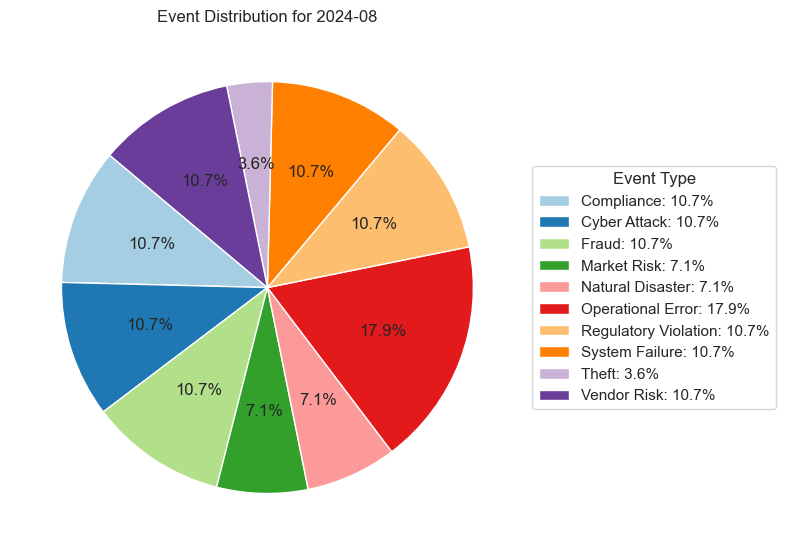

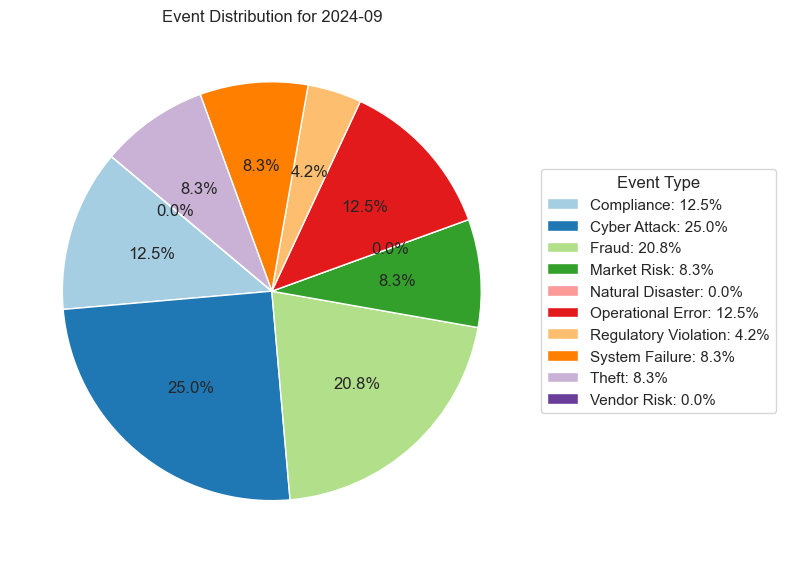

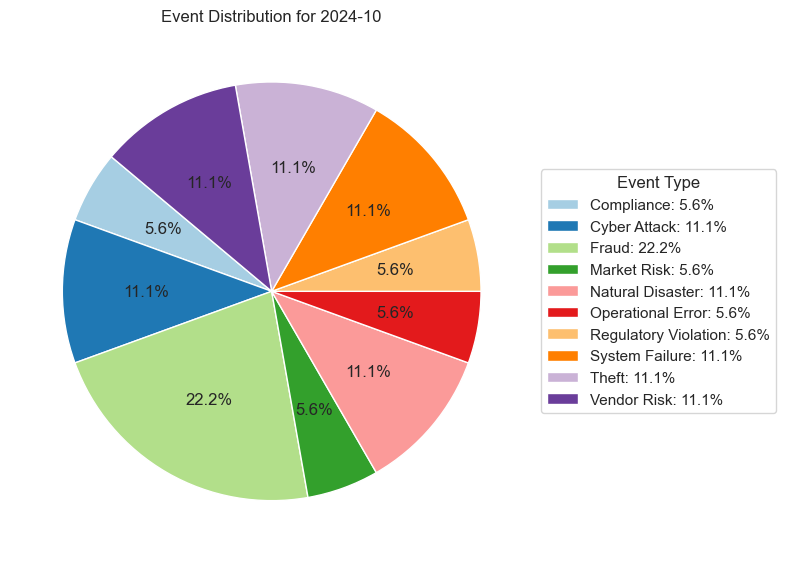

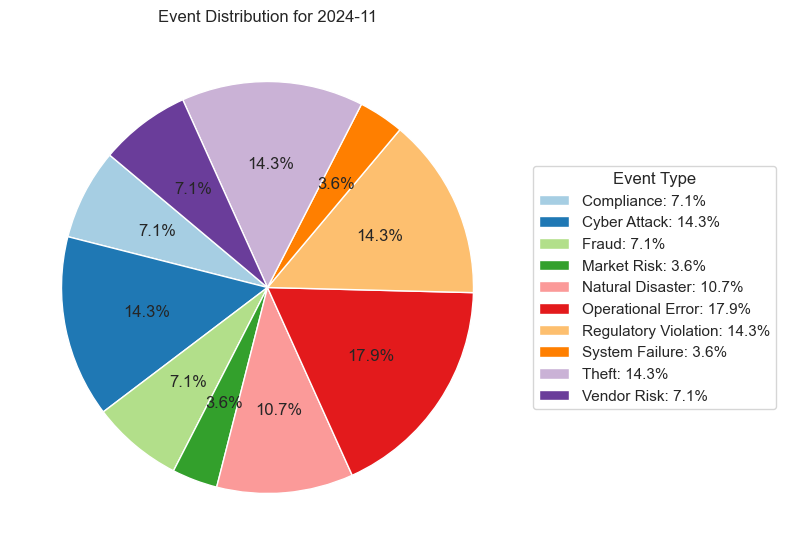

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter data for a specific business line, e.g., "Retail"
business_line_data = df[df['Business Line'] == 'Retail']

# Extract the year and month from the 'Date' column if not already done
business_line_data['Year'] = business_line_data['Date'].dt.year
business_line_data['Month'] = business_line_data['Date'].dt.month

# Group by Year, Month, and Event Type, and count the occurrences
event_type_monthly = business_line_data.groupby(['Year', 'Month', 'Event Type']).size().unstack(fill_value=0)

# Normalize the event counts to percentage (divide by the sum of events per month for each year)
event_type_monthly_percentage = event_type_monthly.div(event_type_monthly.sum(axis=1), axis=0) * 100

# Plot Pie charts for each year and month
for year in event_type_monthly_percentage.index.levels[0]:  # Iterate over each year
    for month in range(1, 13):  # Iterate over each month
        # Check if data exists for that specific month in the current year
        if (year, month) in event_type_monthly_percentage.index:
            # Create a new figure for each month
            fig, ax = plt.subplots(figsize=(8, 8))

            # Data for the specific year and month
            year_month_data = event_type_monthly_percentage.loc[year, month]

            # Plot pie chart for the specific month
            wedges, texts, autotexts = ax.pie(
                year_month_data, 
                labels=None,  # Do not show labels on the pie chart
                autopct='%1.1f%%',  # Display percentage values inside the pie chart
                startangle=140, 
                colors=plt.cm.Paired.colors[:len(year_month_data)]  # Use distinct colors for each event type
            )

            # Set the title of each pie chart as "Year-Month"
            ax.set_title(f"Event Distribution for {year}-{month:02d}")

            # Add legend with percentage for each event type
            legend_labels = [f"{event_type}: {percentage:.1f}%" for event_type, percentage in zip(year_month_data.index, year_month_data)]
            ax.legend(wedges, legend_labels, title="Event Type", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

            plt.tight_layout()
            plt.show()


Thank you for the clarification! If you need the distribution based on Net Loss instead of event counts, the approach changes slightly. You would want to show how the Net Loss amount is distributed across Event Types for each year and month. Here's how you can modify the process:

Key Modifications:
Group by Year, Month, and Event Type: Instead of counting the number of events, we will sum the Net Loss Amount for each Event Type in each Year-Month combination.

Normalize by Total Net Loss: We will normalize the Net Loss Amount for each event type within a given month and year, dividing it by the total Net Loss Amount for that month.

Display Pie Charts: For each Year-Month, we'll display a pie chart showing how the Net Loss Amount is distributed across the different Event Types.

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


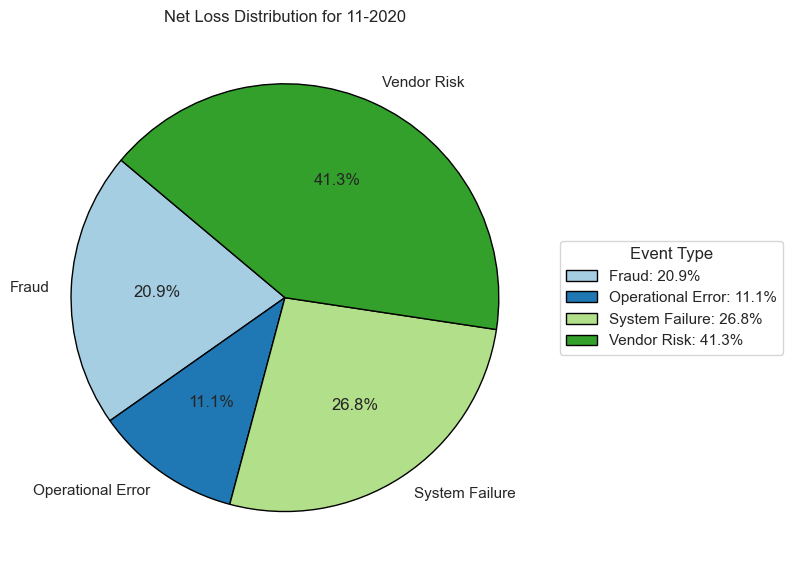

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


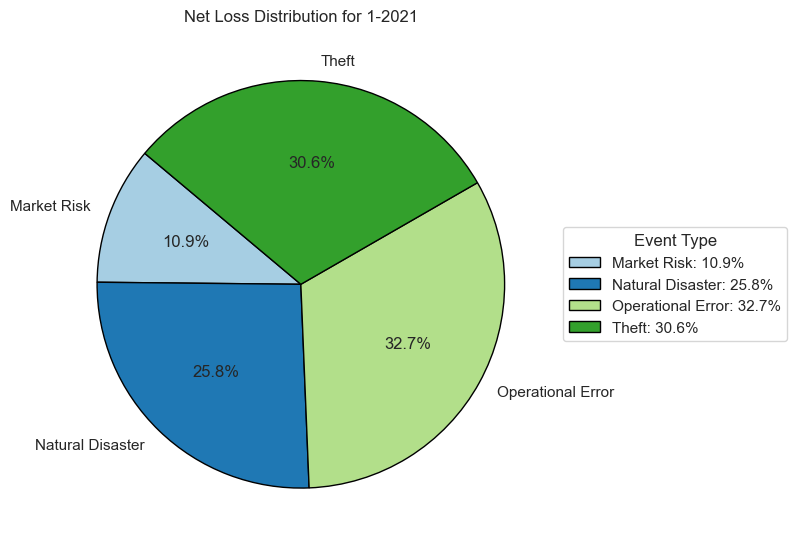

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


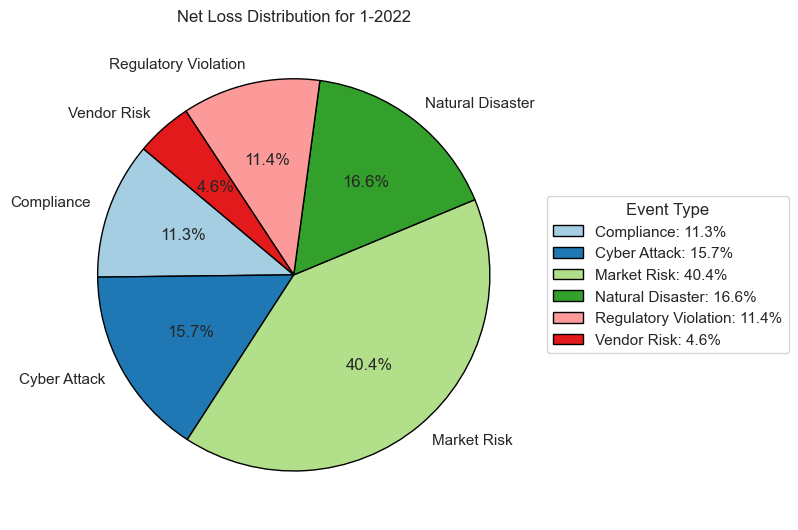

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


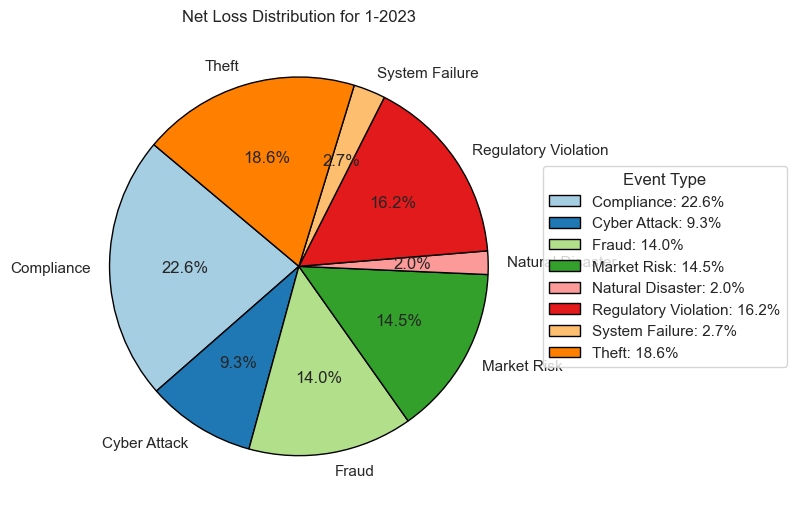

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


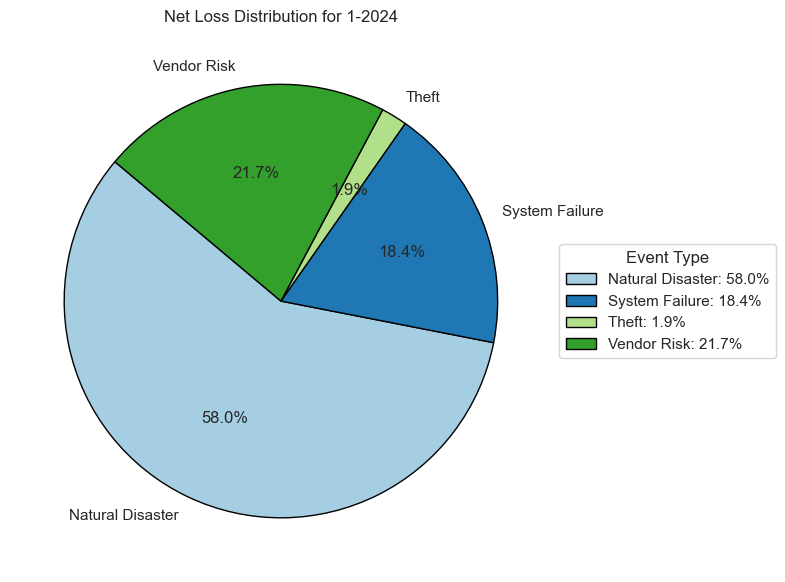

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\3829790407.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


<Figure size 640x480 with 0 Axes>

In [41]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming df is your original dataframe

# Extract Year and Month from the 'Date' column if not already done
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month

# Sum the Net Loss by Year, Month, and Event Type
grouped_data = df.groupby(['Year', 'Month', 'Event Type']).agg({
    'Net Loss Amount': 'sum'
}).reset_index()

# Remove rows where 'Net Loss Amount' is zero or negative
grouped_data = grouped_data[grouped_data['Net Loss Amount'] > 0]

# Create a separate pie chart for each month for every year
years = grouped_data['Year'].unique()
for year in years:
    fig, ax = plt.subplots(figsize=(8, 8))
    
    # Filter data for the current year
    year_data = grouped_data[grouped_data['Year'] == year]
    
    # Generate pie charts for each month in the year
    months = year_data['Month'].unique()
    
    for month in months:
        month_data = year_data[year_data['Month'] == month]
        
        # Normalize the Net Loss for the current month
        total_net_loss = month_data['Net Loss Amount'].sum()
        month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100
        
        # Pie chart for Net Loss distribution by Event Type
        wedges, texts, autotexts = ax.pie(
            month_data['Net Loss Amount'], 
            labels=month_data['Event Type'], 
            autopct='%1.1f%%',  # Show percentage on the pie chart
            startangle=140, 
            colors=plt.cm.Paired.colors[:len(month_data)],
            wedgeprops={'edgecolor': 'black'}  # Adds black borders around the wedges
        )
        
        # Title and show the pie chart for the month
        ax.set_title(f"Net Loss Distribution for {month}-{year}")
        ax.legend(
            wedges, 
            [f"{event}: {month_data[month_data['Event Type'] == event]['Percentage'].values[0]:.1f}%" for event in month_data['Event Type']], 
            title="Event Type", 
            loc="center left", 
            bbox_to_anchor=(1, 0, 0.5, 1)
        )
        
        plt.tight_layout()
        plt.show()


C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\2397050002.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100


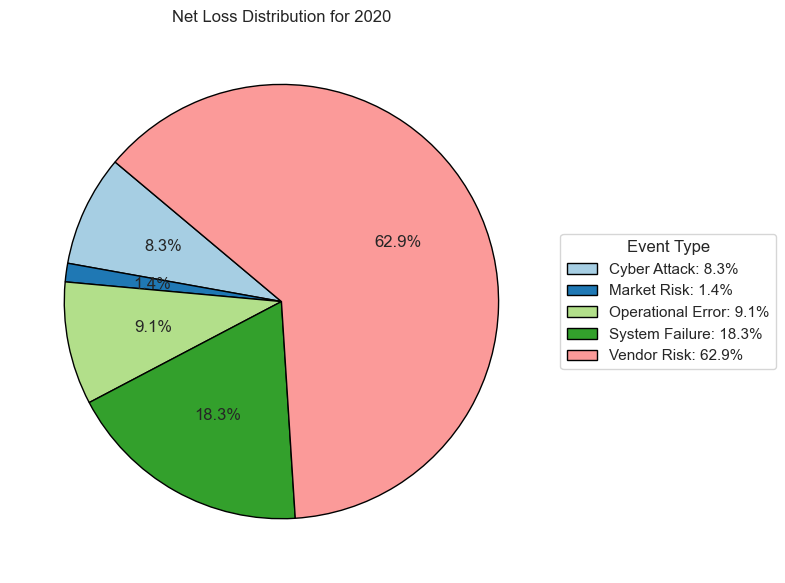

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\2397050002.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100


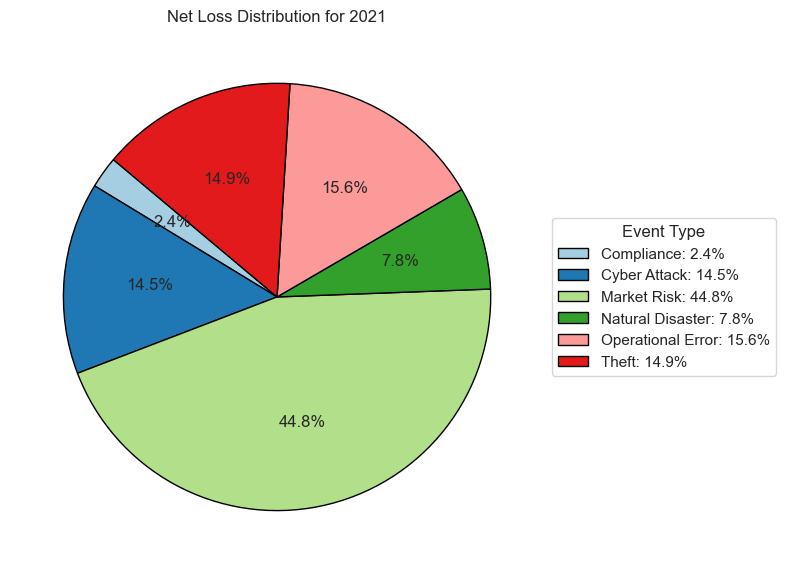

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\2397050002.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100


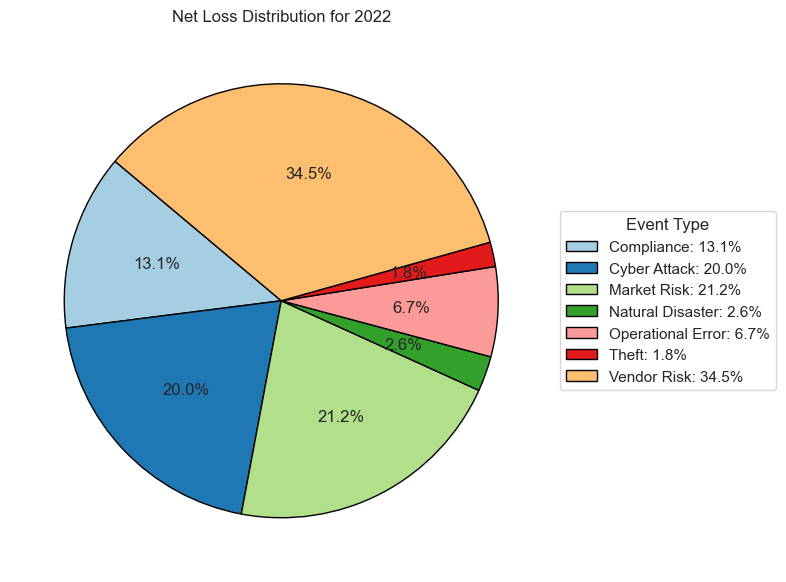

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\2397050002.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100


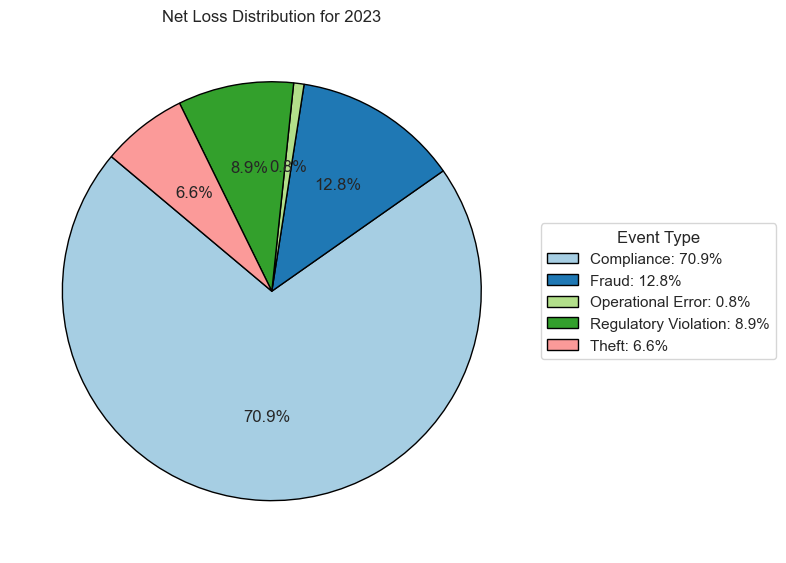

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\2397050002.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100


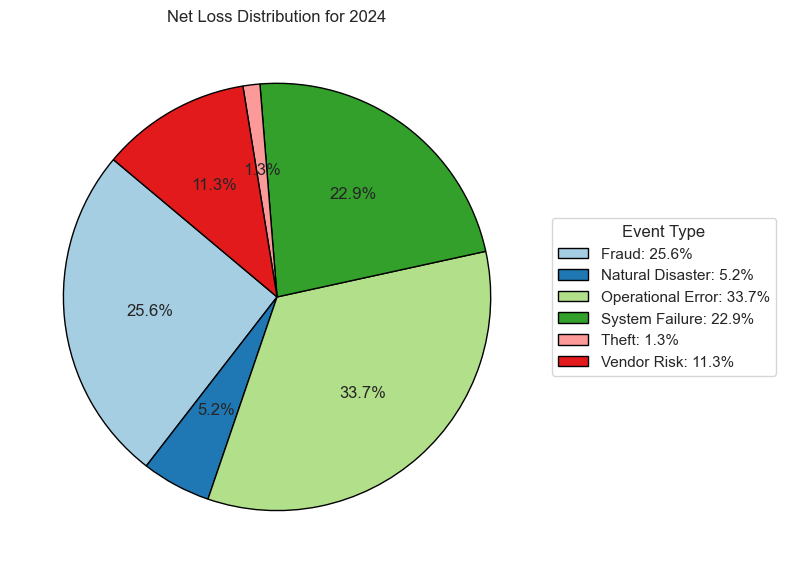

In [43]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming df is your dataframe
df['Year'] = df['Date'].dt.year  # Extract year if not already done

# Group by Year and Event Type and sum the Net Loss Amount
grouped_data = df.groupby(['Year', 'Event Type']).agg({
    'Net Loss Amount': 'sum'
}).reset_index()

# Remove rows where 'Net Loss Amount' is zero or negative
grouped_data = grouped_data[grouped_data['Net Loss Amount'] > 0]

# Create a pie chart for each year
years = grouped_data['Year'].unique()
for year in years:
    fig, ax = plt.subplots(figsize=(8, 8))

    # Filter data for the current year
    year_data = grouped_data[grouped_data['Year'] == year]

    # Normalize the Net Loss for the current year
    total_net_loss = year_data['Net Loss Amount'].sum()
    year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100

    # Pie chart for Net Loss distribution by Event Type (No labels on the chart)
    wedges, texts, autotexts = ax.pie(
        year_data['Net Loss Amount'],
        labels=None,  # No labels on the chart itself
        autopct='%1.1f%%',  # Show percentage on the pie chart
        startangle=140,
        colors=plt.cm.Paired.colors[:len(year_data)],
        wedgeprops={'edgecolor': 'black'}  # Adds black borders around the wedges
    )

    # Title and show the pie chart for the year
    ax.set_title(f"Net Loss Distribution for {year}")
    ax.legend(
        wedges,
        [f"{event}: {year_data[year_data['Event Type'] == event]['Percentage'].values[0]:.1f}%" for event in year_data['Event Type']],
        title="Event Type",
        loc="center left",
        bbox_to_anchor=(1, 0, 0.5, 1)
    )

    plt.tight_layout()
    plt.show()


C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\885380376.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100


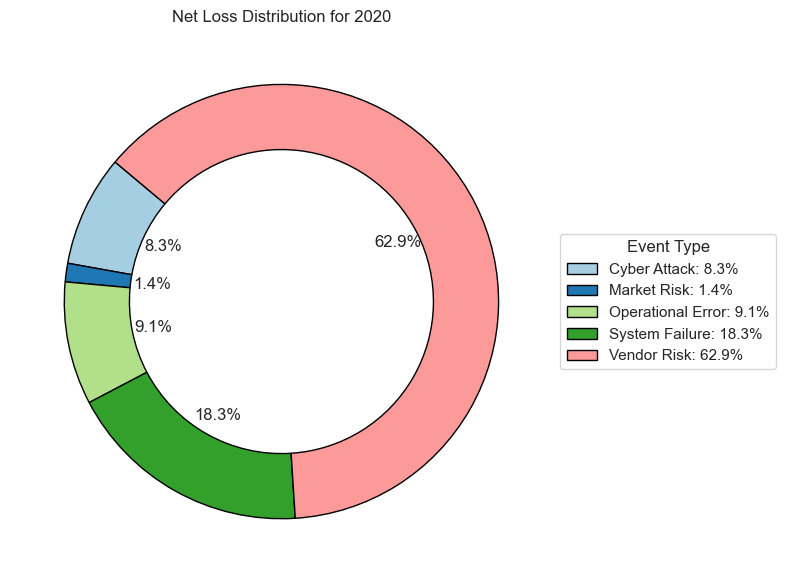

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\885380376.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100


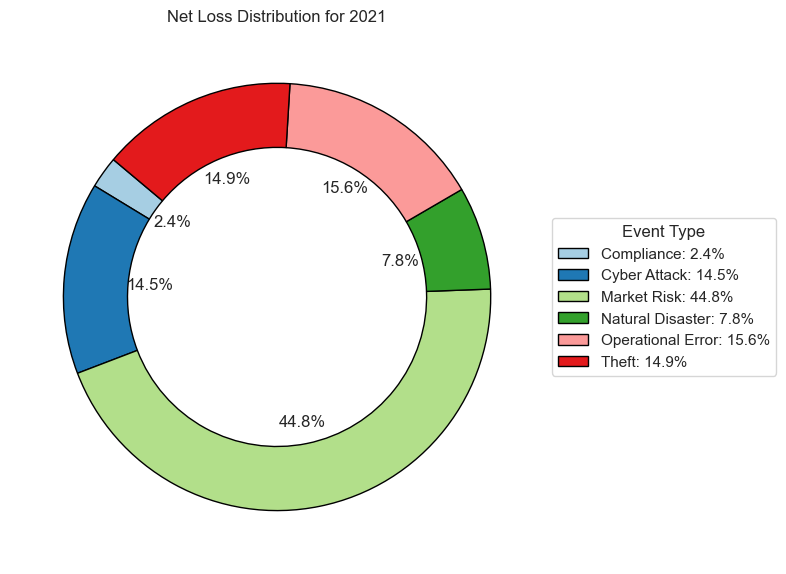

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\885380376.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100


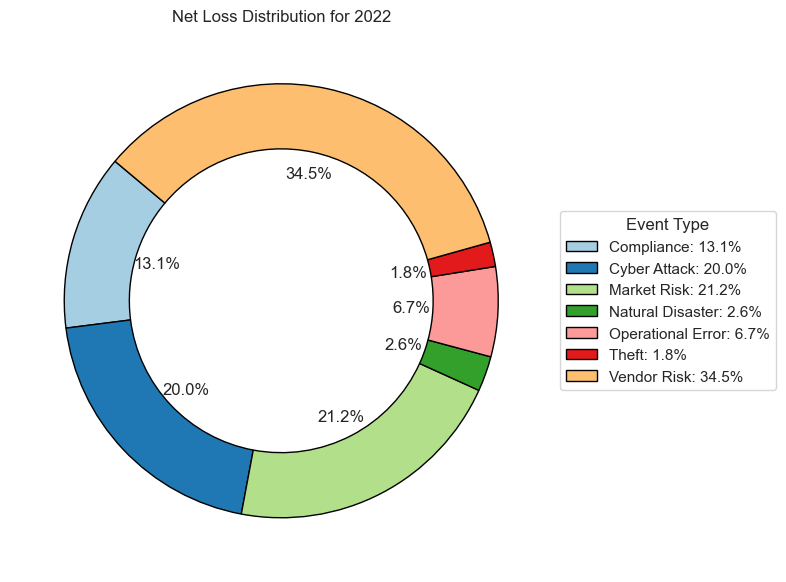

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\885380376.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100


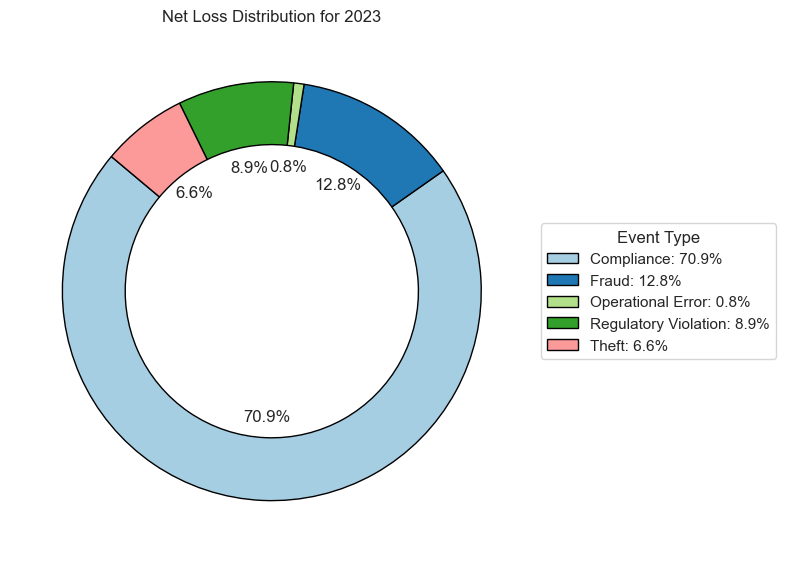

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\885380376.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100


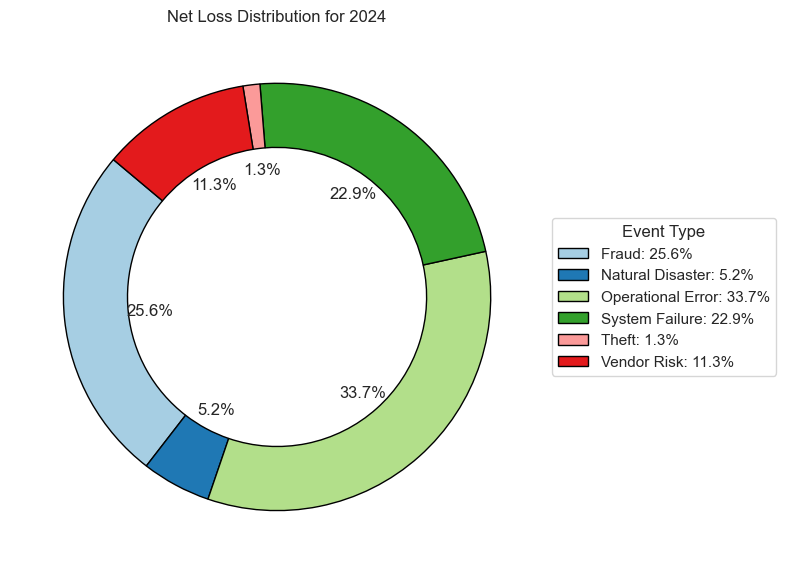

In [44]:
#danut hcrat
import matplotlib.pyplot as plt
import pandas as pd

# Assuming df is your dataframe
df['Year'] = df['Date'].dt.year  # Extract year if not already done

# Group by Year and Event Type and sum the Net Loss Amount
grouped_data = df.groupby(['Year', 'Event Type']).agg({
    'Net Loss Amount': 'sum'
}).reset_index()

# Remove rows where 'Net Loss Amount' is zero or negative
grouped_data = grouped_data[grouped_data['Net Loss Amount'] > 0]

# Create a Doughnut chart for each year
years = grouped_data['Year'].unique()
for year in years:
    fig, ax = plt.subplots(figsize=(8, 8))

    # Filter data for the current year
    year_data = grouped_data[grouped_data['Year'] == year]

    # Normalize the Net Loss for the current year
    total_net_loss = year_data['Net Loss Amount'].sum()
    year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100

    # Doughnut chart for Net Loss distribution by Event Type (No labels on the chart itself)
    wedges, texts, autotexts = ax.pie(
        year_data['Net Loss Amount'],
        labels=None,  # No labels on the chart itself
        autopct='%1.1f%%',  # Show percentage on the pie chart
        startangle=140,
        colors=plt.cm.Paired.colors[:len(year_data)],
        wedgeprops={'edgecolor': 'black', 'width': 0.3}  # Doughnut effect with width
    )

    # Title and show the Doughnut chart for the year
    ax.set_title(f"Net Loss Distribution for {year}")
    
    # Legend showing Event Type and percentage
    ax.legend(
        wedges,
        [f"{event}: {year_data[year_data['Event Type'] == event]['Percentage'].values[0]:.1f}%" for event in year_data['Event Type']],
        title="Event Type",
        loc="center left",
        bbox_to_anchor=(1, 0, 0.5, 1)
    )

    plt.tight_layout()
    plt.show()


C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100


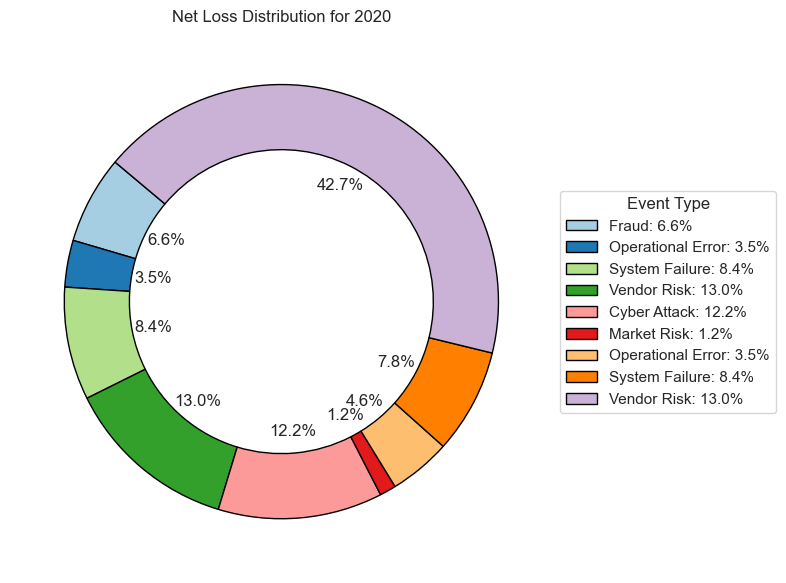

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100


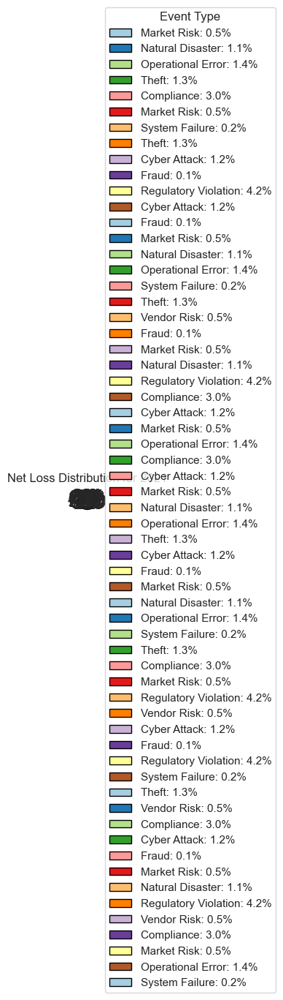

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100
C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:53: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


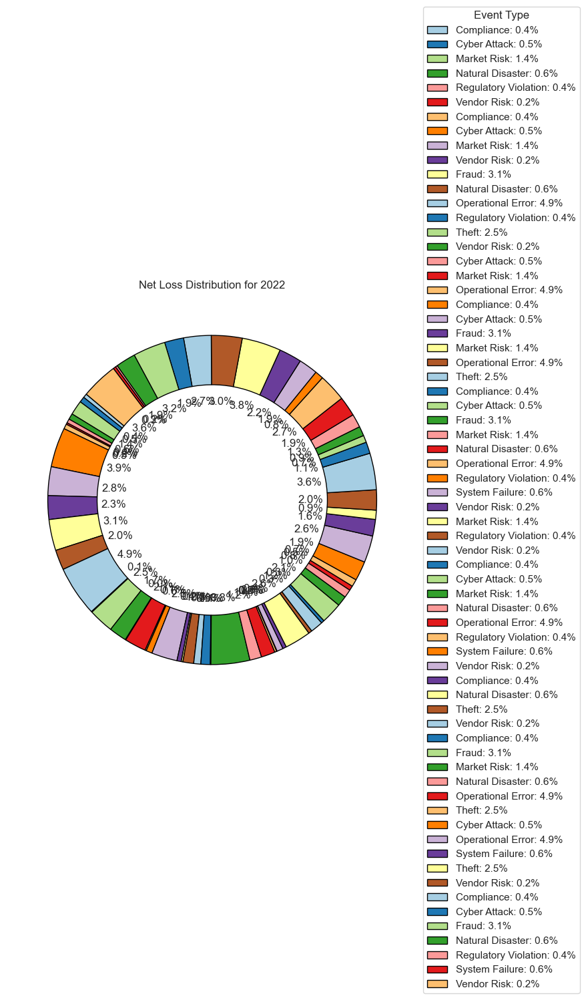

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100


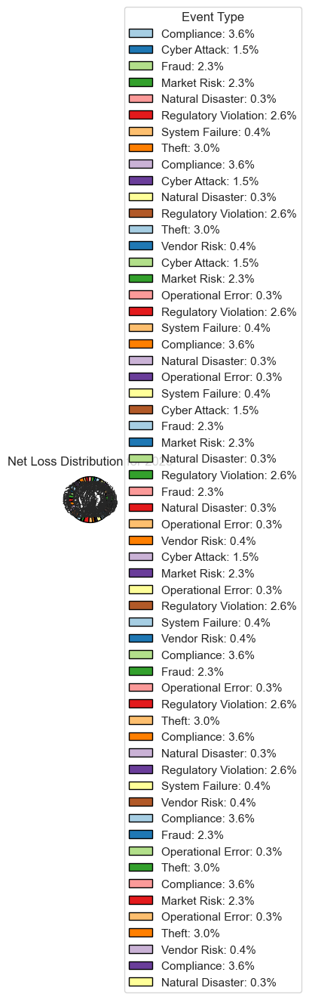

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100


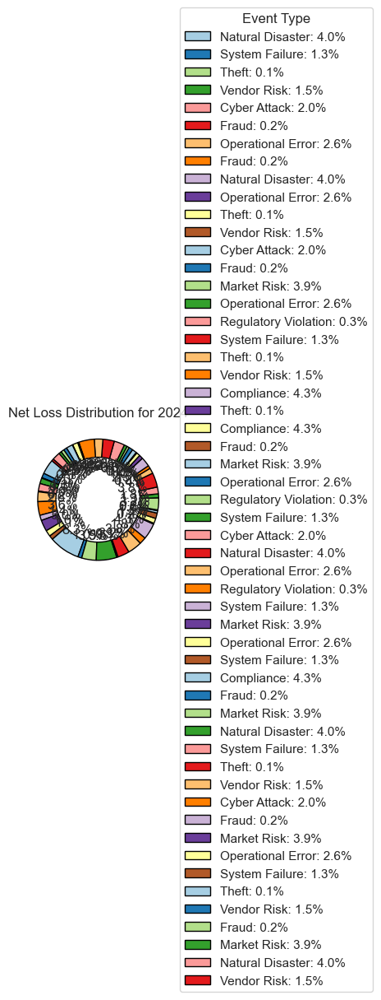

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


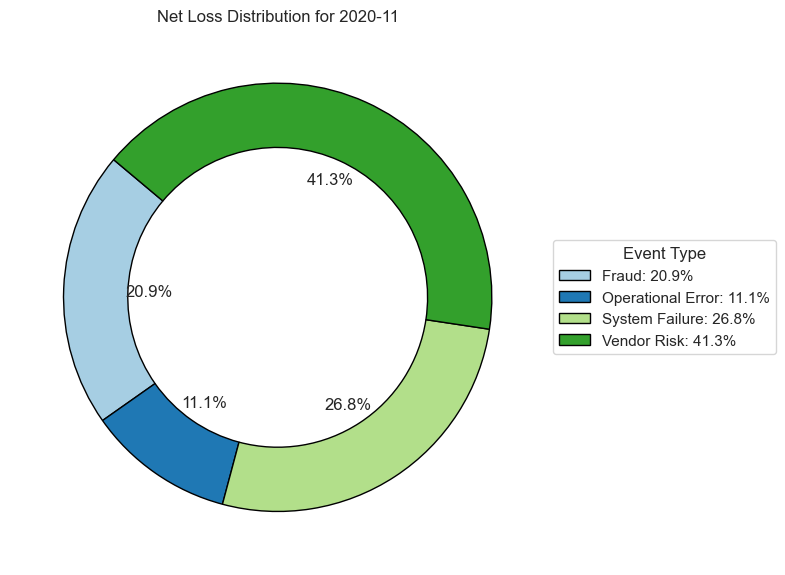

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


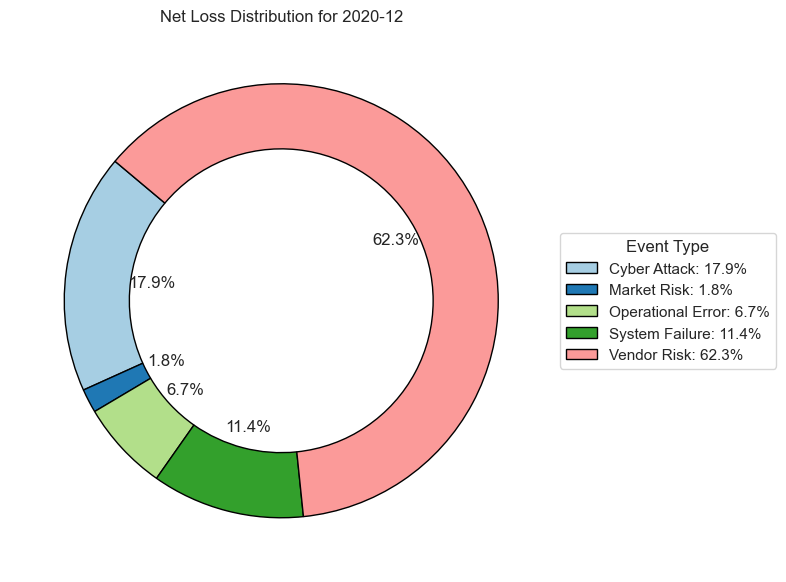

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


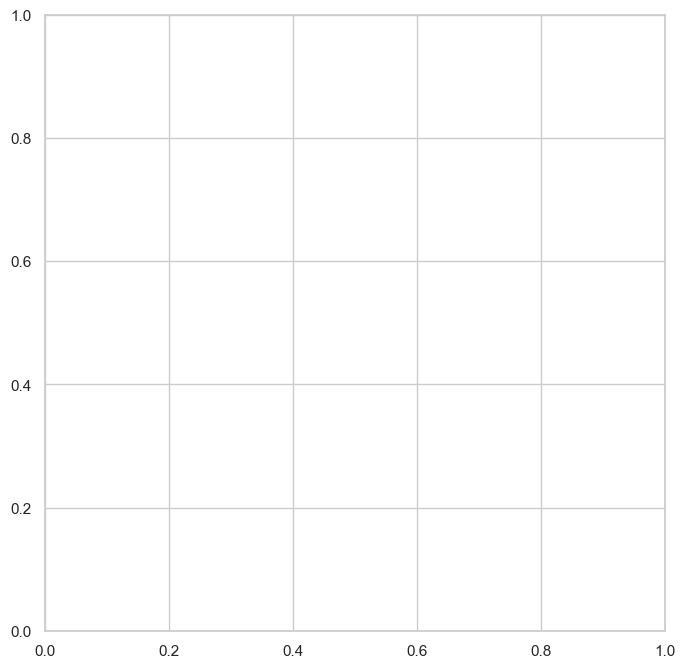

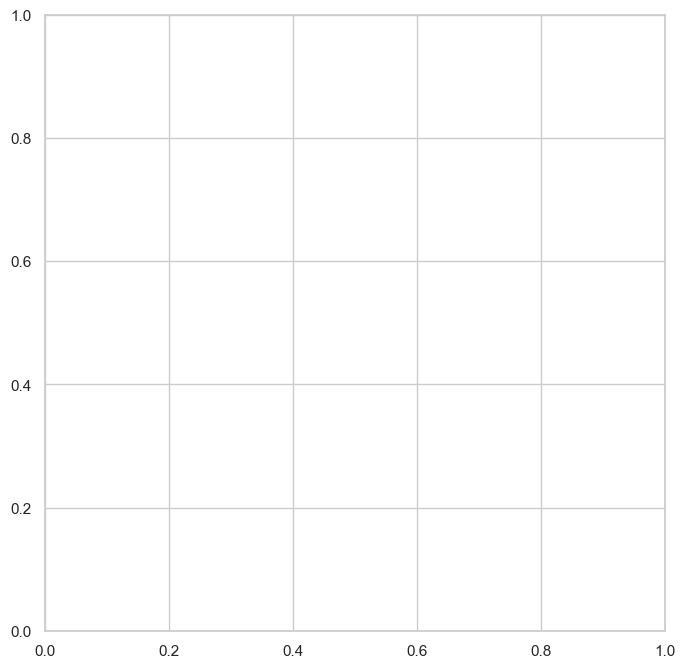

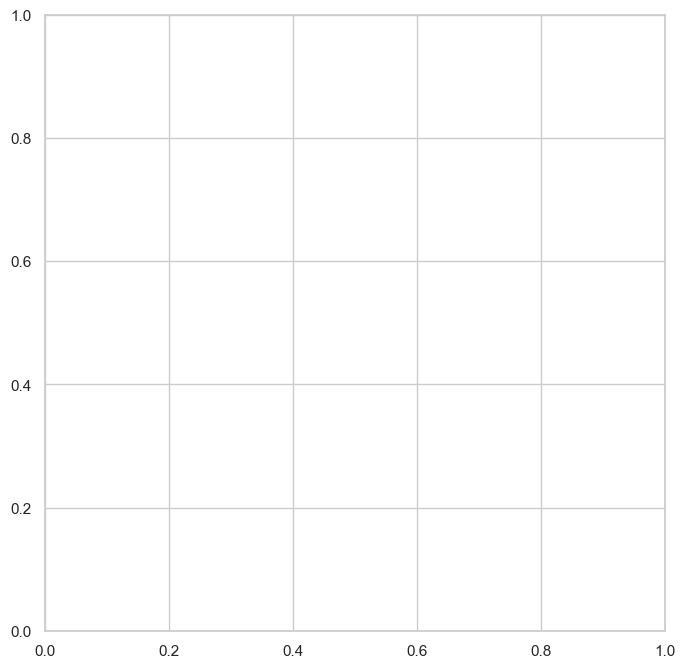

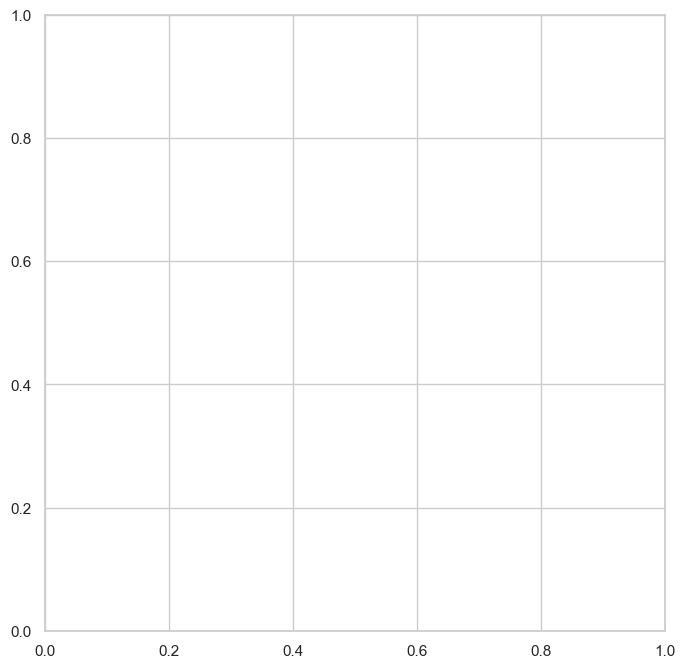

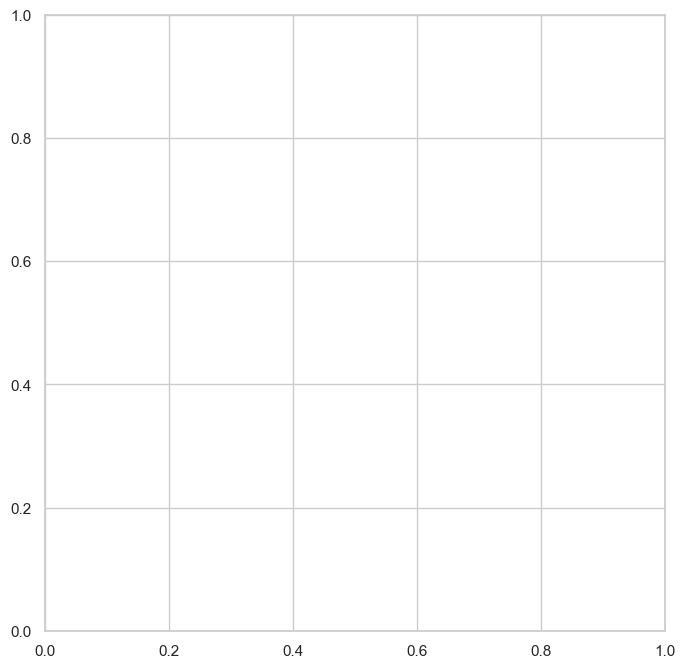

...

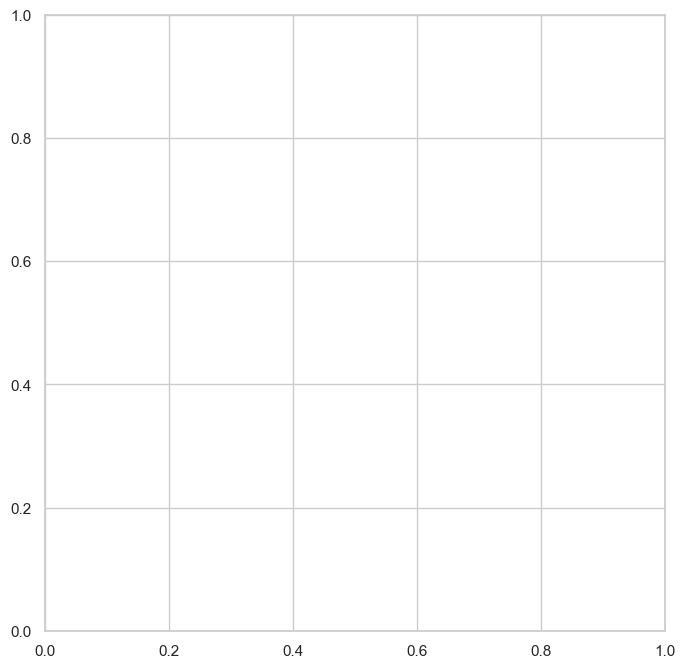

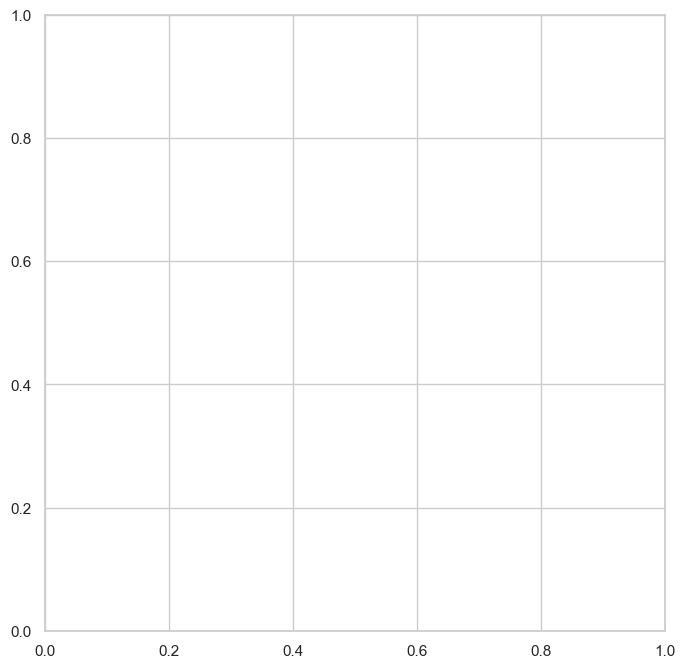

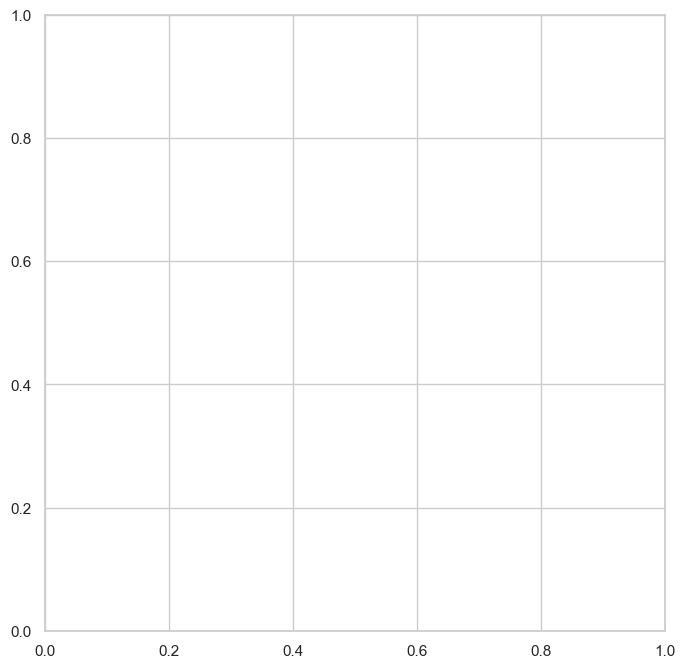

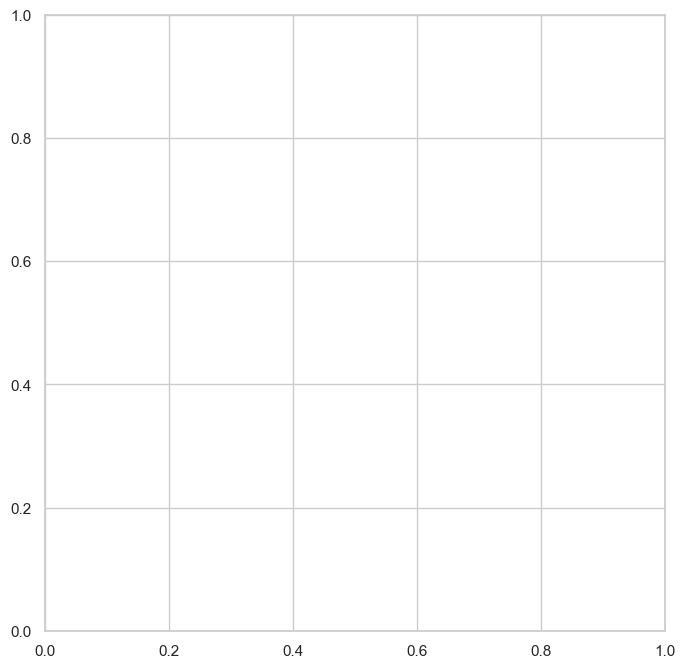

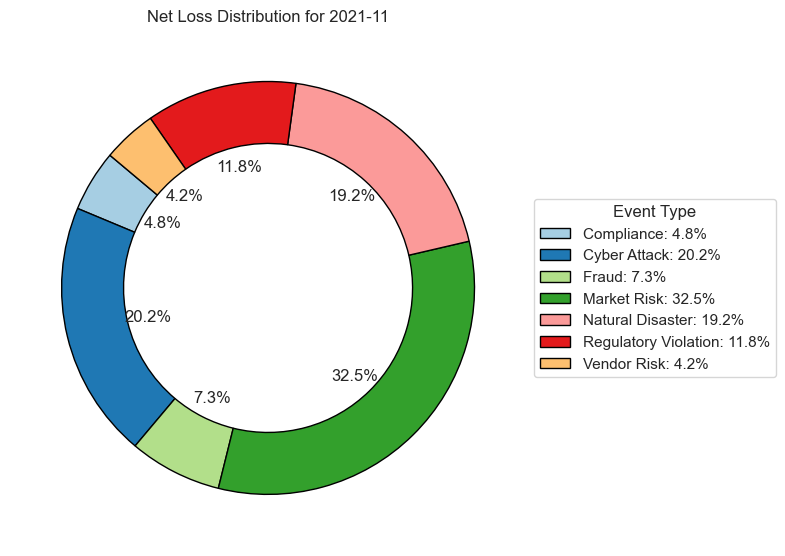

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


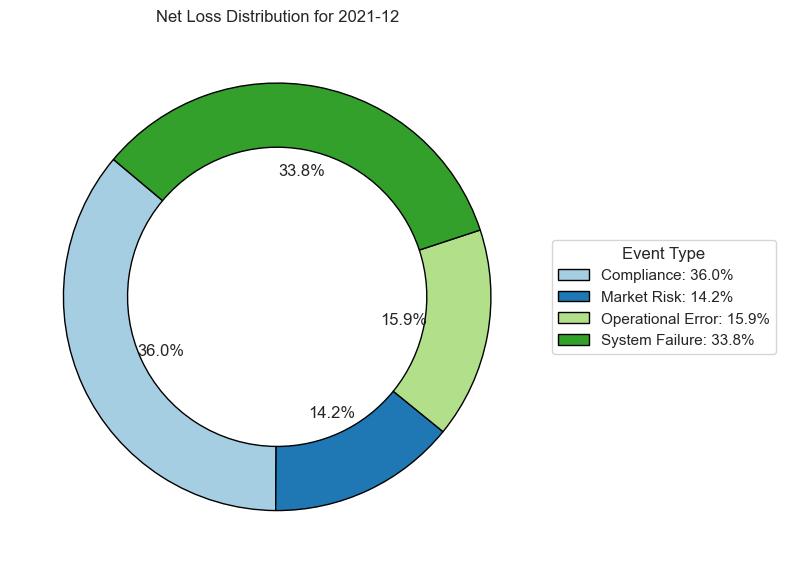

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


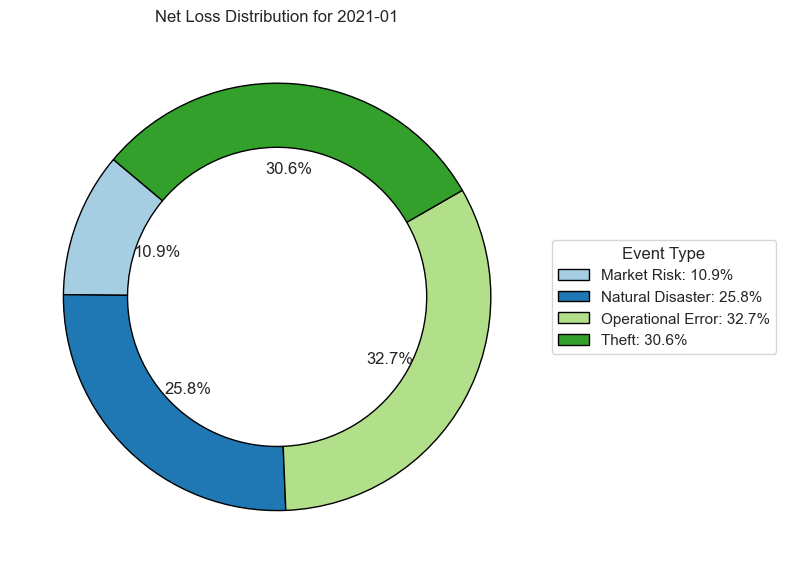

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


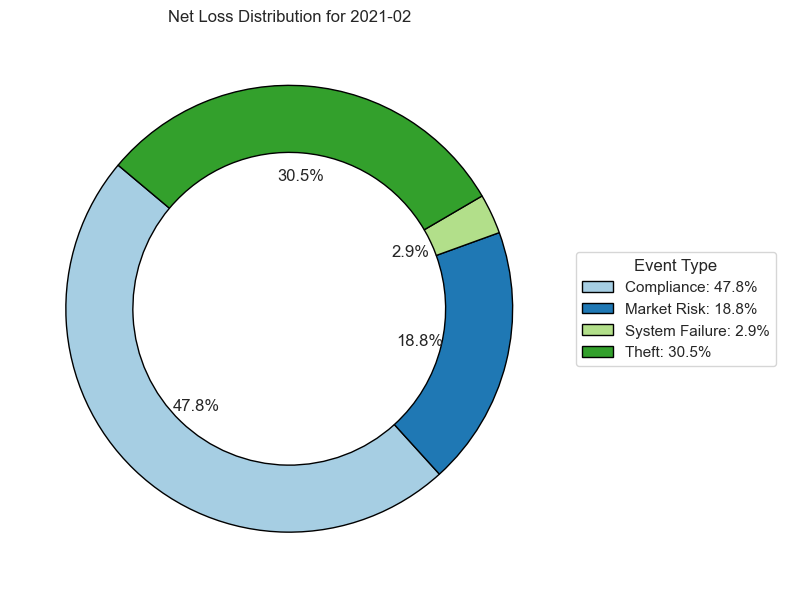

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


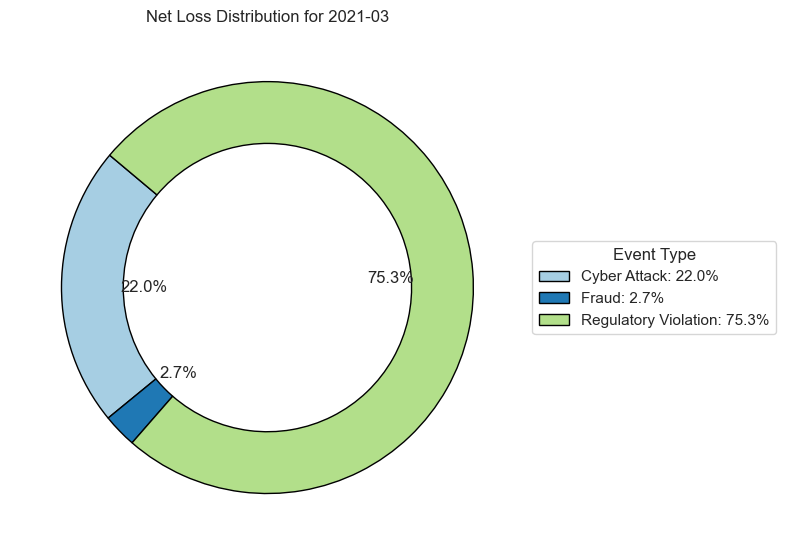

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


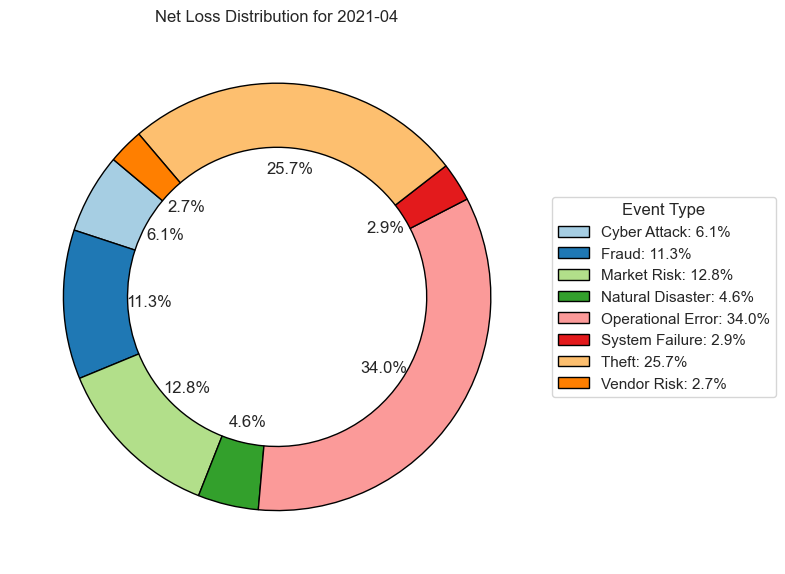

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


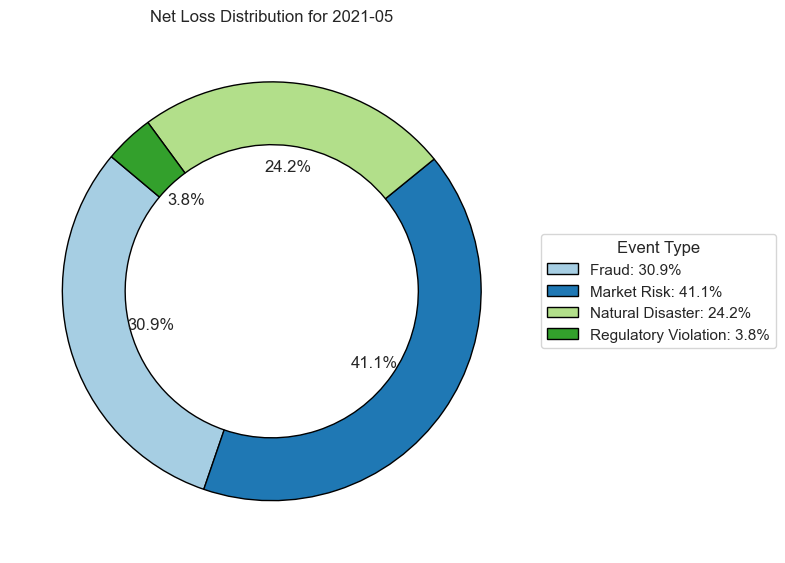

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


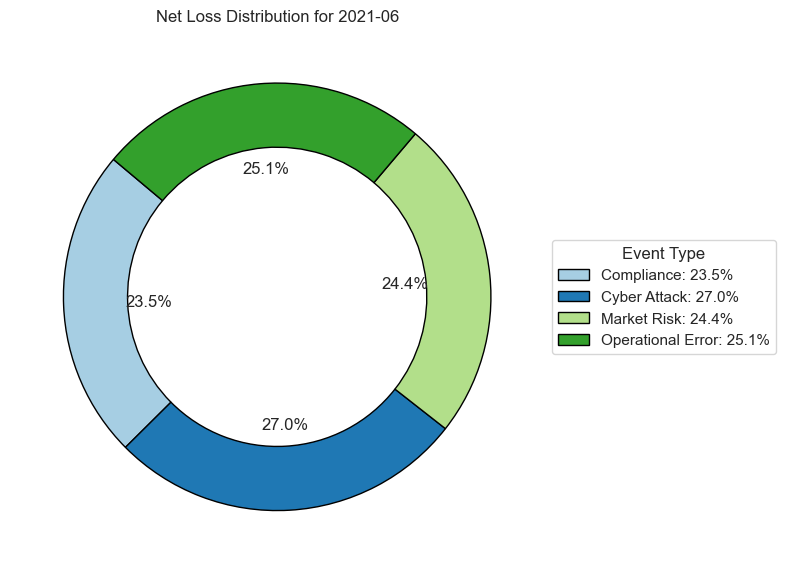

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


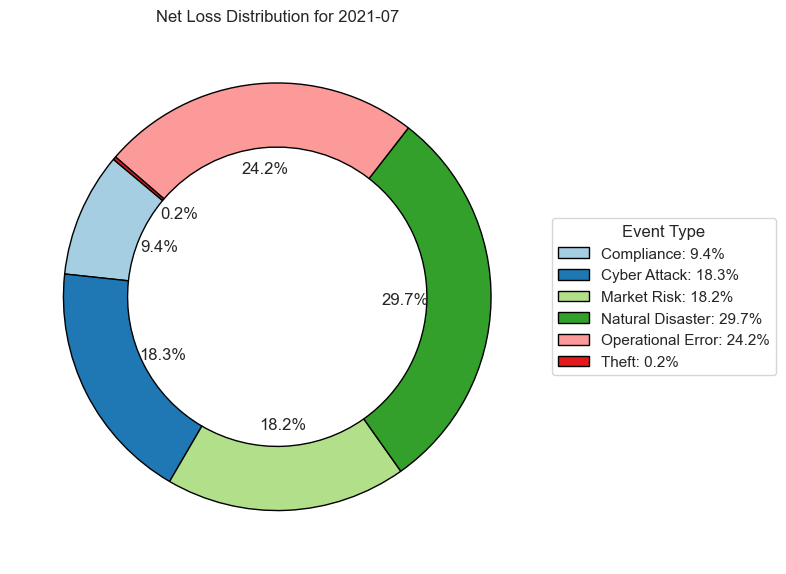

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


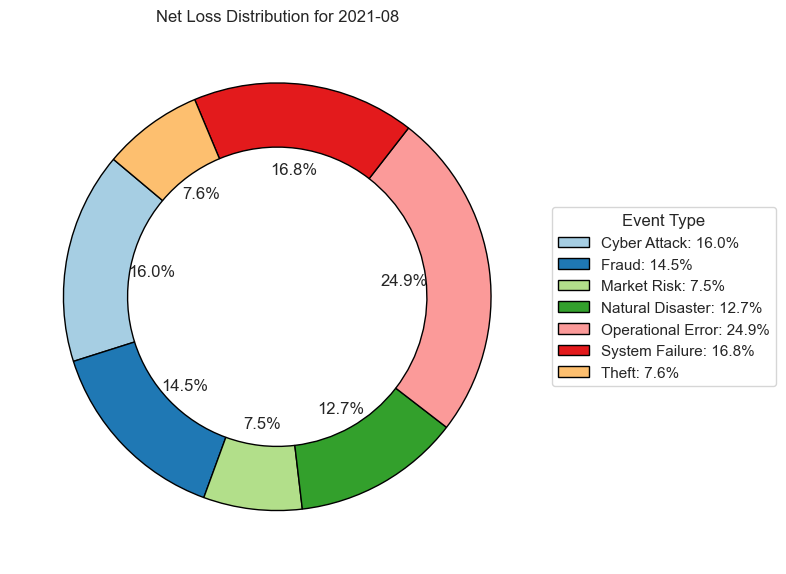

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


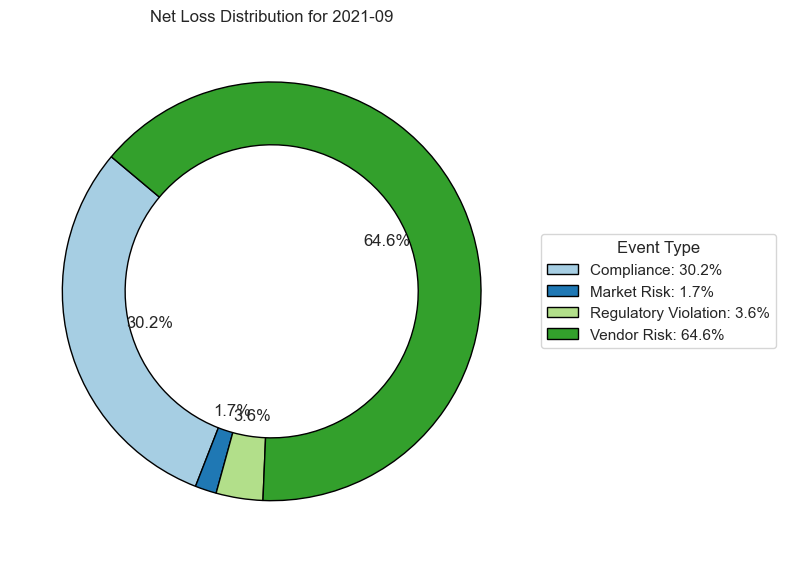

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


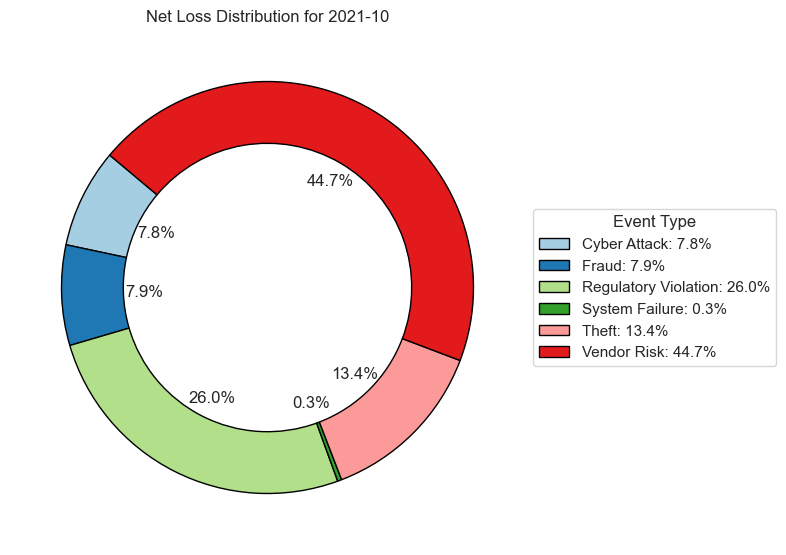

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


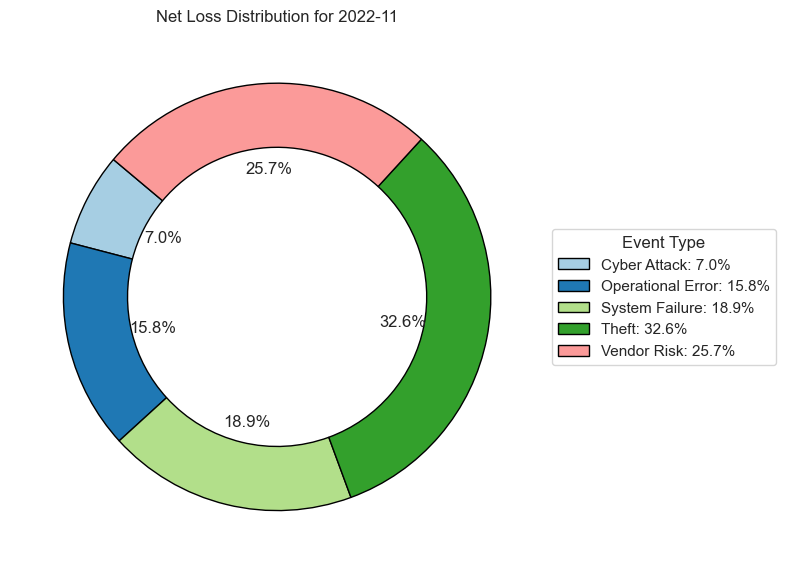

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


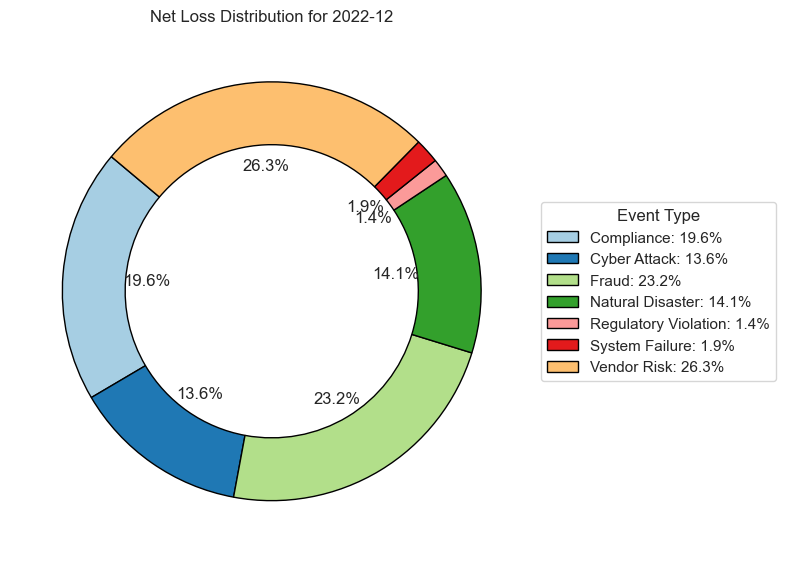

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


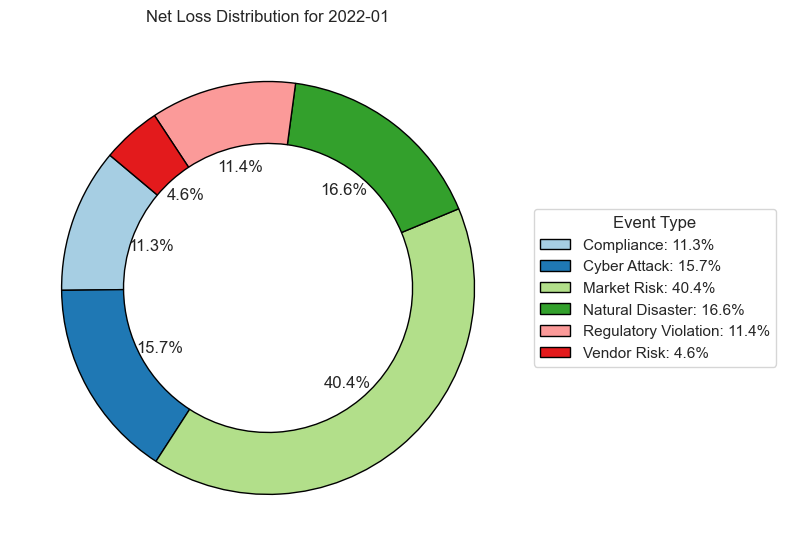

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


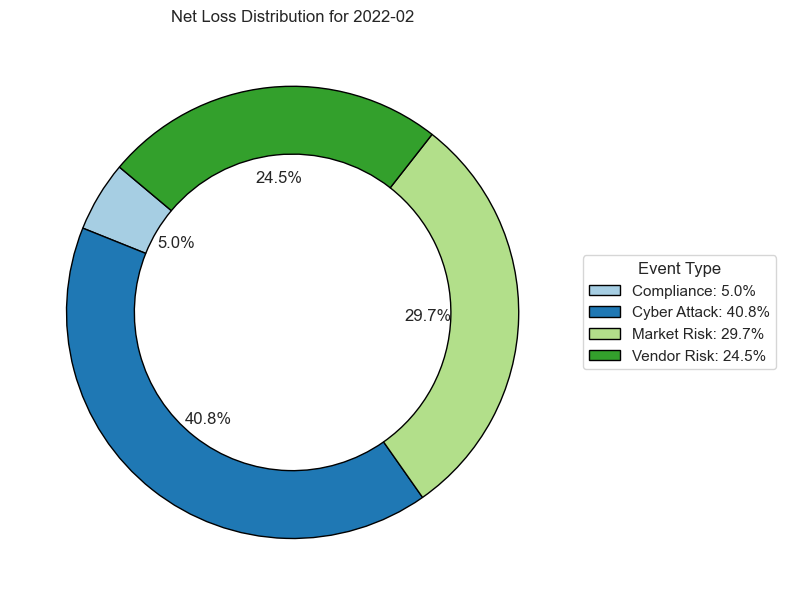

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


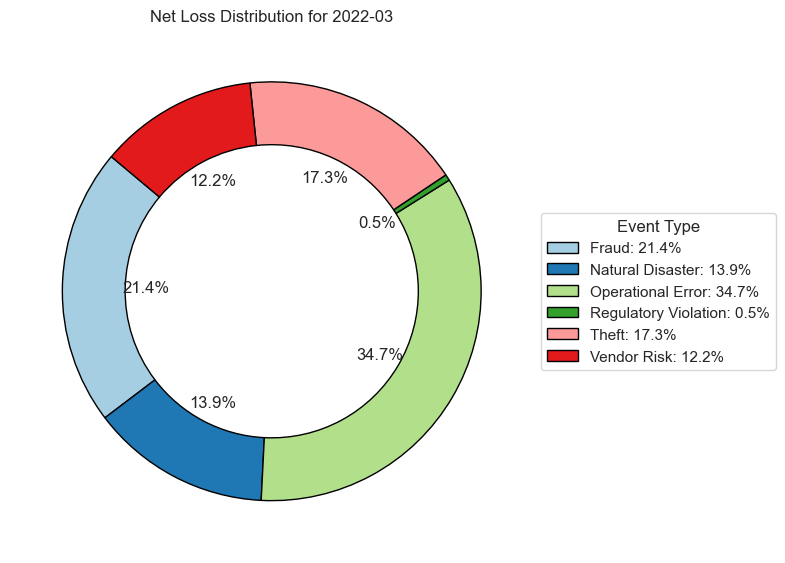

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


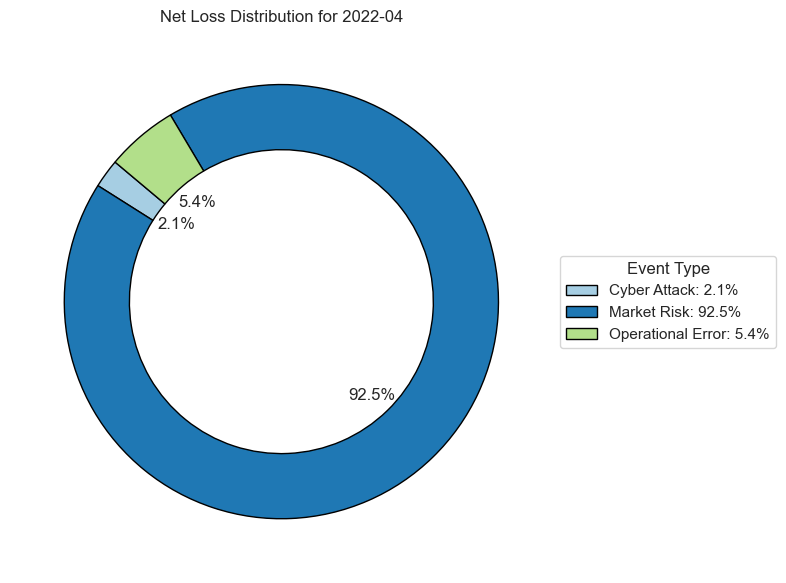

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


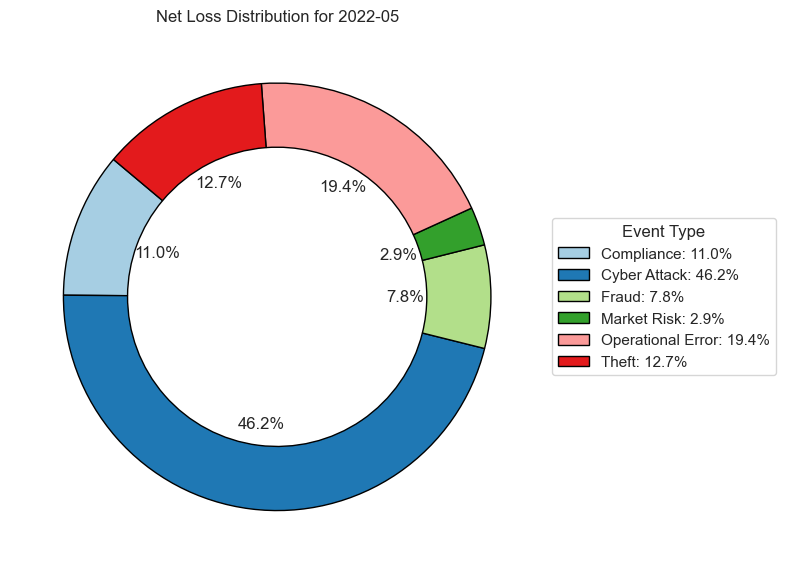

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


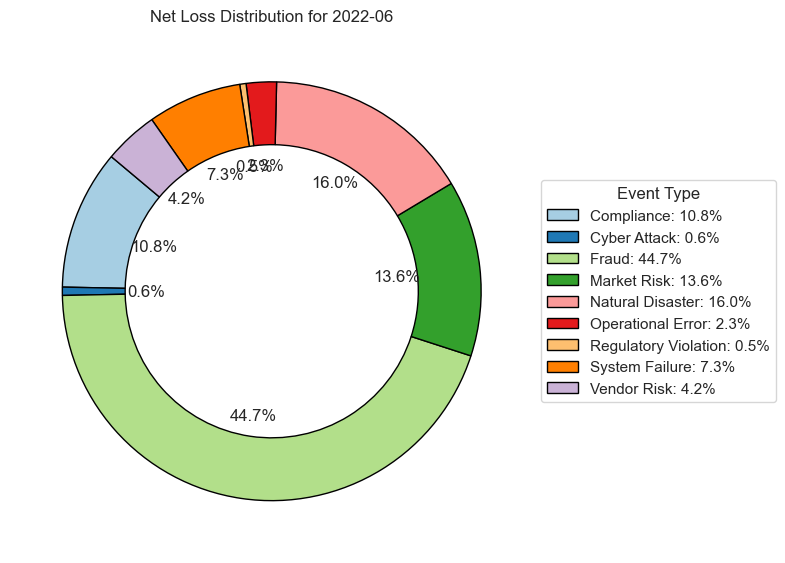

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


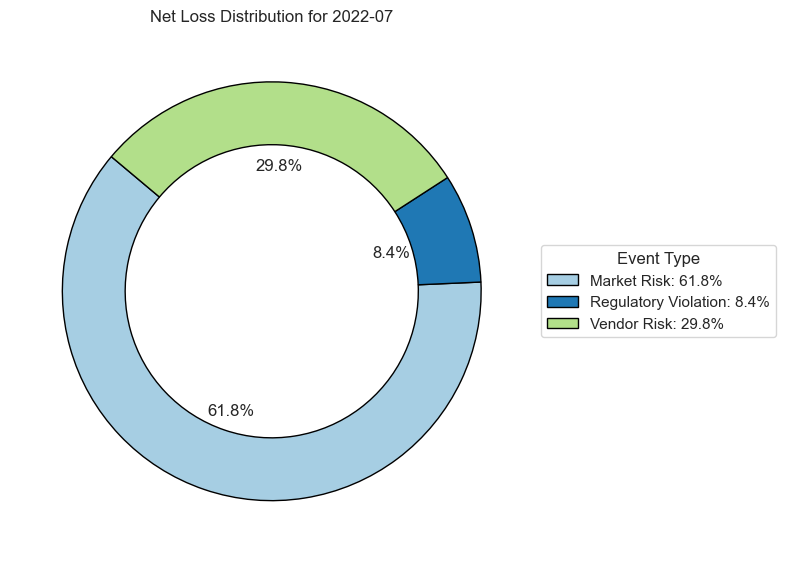

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


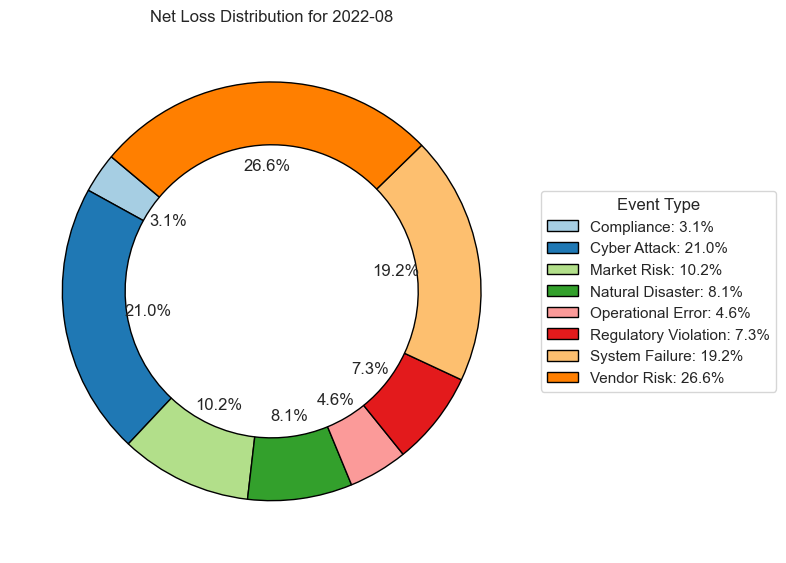

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


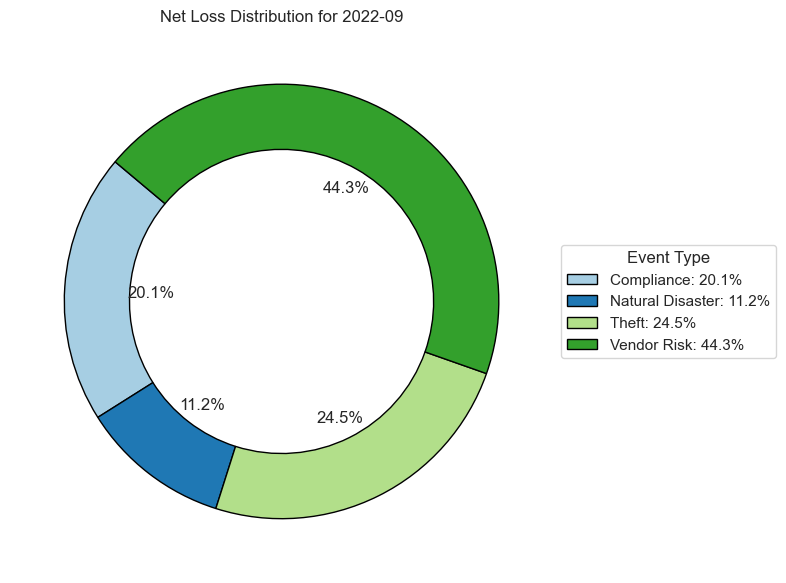

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


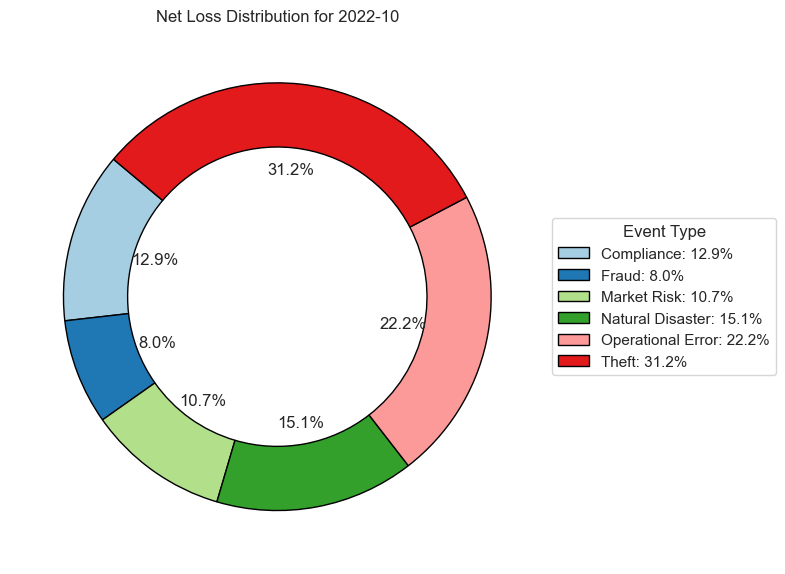

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


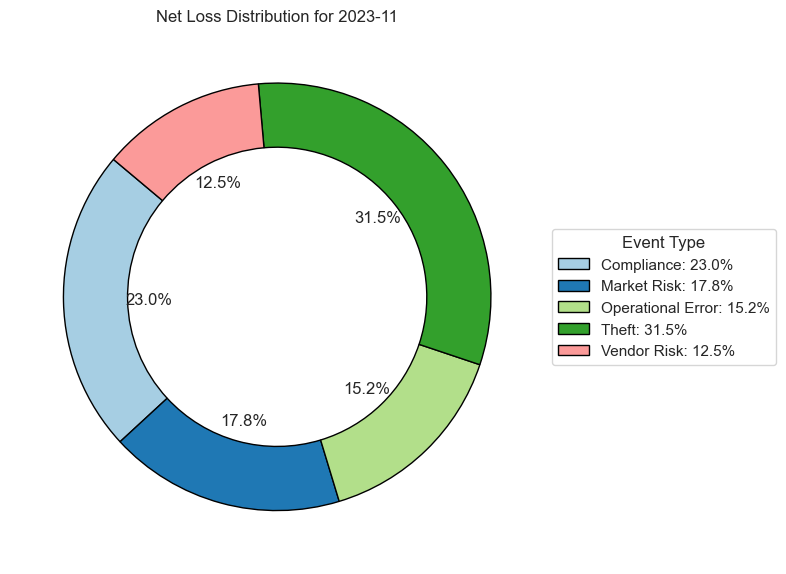

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


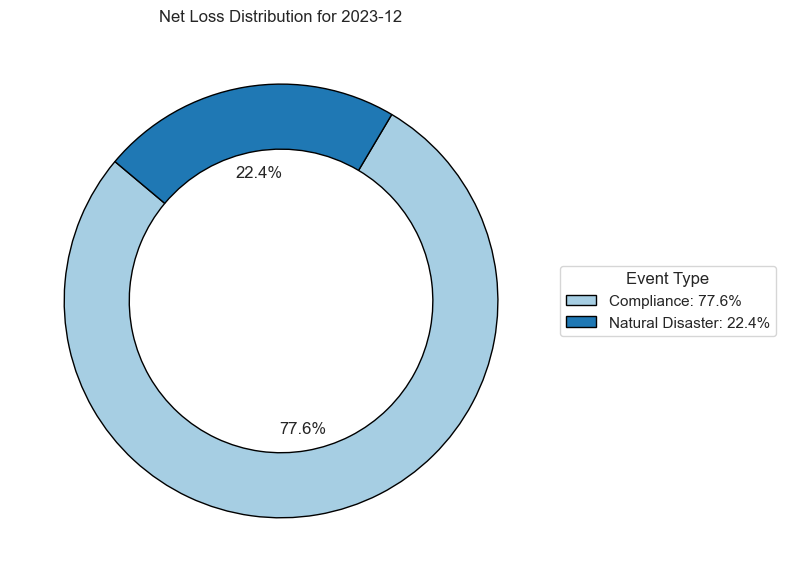

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


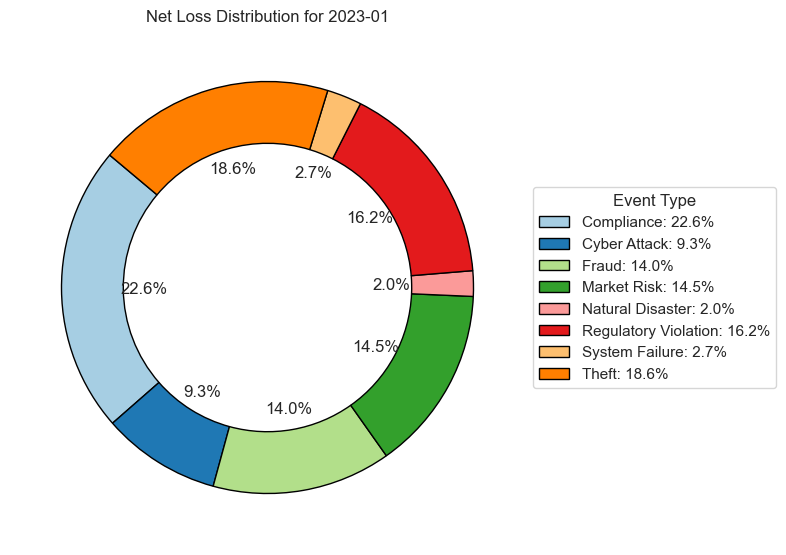

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


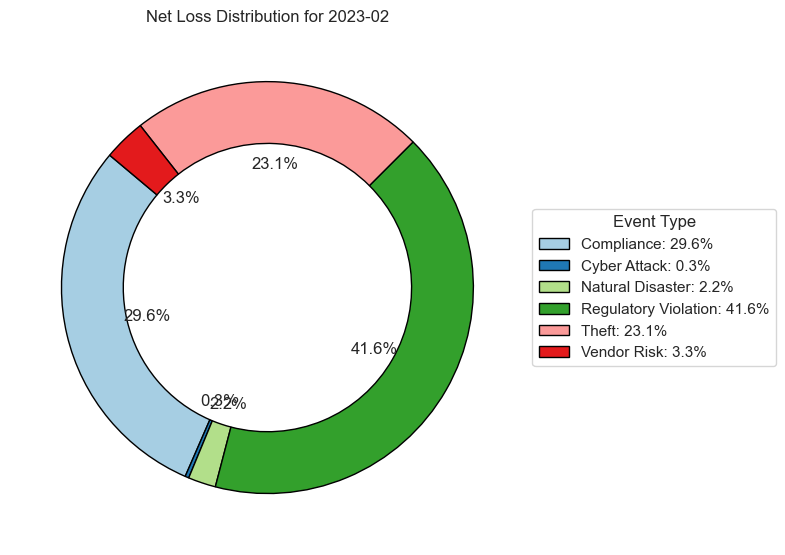

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


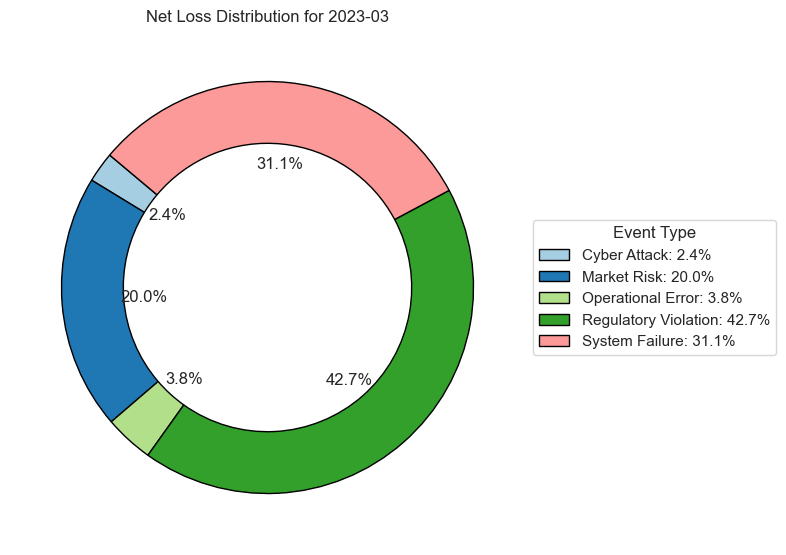

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


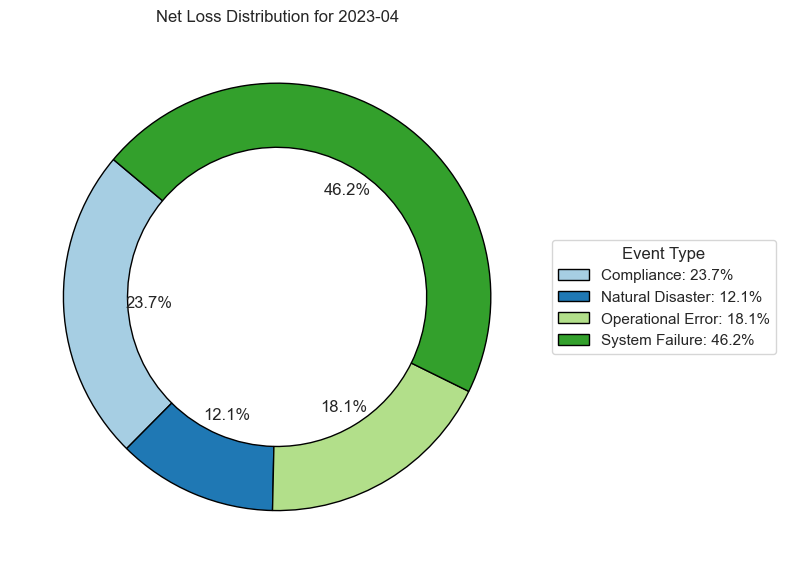

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


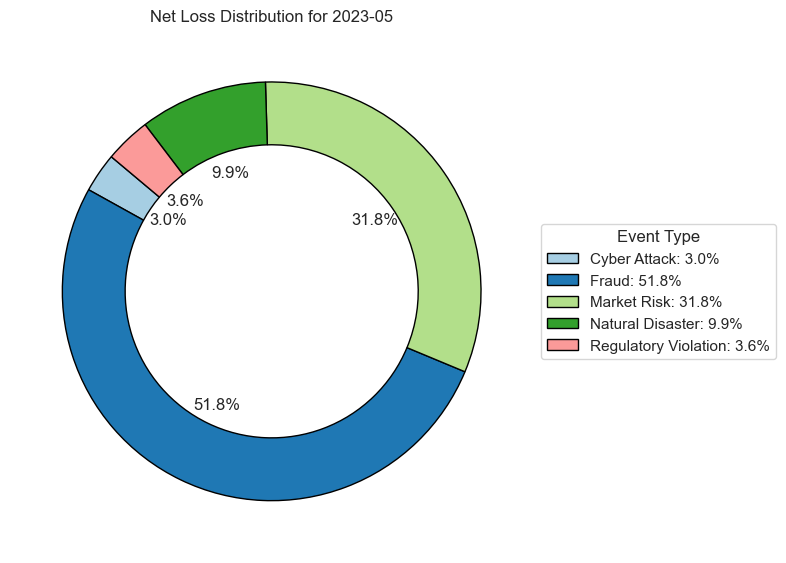

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


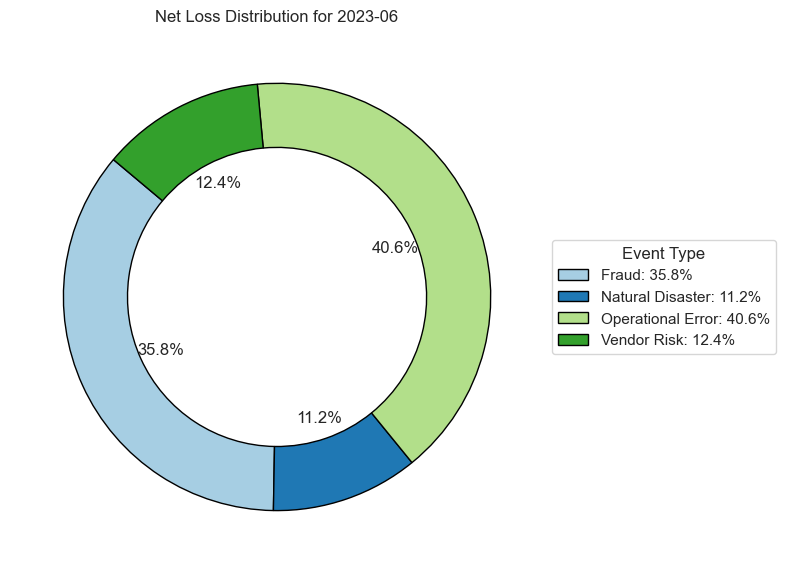

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


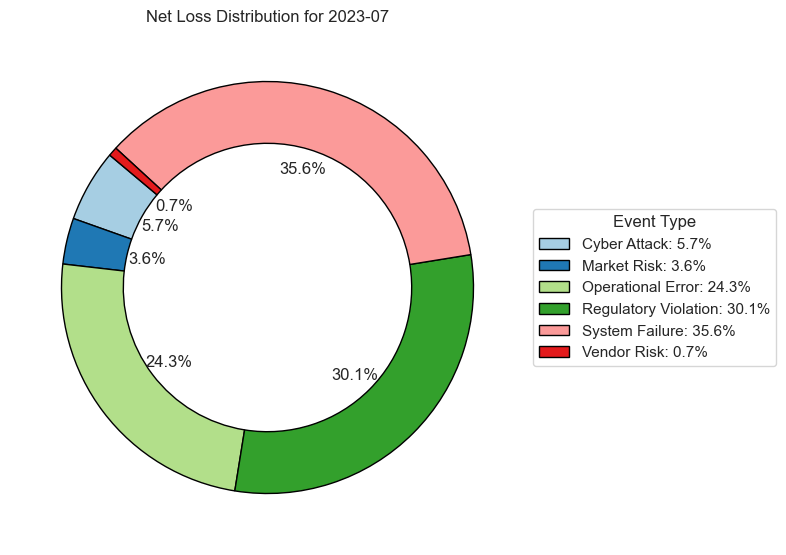

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


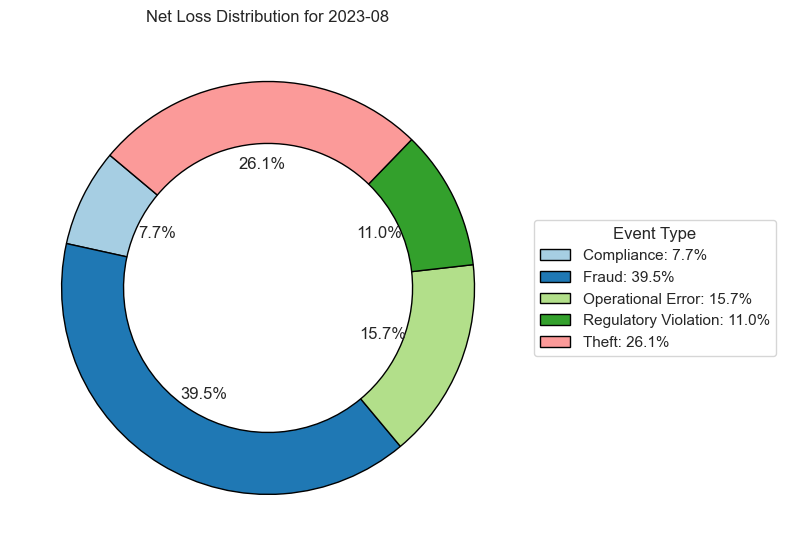

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


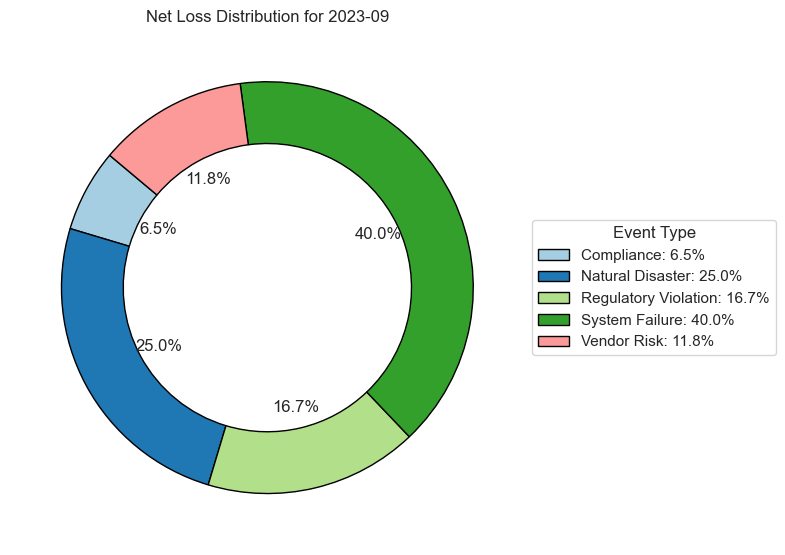

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


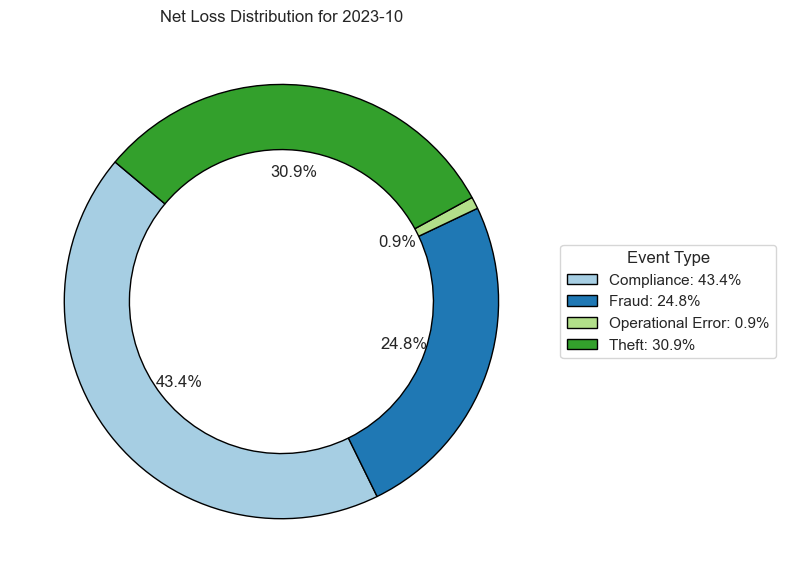

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


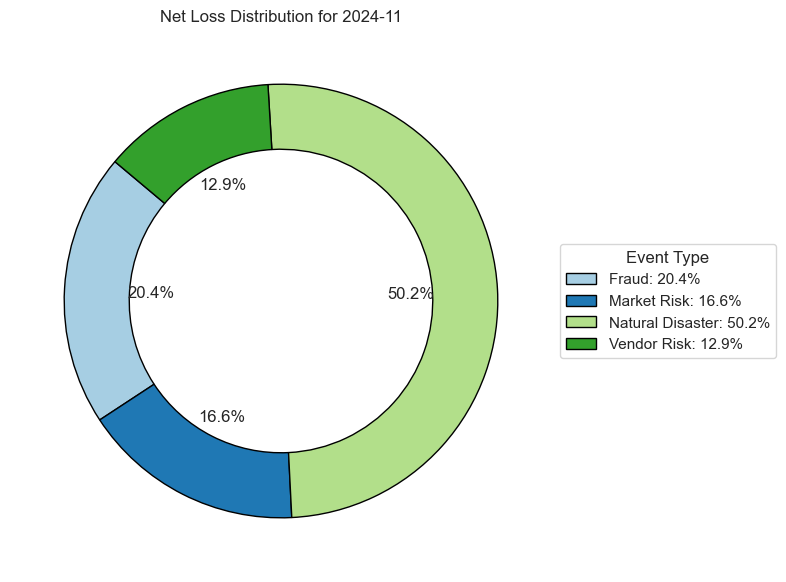

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


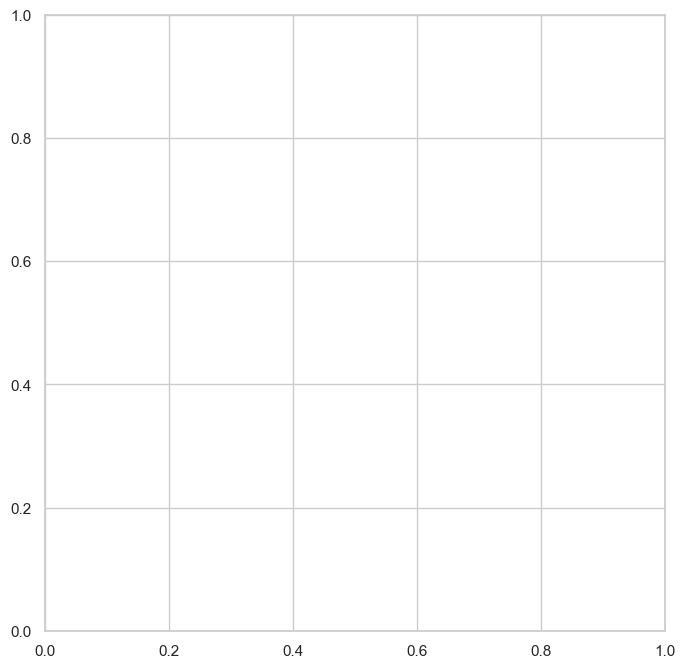

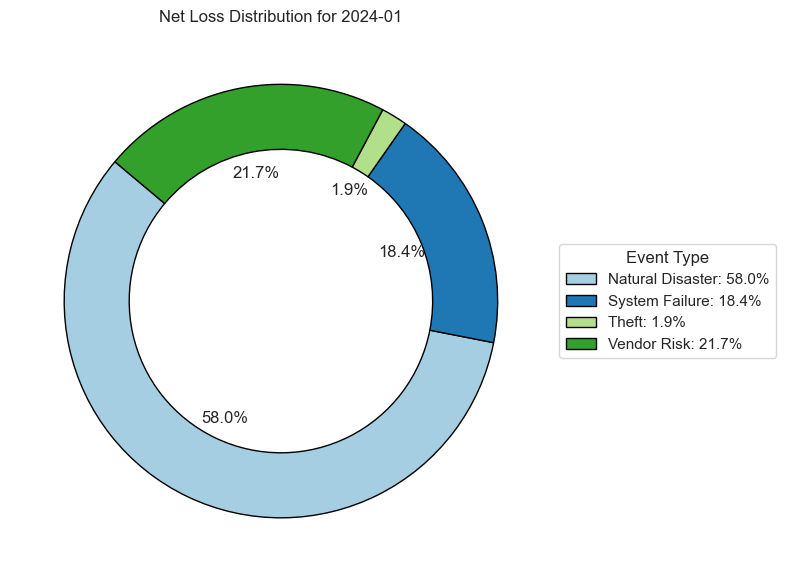

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


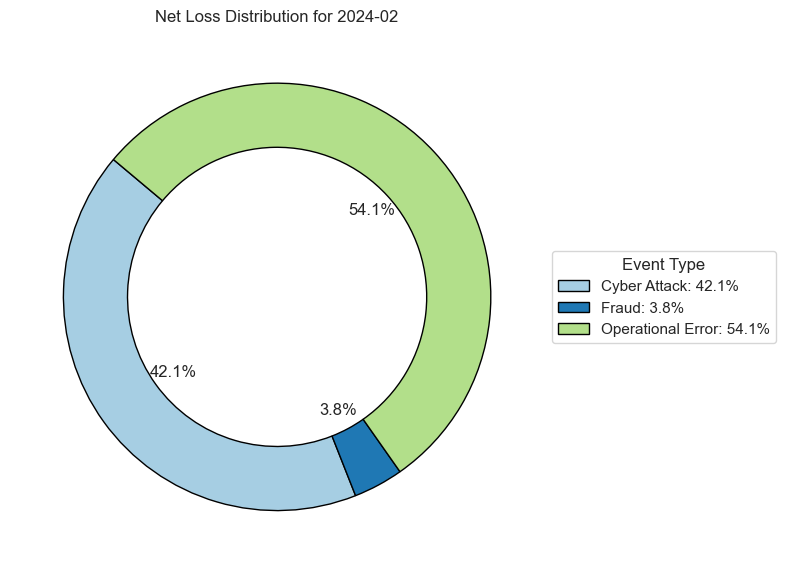

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


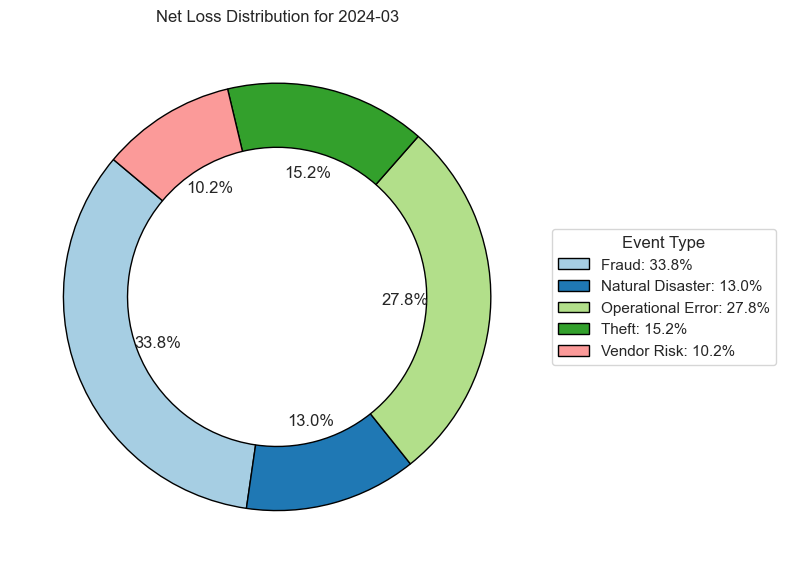

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


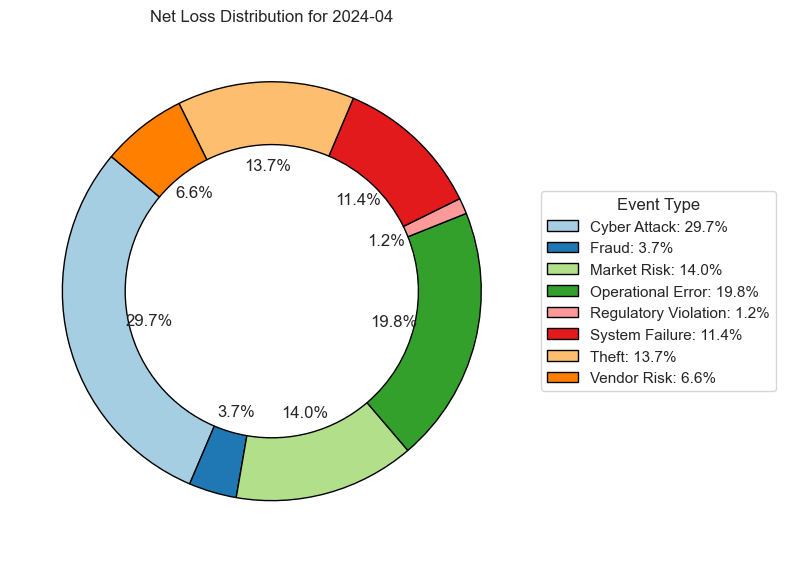

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


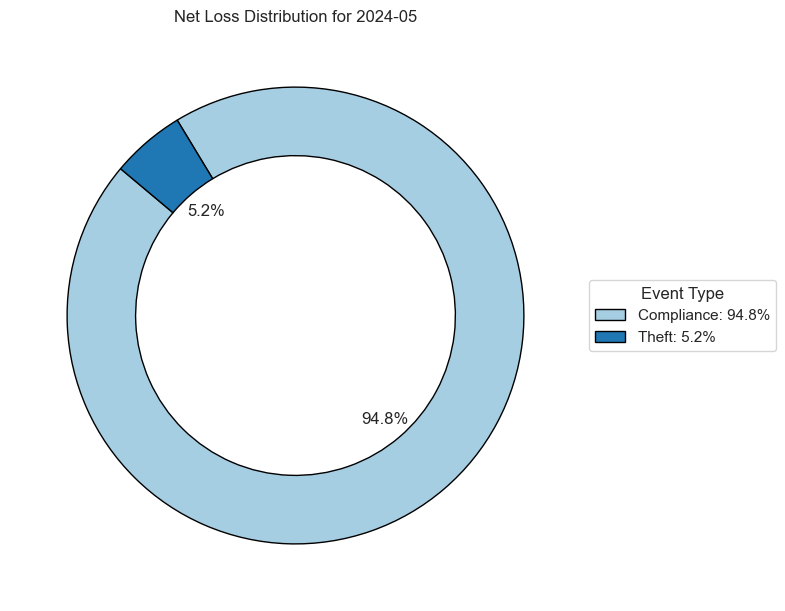

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


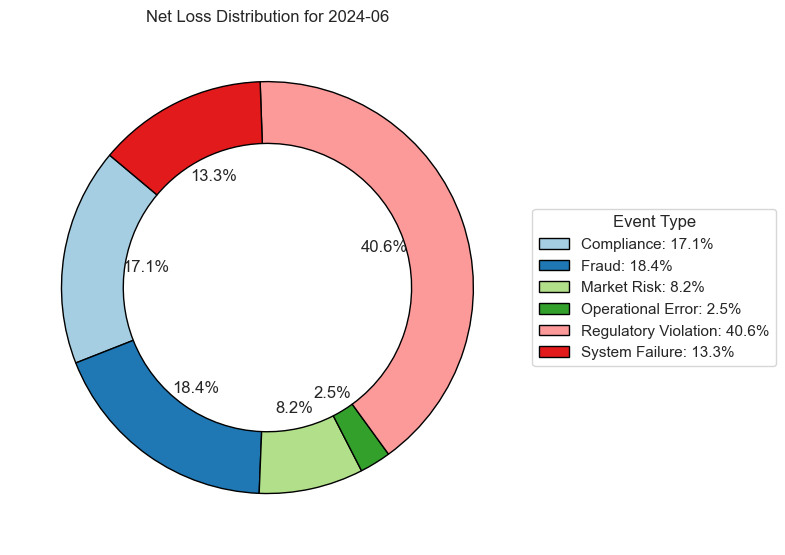

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


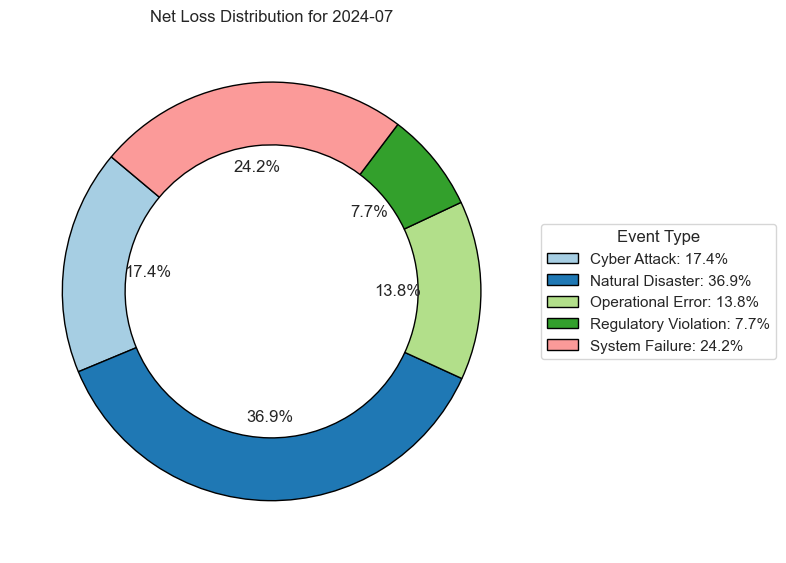

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


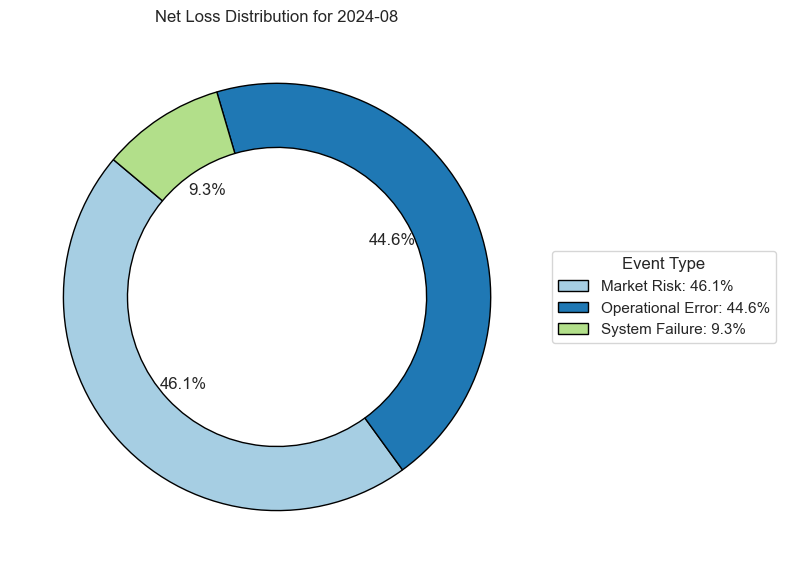

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


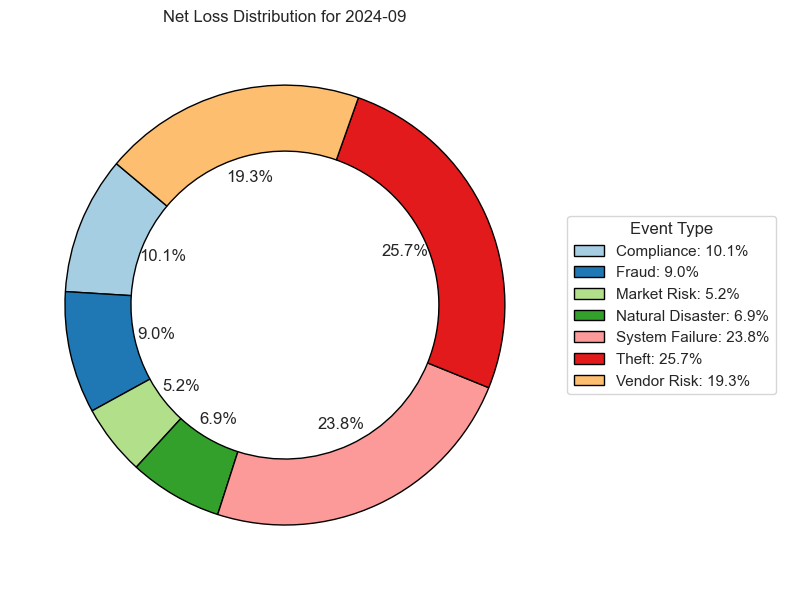

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\289982543.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100


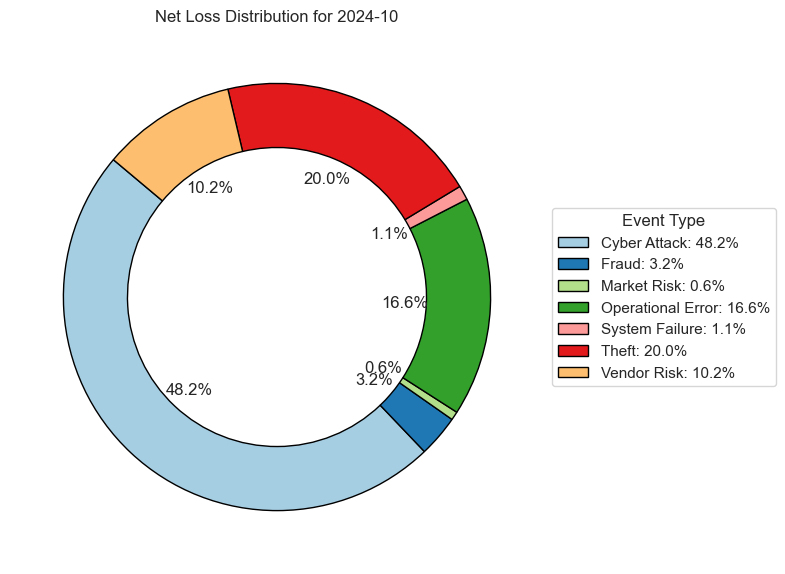

In [45]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming df is your dataframe with 'Date' and 'Net Loss Amount' columns
df['Year'] = df['Date'].dt.year  # Extract year
df['Month'] = df['Date'].dt.month  # Extract month

# Group by Year, Month, and Event Type and sum the Net Loss Amount
grouped_data = df.groupby(['Year', 'Month', 'Event Type']).agg({
    'Net Loss Amount': 'sum'
}).reset_index()

# Remove rows where 'Net Loss Amount' is zero or negative
grouped_data = grouped_data[grouped_data['Net Loss Amount'] > 0]

# Create a Doughnut chart for each year and month
years = grouped_data['Year'].unique()
months = grouped_data['Month'].unique()

# Generate Doughnut charts for each Year
for year in years:
    fig, ax = plt.subplots(figsize=(8, 8))

    # Filter data for the current year
    year_data = grouped_data[grouped_data['Year'] == year]

    # Normalize the Net Loss for the current year
    total_net_loss = year_data['Net Loss Amount'].sum()
    year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100

    # Doughnut chart for Net Loss distribution by Event Type (No labels on the chart itself)
    wedges, texts, autotexts = ax.pie(
        year_data['Net Loss Amount'],
        labels=None,  # No labels on the chart itself
        autopct='%1.1f%%',  # Show percentage on the pie chart
        startangle=140,
        colors=plt.cm.Paired.colors[:len(year_data)],
        wedgeprops={'edgecolor': 'black', 'width': 0.3}  # Doughnut effect with width
    )

    # Title and show the Doughnut chart for the year
    ax.set_title(f"Net Loss Distribution for {year}")
    
    # Legend showing Event Type and percentage
    ax.legend(
        wedges,
        [f"{event}: {year_data[year_data['Event Type'] == event]['Percentage'].values[0]:.1f}%" for event in year_data['Event Type']],
        title="Event Type",
        loc="center left",
        bbox_to_anchor=(1, 0, 0.5, 1)
    )

    plt.tight_layout()
    plt.show()

# Generate Doughnut charts for each Month of each Year
for year in years:
    for month in months:
        fig, ax = plt.subplots(figsize=(8, 8))

        # Filter data for the current year and month
        month_data = grouped_data[(grouped_data['Year'] == year) & (grouped_data['Month'] == month)]

        if month_data.empty:
            continue  # Skip empty months if no data is available

        # Normalize the Net Loss for the current year and month
        total_net_loss = month_data['Net Loss Amount'].sum()
        month_data['Percentage'] = (month_data['Net Loss Amount'] / total_net_loss) * 100

        # Doughnut chart for Net Loss distribution by Event Type (No labels on the chart itself)
        wedges, texts, autotexts = ax.pie(
            month_data['Net Loss Amount'],
            labels=None,  # No labels on the chart itself
            autopct='%1.1f%%',  # Show percentage on the pie chart
            startangle=140,
            colors=plt.cm.Paired.colors[:len(month_data)],
            wedgeprops={'edgecolor': 'black', 'width': 0.3}  # Doughnut effect with width
        )

        # Title and show the Doughnut chart for the month
        ax.set_title(f"Net Loss Distribution for {year}-{month:02d}")
        
        # Legend showing Event Type and percentage
        ax.legend(
            wedges,
            [f"{event}: {month_data[month_data['Event Type'] == event]['Percentage'].values[0]:.1f}%" for event in month_data['Event Type']],
            title="Event Type",
            loc="center left",
            bbox_to_anchor=(1, 0, 0.5, 1)
        )

        plt.tight_layout()
        plt.show()


C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\1248777445.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100


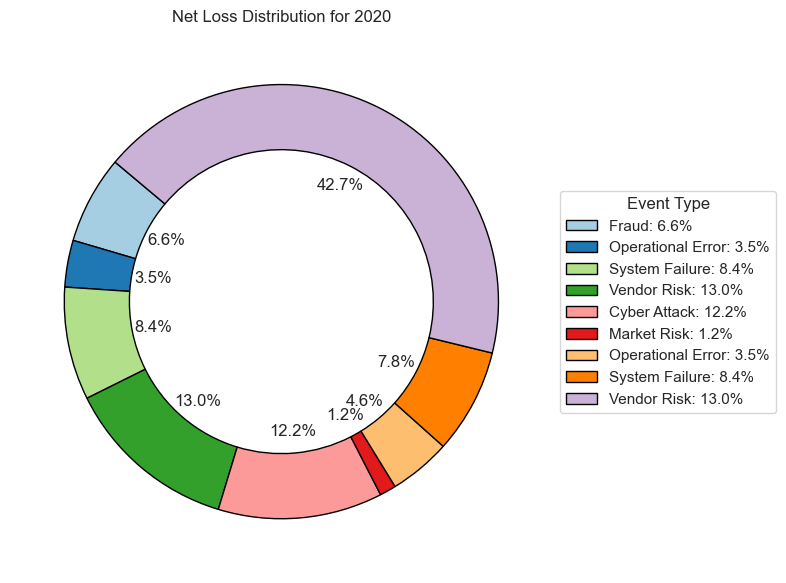

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\1248777445.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100


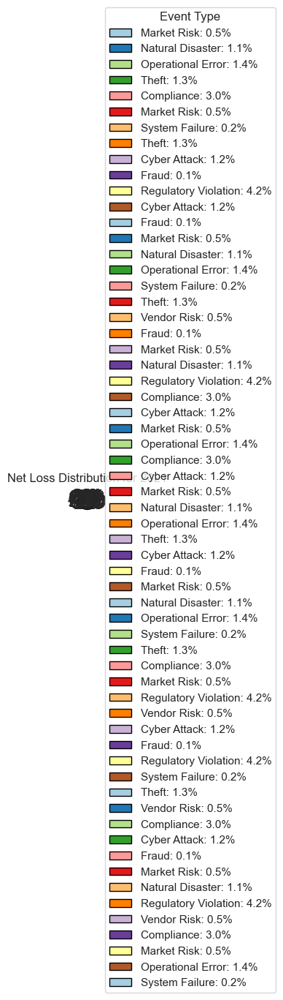

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\1248777445.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100
C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\1248777445.py:52: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


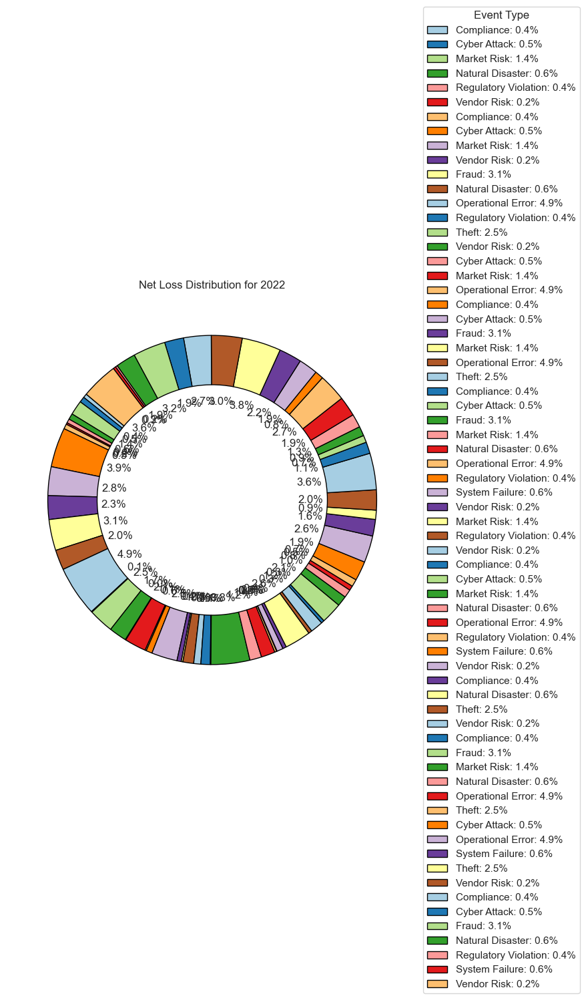

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\1248777445.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100


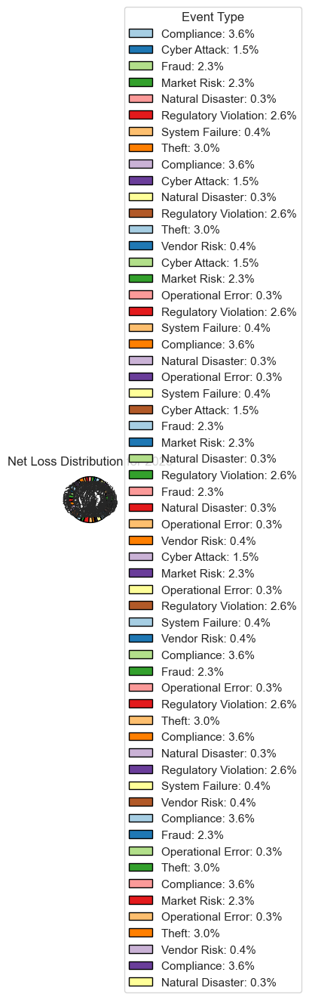

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\1248777445.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100


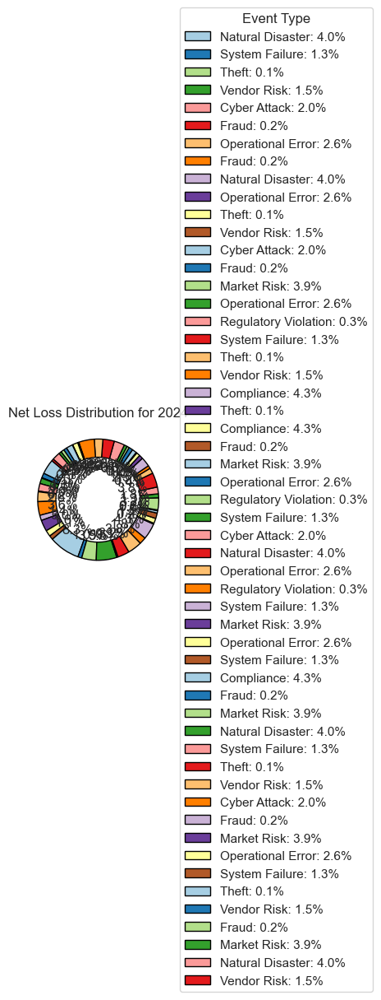

In [46]:
#put inside the per valuein data segment
import matplotlib.pyplot as plt
import pandas as pd

# Assuming df is your dataframe with 'Date' and 'Net Loss Amount' columns
df['Year'] = df['Date'].dt.year  # Extract year
df['Month'] = df['Date'].dt.month  # Extract month

# Group by Year, Month, and Event Type and sum the Net Loss Amount
grouped_data = df.groupby(['Year', 'Month', 'Event Type']).agg({
    'Net Loss Amount': 'sum'
}).reset_index()

# Remove rows where 'Net Loss Amount' is zero or negative
grouped_data = grouped_data[grouped_data['Net Loss Amount'] > 0]

# Create a Doughnut chart for each year
years = grouped_data['Year'].unique()

for year in years:
    fig, ax = plt.subplots(figsize=(8, 8))

    # Filter data for the current year
    year_data = grouped_data[grouped_data['Year'] == year]

    # Normalize the Net Loss for the current year
    total_net_loss = year_data['Net Loss Amount'].sum()
    year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100

    # Doughnut chart for Net Loss distribution by Event Type (with percentage inside the segments)
    wedges, texts, autotexts = ax.pie(
        year_data['Net Loss Amount'],
        labels=None,  # No labels on the chart itself
        autopct='%1.1f%%',  # Show percentage inside the segments
        startangle=140,
        colors=plt.cm.Paired.colors[:len(year_data)],
        wedgeprops={'edgecolor': 'black', 'width': 0.3}  # Doughnut effect with width
    )

    # Title and show the Doughnut chart for the year
    ax.set_title(f"Net Loss Distribution for {year}")

    # Legend showing Event Type and percentage
    ax.legend(
        wedges,
        [f"{event}: {year_data[year_data['Event Type'] == event]['Percentage'].values[0]:.1f}%" for event in year_data['Event Type']],
        title="Event Type",
        loc="center left",
        bbox_to_anchor=(1, 0, 0.5, 1)
    )

    plt.tight_layout()
    plt.show()


C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\1248504341.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100


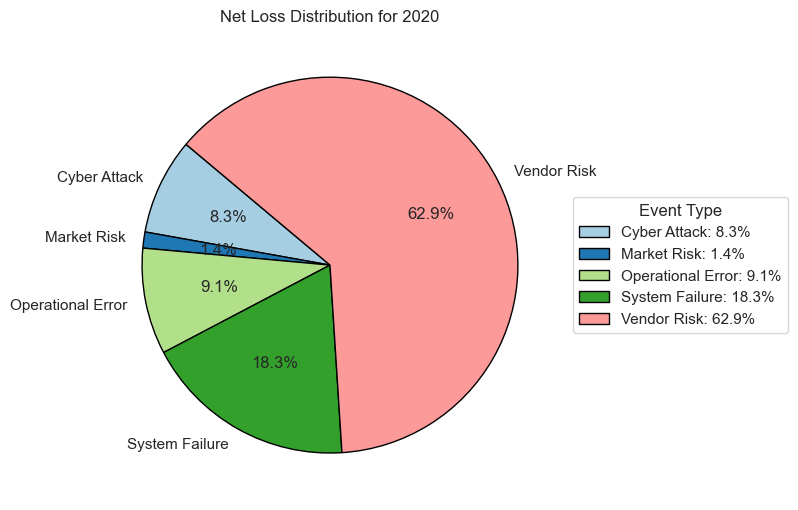

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\1248504341.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100


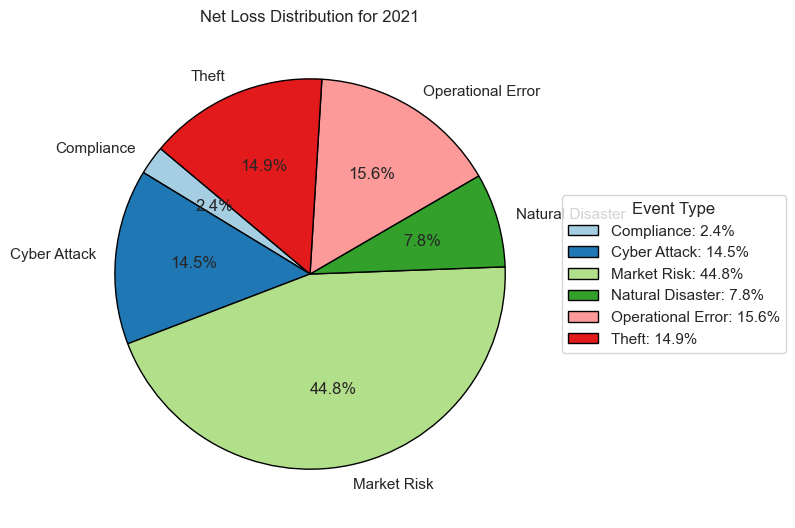

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\1248504341.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100


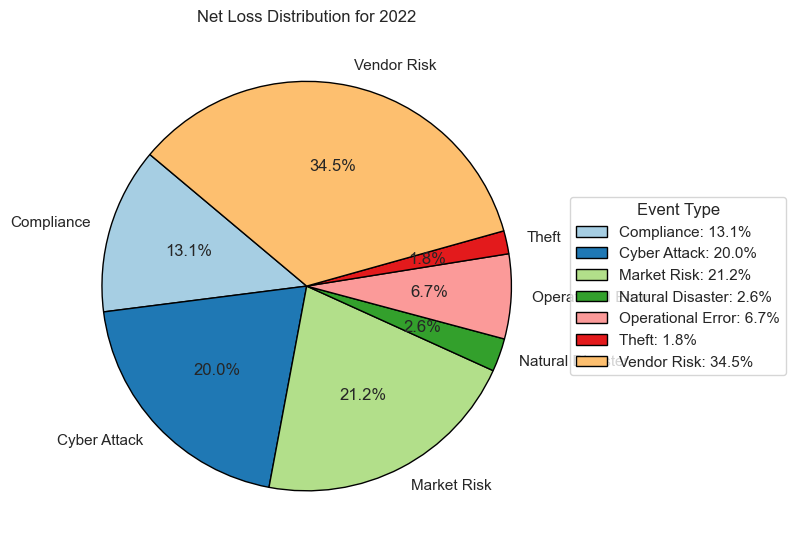

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\1248504341.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100


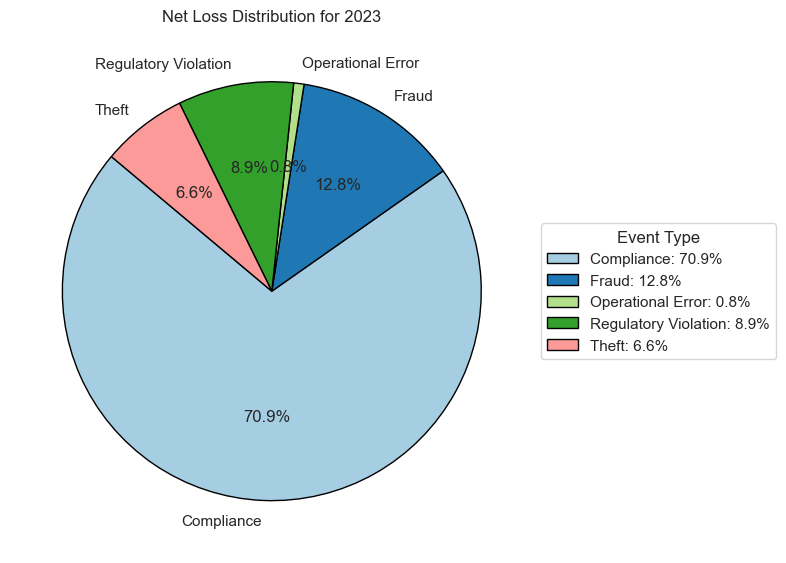

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_23380\1248504341.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100


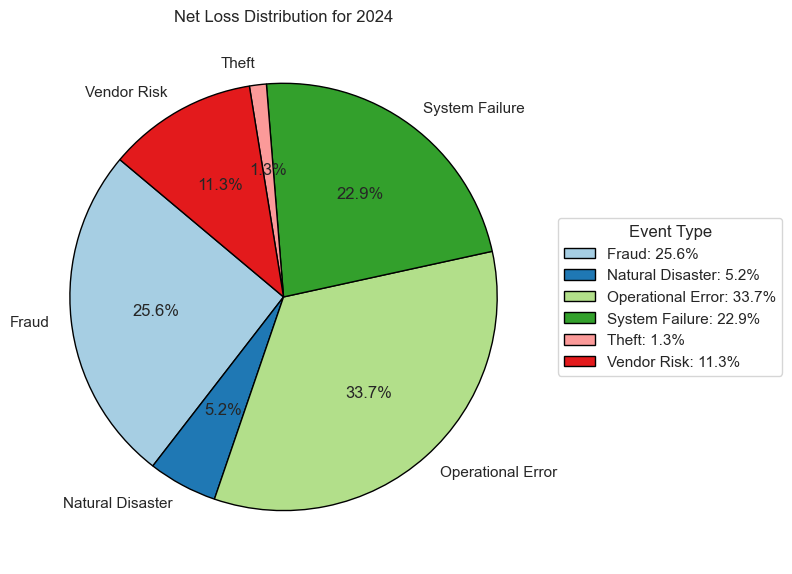

In [42]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming df is your dataframe
df['Year'] = df['Date'].dt.year  # Extract year if not already done

# Group by Year and Event Type and sum the Net Loss Amount
grouped_data = df.groupby(['Year', 'Event Type']).agg({
    'Net Loss Amount': 'sum'
}).reset_index()

# Remove rows where 'Net Loss Amount' is zero or negative
grouped_data = grouped_data[grouped_data['Net Loss Amount'] > 0]

# Create a pie chart for each year
years = grouped_data['Year'].unique()
for year in years:
    fig, ax = plt.subplots(figsize=(8, 8))

    # Filter data for the current year
    year_data = grouped_data[grouped_data['Year'] == year]

    # Normalize the Net Loss for the current year
    total_net_loss = year_data['Net Loss Amount'].sum()
    year_data['Percentage'] = (year_data['Net Loss Amount'] / total_net_loss) * 100

    # Pie chart for Net Loss distribution by Event Type
    wedges, texts, autotexts = ax.pie(
        year_data['Net Loss Amount'],
        labels=year_data['Event Type'],
        autopct='%1.1f%%',  # Show percentage on the pie chart
        startangle=140,
        colors=plt.cm.Paired.colors[:len(year_data)],
        wedgeprops={'edgecolor': 'black'}  # Adds black borders around the wedges
    )

    # Title and show the pie chart for the year
    ax.set_title(f"Net Loss Distribution for {year}")
    ax.legend(
        wedges,
        [f"{event}: {year_data[year_data['Event Type'] == event]['Percentage'].values[0]:.1f}%" for event in year_data['Event Type']],
        title="Event Type",
        loc="center left",
        bbox_to_anchor=(1, 0, 0.5, 1)
    )

    plt.tight_layout()
    plt.show()


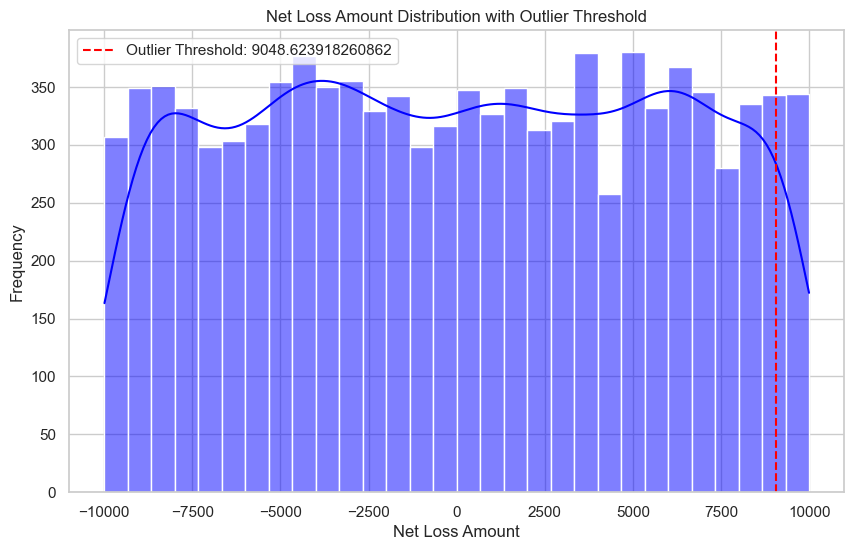

In [50]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Define threshold (e.g., 95th percentile) to identify outliers
threshold = df['Net Loss Amount'].quantile(0.95)
outliers = df[df['Net Loss Amount'] > threshold]

# Plot histogram
plt.figure(figsize=(10, 6))
sns.histplot(df['Net Loss Amount'], kde=True, color='blue', bins=30)
plt.axvline(threshold, color='red', linestyle='--', label=f'Outlier Threshold: {threshold}')
plt.title("Net Loss Amount Distribution with Outlier Threshold")
plt.xlabel("Net Loss Amount")
plt.ylabel("Frequency")
plt.legend()
plt.show()


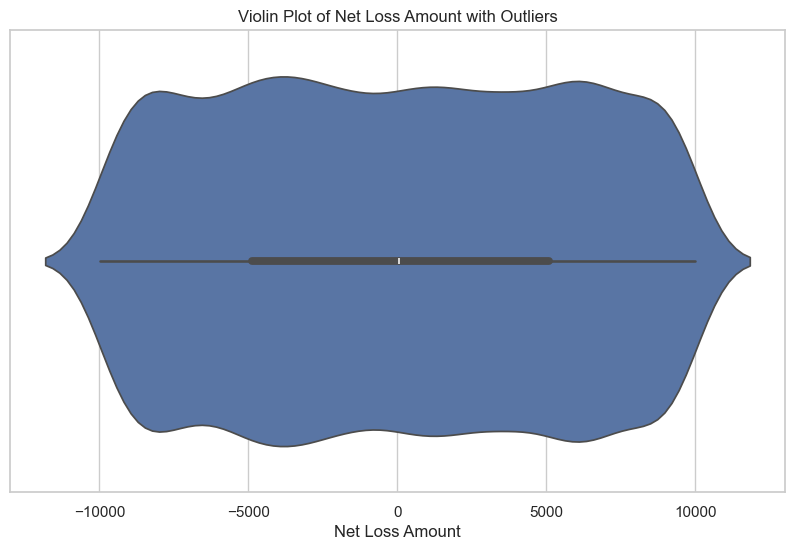

In [51]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

plt.figure(figsize=(10, 6))
sns.violinplot(x=df['Net Loss Amount'])
plt.title("Violin Plot of Net Loss Amount with Outliers")
plt.xlabel("Net Loss Amount")
plt.show()
